Linearni klasifikator

In [ ]:
# step_00_download_and_inspect.py
# ignore this cell; he's autistic
%pip install kagglehub

from pathlib import Path
from collections import Counter

import kagglehub


DATASET_ID = "paultimothymooney/blood-cells"
IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp"}


def find_image_files(root):
    root = Path(root)
    return [p for p in root.rglob("*") if p.suffix.lower() in IMAGE_EXTENSIONS]


def print_tree(root, max_depth=4):
    root = Path(root)
    print(f"\nDataset root:\n{root}\n")

    for path in sorted(root.rglob("*")):
        depth = len(path.relative_to(root).parts)
        if depth > max_depth:
            continue

        indent = "    " * (depth - 1)
        marker = "[DIR]" if path.is_dir() else "[FILE]"
        print(f"{indent}{marker} {path.name}")


def summarize_by_parent_folder(image_paths):
    counts = Counter(p.parent.name for p in image_paths)

    print("\nImage count by immediate parent folder:")
    for folder_name, count in counts.most_common():
        print(f"{folder_name:20s} {count}")


def main():
    dataset_path = kagglehub.dataset_download(DATASET_ID)
    dataset_path = Path(dataset_path)

    print_tree(dataset_path, max_depth=4)

    image_paths = find_image_files(dataset_path)

    print(f"\nTotal image files found: {len(image_paths)}")
    summarize_by_parent_folder(image_paths)

    print("\nFirst 10 image paths:")
    for path in image_paths[:10]:
        print(path)


if __name__ == "__main__":
    main()

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


ImportError: cannot import name 'get_web_endpoint' from 'kagglesdk.kaggle_env' (/home/antonio/.local/lib/python3.10/site-packages/kagglesdk/kaggle_env.py)

In [4]:
from pathlib import Path
from collections import Counter

import torch
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from torchvision import datasets, transforms
from torch.utils.data import DataLoader



DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"

TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"
TEST_SIMPLE_DIR = DATASET_ROOT / "TEST_SIMPLE"

# IMG_SIZE određuje na koju veličinu se slike resizeaju
# BATCH_SIZE koliko slika model obrađuje odjednom u jednom koraku treniranja/testiranja.
IMG_SIZE = 64
BATCH_SIZE = 32
SEED = 42

torch.manual_seed(SEED)
np.random.seed(SEED)

# samo plottamo i izvlačimo statistike
def count_images_by_class(folder):
    counts = {}

    for class_dir in sorted(folder.iterdir()):
        if class_dir.is_dir():
            image_count = len(list(class_dir.glob("*")))
            counts[class_dir.name] = image_count

    return counts


def print_counts(title, counts):
    print(title)
    print("-" * len(title))

    total = sum(counts.values())

    for class_name, count in counts.items():
        percentage = count / total * 100
        print(f"{class_name:12s}: {count:5d} images ({percentage:5.2f}%)")

    print(f"{'TOTAL':12s}: {total:5d} images\n")


train_counts = count_images_by_class(TRAIN_DIR)
test_counts = count_images_by_class(TEST_DIR)

print_counts("TRAIN SET", train_counts)
print_counts("TEST SET", test_counts)

print("Dataset root exists:", DATASET_ROOT.exists())
print("Train dir exists:", TRAIN_DIR.exists())
print("Test dir exists:", TEST_DIR.exists())

TRAIN SET
---------
EOSINOPHIL  :  2497 images (25.08%)
LYMPHOCYTE  :  2483 images (24.94%)
MONOCYTE    :  2478 images (24.89%)
NEUTROPHIL  :  2499 images (25.10%)
TOTAL       :  9957 images

TEST SET
--------
EOSINOPHIL  :   623 images (25.05%)
LYMPHOCYTE  :   620 images (24.93%)
MONOCYTE    :   620 images (24.93%)
NEUTROPHIL  :   624 images (25.09%)
TOTAL       :  2487 images

Dataset root exists: True
Train dir exists: True
Test dir exists: True


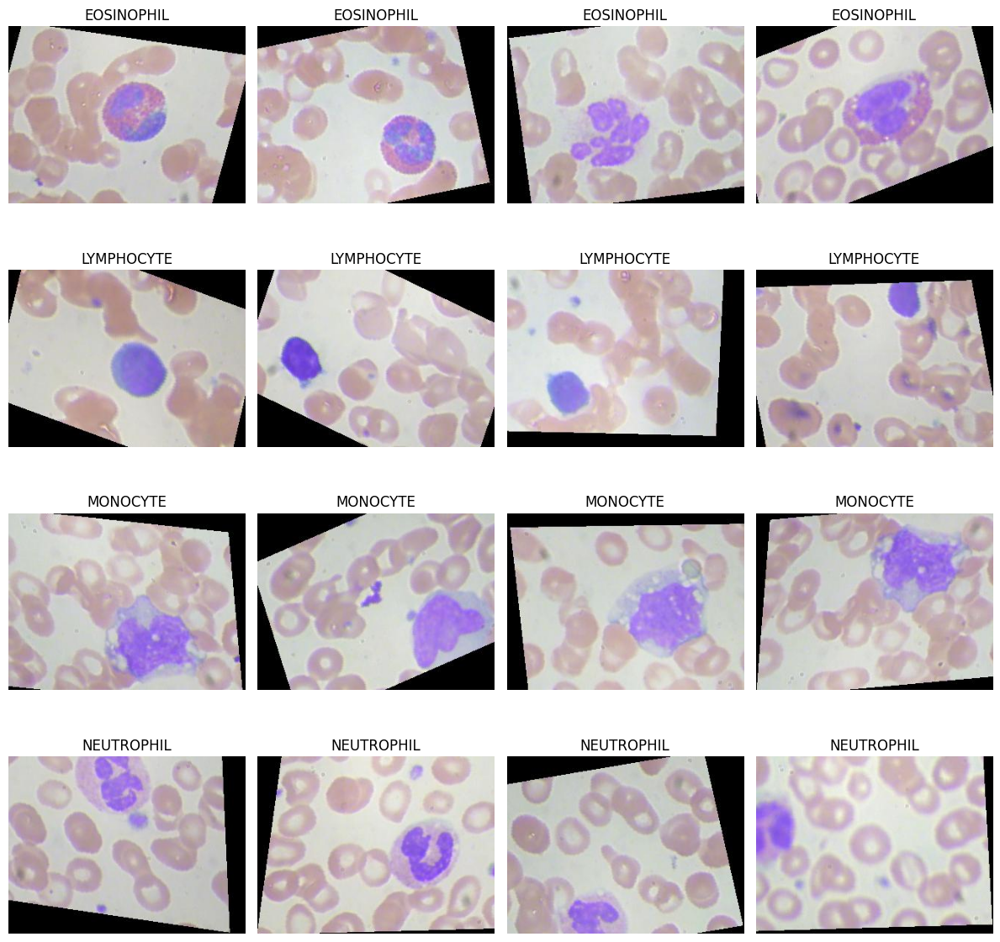

In [5]:
# prikaz slika
# moja subjektivna interpretacija: dataset je dosta težak unatoč činjenici ča ima "samo" 4 klase jer ja sa svojim okom ne kužin razliku među klasama
def show_sample_images(folder, samples_per_class=4):
    class_dirs = [p for p in sorted(folder.iterdir()) if p.is_dir()]

    rows = len(class_dirs)
    cols = samples_per_class

    plt.figure(figsize=(cols * 3, rows * 3))

    plot_idx = 1

    for class_dir in class_dirs:
        image_paths = sorted(list(class_dir.glob("*")))[:samples_per_class]

        for image_path in image_paths:
            image = Image.open(image_path).convert("RGB")

            plt.subplot(rows, cols, plot_idx)
            plt.imshow(image)
            plt.title(class_dir.name)
            plt.axis("off")

            plot_idx += 1

    plt.tight_layout()
    plt.show()


show_sample_images(TRAIN_DIR, samples_per_class=4)

In [ ]:
# resize slika na 64x64 za oba subseta (train i test)
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])

train_dataset = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

# dokle loadamo slike za trening, u svakom batchu napravimo random shuffle da bolje nauči generalizirat
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

# u testu ne shufflamo jer to efektivno nema smisla..test je samo feed slika u model i usporedba s GT klasama
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

print("Classes:", train_dataset.classes)
print("Class to index:", train_dataset.class_to_idx)

print("Train samples:", len(train_dataset))
print("Test samples:", len(test_dataset))

images, labels = next(iter(train_loader))

print("Batch image shape:", images.shape)
print("Batch label shape:", labels.shape)
print("Min pixel value:", images.min().item())
print("Max pixel value:", images.max().item())

'''
Dataset ima 4 klase krvnih stanica mapirane u indekse 0–3,
ukupno 9957 train i 2487 test slika, a jedan batch sadrži 32 RGB slike veličine 64x64 s pripadajućih 32 labela,
pri čemu su pikseli normalizirani u raspon približno 0 do 1.

'''

Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
Class to index: {'EOSINOPHIL': 0, 'LYMPHOCYTE': 1, 'MONOCYTE': 2, 'NEUTROPHIL': 3}
Train samples: 9957
Test samples: 2487
Batch image shape: torch.Size([32, 3, 64, 64])
Batch label shape: torch.Size([32])
Min pixel value: 0.0
Max pixel value: 0.9764705896377563


In [ ]:
# idiot level baseline
# svaku sliku svrstava kao najčešću u datasetu
# dakle, svaka klasa ima identičnu predikciju
# očekujemo accuracy od oko 25%, pošto imamo 4 manje-više uniformno distribuirane klase

def majority_baseline_accuracy(train_dataset, test_dataset):
    train_labels = [label for _, label in train_dataset.samples]
    test_labels = [label for _, label in test_dataset.samples]

    majority_class = Counter(train_labels).most_common(1)[0][0]

    correct = sum(label == majority_class for label in test_labels)
    accuracy = correct / len(test_labels)

    idx_to_class = {idx: class_name for class_name, idx in train_dataset.class_to_idx.items()}

    print("Majority class:", idx_to_class[majority_class])
    print(f"Majority baseline accuracy: {accuracy:.4f}")


majority_baseline_accuracy(train_dataset, test_dataset)

Majority class: NEUTROPHIL
Majority baseline accuracy: 0.2509


U početnom dijelu eksperimenta provedena je provjera strukture i osnovnih statistika dataseta. Potvrđeno je da svi potrebni direktoriji postoje te da se slike pravilno učitavaju iz `TRAIN` i `TEST` skupova. Dataset sadrži četiri klase krvnih stanica: `EOSINOPHIL`, `LYMPHOCYTE`, `MONOCYTE` i `NEUTROPHIL`. Distribucija klasa u oba skupa gotovo je savršeno balansirana, s približno 25% slika po klasi. Zbog toga se accuracy može koristiti kao smislena početna metrika evaluacije, bez potrebe za početnim uvođenjem class weightinga ili drugih metoda za korekciju nebalansiranih podataka.

Slike su resizeane na veličinu `64x64` i pretvorene u tenzore s vrijednostima piksela u rasponu od 0 do 1. Takva rezolucija odabrana je kao jednostavna i računalno jeftina početna postavka, pogodna za brze baseline eksperimente. U ovoj fazi nisu korištene augmentacije ni dodatna normalizacija kako bi se dobio čist početni eksperiment i jasno vidjelo koliko model može naučiti iz osnovnih ulaznih podataka. Trening skup se učitava uz nasumično miješanje podataka, dok se test skup ne miješa jer redoslijed uzoraka ne utječe na evaluaciju.

Kao početna referentna točka izračunat je majority-class baseline, odnosno model koji svaku sliku svrstava u najčešću klasu iz trening skupa. Budući da su klase gotovo jednako zastupljene, očekivana točnost takvog pristupa iznosi približno 25%. Dobivena baseline točnost iznosi 25.09%, što potvrđuje očekivanje i postavlja minimalnu granicu koju svaki stvarni model mora značajno nadmašiti. Ovaj dio eksperimenta time služi kao sanity check dataseta i početna referenca za usporedbu svih kasnijih modela.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

from tqdm.auto import tqdm


# ako postoji grafička kartica, koristi nju; inače koristi procesor
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# jedna slika ima 3 kanala jer je RGB
# svaki kanal ima IMG_SIZE x IMG_SIZE piksela
# za 64x64 RGB sliku input_dim = 3 * 64 * 64
INPUT_DIM = 3 * IMG_SIZE * IMG_SIZE

# broj klasa uzimamo direktno iz dataseta
# u našem slučaju: EOSINOPHIL, LYMPHOCYTE, MONOCYTE, NEUTROPHIL
NUM_CLASSES = len(train_dataset.classes)

# broj epoha
# 10 epoha znači da model 10 puta prolazi kroz cijeli train dataset
EPOCHS = 10

# learning rate
# određuje koliko jako mijenjamo težine modela nakon svake greške
# 1e-3 = 0.001
LR = 1e-3


# najjednostavniji mogući model
# uzme sliku, izravna je u jedan dugi vektor i pošalje u linearni sloj
class LinearClassifier(nn.Module):
    def __init__(self, input_dim, num_classes):
        super().__init__()

        # pretvara sliku oblika [3, 64, 64] u jedan dugi vektor
        self.flatten = nn.Flatten()

        # linearni klasifikator
        # prima sve piksele kao ulaz i vraća score za svaku klasu
        self.classifier = nn.Linear(input_dim, num_classes)

    def forward(self, x):
        # flattenamo slike
        x = self.flatten(x)

        # šaljemo flattenane slike kroz linearni sloj
        x = self.classifier(x)

        # vraćamo raw scoreove za klase
        # softmax ne stavljamo ručno jer CrossEntropyLoss to rješava interno
        return x


def train_one_epoch(model, loader, criterion, optimizer, device):
    # prebacujemo model u train mode
    # ovo je bitno za slojeve poput dropout/batchnorm, iako ih ovdje nemamo
    model.train()

    # ukupni loss kroz epohu
    running_loss = 0.0

    # broj točnih predikcija
    correct = 0

    # ukupan broj obrađenih slika
    total = 0

    # prolazimo batch po batch kroz train podatke
    for images, labels in tqdm(loader, desc="Training", leave=False):
        # šaljemo slike i labele na GPU ili CPU
        images = images.to(device)
        labels = labels.to(device)

        # resetiramo stare gradijente
        # ako ovo ne napravimo, gradijenti se zbrajaju iz batcha u batch
        optimizer.zero_grad()

        # model radi predikciju
        outputs = model(images)

        # računamo koliko je model pogriješio
        loss = criterion(outputs, labels)

        # backpropagation
        # računamo gradijente, tj. u kojem smjeru treba mijenjati težine
        loss.backward()

        # optimizer ažurira težine modela
        optimizer.step()

        # loss.item() je prosječni loss za batch
        # množimo s brojem slika da dobijemo ukupan loss za taj batch
        running_loss += loss.item() * images.size(0)

        # uzimamo klasu s najvećim scoreom kao predikciju
        preds = outputs.argmax(dim=1)

        # brojimo koliko je predikcija točno
        correct += (preds == labels).sum().item()

        # brojimo koliko smo ukupno slika obradili
        total += labels.size(0)

    # prosječni loss kroz cijelu epohu
    epoch_loss = running_loss / total

    # accuracy kroz cijelu epohu
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


def evaluate(model, loader, criterion, device):
    # prebacujemo model u eval mode
    # ovo znači: ne treniramo, samo testiramo
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    # ovdje spremamo sve predikcije i stvarne labele
    # kasnije nam trebaju za confusion matrix i dodatnu analizu
    all_preds = []
    all_labels = []

    # gasimo računanje gradijenata
    # kod evaluacije ne učimo, pa nema potrebe trošiti memoriju na gradijente
    with torch.no_grad():
        # prolazimo batch po batch kroz test podatke
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            # model radi predikciju
            outputs = model(images)

            # računamo test loss
            loss = criterion(outputs, labels)

            # spremamo ukupni loss
            running_loss += loss.item() * images.size(0)

            # uzimamo klasu s najvećim scoreom
            preds = outputs.argmax(dim=1)

            # brojimo točne predikcije
            correct += (preds == labels).sum().item()

            # brojimo ukupan broj slika
            total += labels.size(0)

            # prebacujemo predikcije i labele nazad na CPU i spremamo ih
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # prosječni loss na test setu
    epoch_loss = running_loss / total

    # accuracy na test setu
    epoch_acc = correct / total

    return epoch_loss, epoch_acc, all_labels, all_preds


# kreiramo linearni model i šaljemo ga na GPU ili CPU
linear_model = LinearClassifier(INPUT_DIM, NUM_CLASSES).to(DEVICE)

# loss funkcija za multi-class klasifikaciju
# koristi se kada imamo više klasa i svaka slika pripada točno jednoj klasi
criterion = nn.CrossEntropyLoss()

# Adam optimizer mijenja težine modela na temelju gradijenata
optimizer = optim.Adam(linear_model.parameters(), lr=LR)

print("Device:", DEVICE)
print(linear_model)

# ovdje spremamo rezultate kroz epohe
# kasnije možemo crtati train/test loss i accuracy grafove
history_linear = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": [],
}

# glavna training petlja
# svaka iteracija je jedna epoha
for epoch in range(EPOCHS):
    # treniramo model jednu epohu
    train_loss, train_acc = train_one_epoch(
        linear_model,
        train_loader,
        criterion,
        optimizer,
        DEVICE
    )

    # testiramo model nakon te epohe
    test_loss, test_acc, y_true_linear, y_pred_linear = evaluate(
        linear_model,
        test_loader,
        criterion,
        DEVICE
    )

    # spremamo train rezultate
    history_linear["train_loss"].append(train_loss)
    history_linear["train_acc"].append(train_acc)

    # spremamo test rezultate
    history_linear["test_loss"].append(test_loss)
    history_linear["test_acc"].append(test_acc)

    # ispisujemo rezultate trenutne epohe
    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f}"
    )

Device: cpu
LinearClassifier(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (classifier): Linear(in_features=12288, out_features=4, bias=True)
)


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Epoch [1/10] Train Loss: 1.7998 | Train Acc: 0.2581 | Test Loss: 1.4898 | Test Acc: 0.2887


Epoch [2/10] Train Loss: 1.6788 | Train Acc: 0.2878 | Test Loss: 2.1333 | Test Acc: 0.2505


Epoch [3/10] Train Loss: 1.6364 | Train Acc: 0.3201 | Test Loss: 1.8060 | Test Acc: 0.3136


Epoch [4/10] Train Loss: 1.6228 | Train Acc: 0.3196 | Test Loss: 2.2377 | Test Acc: 0.2573


Epoch [5/10] Train Loss: 1.6359 | Train Acc: 0.3418 | Test Loss: 1.8334 | Test Acc: 0.2533


Epoch [6/10] Train Loss: 1.6026 | Train Acc: 0.3474 | Test Loss: 2.6634 | Test Acc: 0.2650


Epoch [7/10] Train Loss: 1.6040 | Train Acc: 0.3518 | Test Loss: 1.4628 | Test Acc: 0.3828


Epoch [8/10] Train Loss: 1.4782 | Train Acc: 0.3668 | Test Loss: 2.4632 | Test Acc: 0.2537


Epoch [9/10] Train Loss: 1.5068 | Train Acc: 0.3686 | Test Loss: 2.7840 | Test Acc: 0.2807


Epoch [10/10] Train Loss: 1.5328 | Train Acc: 0.3848 | Test Loss: 2.1213 | Test Acc: 0.2947


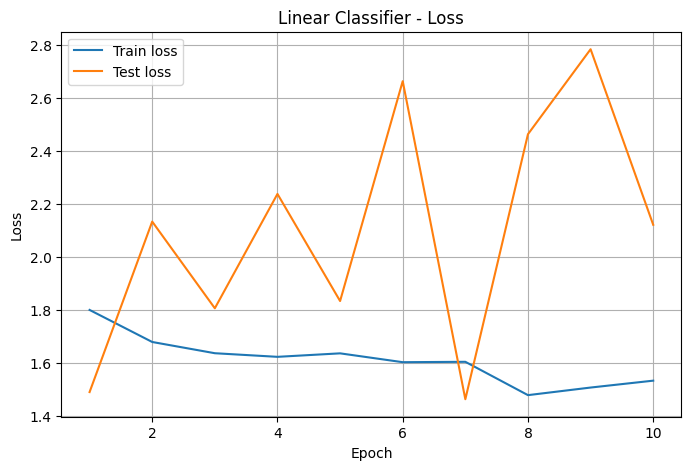

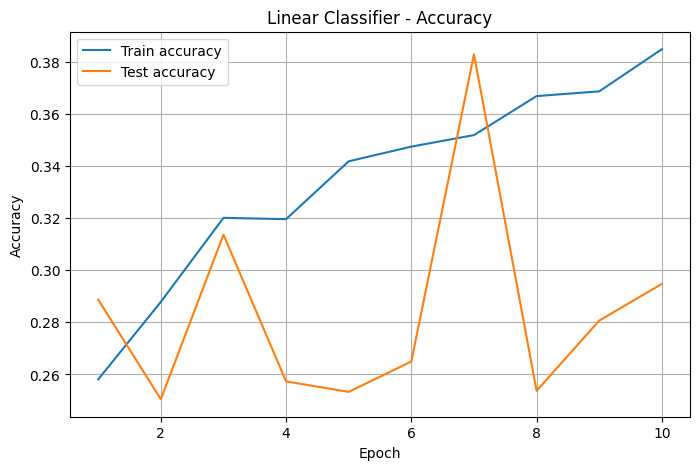

In [11]:
def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_training_history(history_linear, "Linear Classifier")

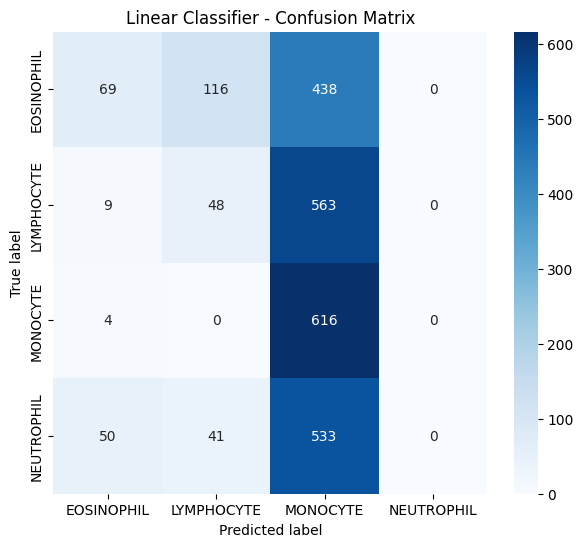

              precision    recall  f1-score   support

  EOSINOPHIL       0.52      0.11      0.18       623
  LYMPHOCYTE       0.23      0.08      0.12       620
    MONOCYTE       0.29      0.99      0.44       620
  NEUTROPHIL       0.00      0.00      0.00       624

    accuracy                           0.29      2487
   macro avg       0.26      0.30      0.19      2487
weighted avg       0.26      0.29      0.19      2487



/home/antonio/Desktop/NMDU_cells/nmdu_venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/antonio/Desktop/NMDU_cells/nmdu_venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/antonio/Desktop/NMDU_cells/nmdu_venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(averag

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_confusion_matrix(
    y_true_linear,
    y_pred_linear,
    train_dataset.classes,
    "Linear Classifier - Confusion Matrix"
)

print(classification_report(
    y_true_linear,
    y_pred_linear,
    target_names=train_dataset.classes
))


#Model uči nešto malo, ali jako slabo: train accuracy raste do ~38%, dok test accuracy skače između ~25–38%, što znači da je linearni classifier jedva bolji od “idiot baselinea” i dosta nestabilan.

#Classification report pokazuje da model praktički favorizira MONOCYTE klasu, dok NEUTROPHIL uopće ne prepoznaje, pa je jasno da flatten + linearni sloj ne hvata dobro vizualne obrasce krvnih stanica.

#Zaključak: kao početni baseline je super, ali za ozbiljniji rezultat treba ići na MLP ili CNN, jer ovakav model gleda piksele previše “glupo” i nema pojma o oblicima, rubovima i teksturi.

## Linear classifier baseline

Nakon početne analize dataseta i majority-class baselinea, prvi stvarni model implementiran je kao jednostavni linearni klasifikator. Cilj ovog eksperimenta bio je dobiti osnovnu referentnu točku za usporedbu s kasnijim složenijim modelima. Ulazna RGB slika veličine `64x64` izravnava se u vektor dimenzije `3 * 64 * 64 = 12288`, nakon čega se šalje u jedan linearni sloj koji vraća četiri izlaza, po jedan za svaku klasu krvnih stanica.

Za treniranje je korištena `CrossEntropyLoss` funkcija, prikladna za višeklasnu klasifikaciju, te `Adam` optimizer s learning rateom `0.001`. Model je treniran kroz 10 epoha. Budući da arhitektura nema konvolucijske slojeve, ne može učiti lokalne vizualne obrasce poput rubova, tekstura i oblika stanica. Umjesto toga, sliku promatra kao običan niz piksela, čime se gubi prostorna struktura slike.

Rezultati pokazuju da model uči vrlo ograničeno. Trening accuracy raste s približno 25.81% na 38.48%, što znači da model hvata dio signala iz podataka. Međutim, test accuracy je nestabilan i varira između približno 25% i 38%. Najbolji test accuracy iznosi 38.28%, ali se u više epoha rezultat vraća blizu majority-class baselinea od 25.09%. To pokazuje da model ne uči stabilne i generalizabilne značajke.

Dodatna analiza predikcija pokazuje da model favorizira pojedine klase, posebno `MONOCYTE`, dok `NEUTROPHIL` gotovo uopće ne prepoznaje. Takvo ponašanje potvrđuje da linearni klasifikator nema dovoljnu izražajnost za razlikovanje vizualno sličnih krvnih stanica.

Zaključno, linearni klasifikator je koristan kao početni baseline jer pokazuje da u podacima postoji određeni signal, ali nije dovoljno snažan za ozbiljnu klasifikaciju. Model je nestabilan, preplitak i ne koristi prostornu strukturu slike. Sljedeći logičan korak je uvođenje složenije arhitekture, poput MLP-a ili konvolucijske neuronske mreže.


Device: cpu
OneHiddenLayerMLP(
  (model): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=12288, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=4, bias=True)
  )
)


Epoch [1/15] Train Loss: 1.6461 | Train Acc: 0.2489 | Test Loss: 1.4208 | Test Acc: 0.2505


Epoch [2/15] Train Loss: 1.3915 | Train Acc: 0.2495 | Test Loss: 1.3865 | Test Acc: 0.2509


Epoch [3/15] Train Loss: 1.3865 | Train Acc: 0.2472 | Test Loss: 1.3864 | Test Acc: 0.2509


Epoch [4/15] Train Loss: 1.3864 | Train Acc: 0.2475 | Test Loss: 1.3863 | Test Acc: 0.2509


Epoch [5/15] Train Loss: 1.3864 | Train Acc: 0.2465 | Test Loss: 1.3863 | Test Acc: 0.2509


Epoch [6/15] Train Loss: 1.3864 | Train Acc: 0.2496 | Test Loss: 1.3863 | Test Acc: 0.2505


Epoch [7/15] Train Loss: 1.3864 | Train Acc: 0.2455 | Test Loss: 1.3863 | Test Acc: 0.2501


Epoch [8/15] Train Loss: 1.3864 | Train Acc: 0.2433 | Test Loss: 1.3863 | Test Acc: 0.2505


Epoch [9/15] Train Loss: 1.3864 | Train Acc: 0.2461 | Test Loss: 1.3863 | Test Acc: 0.2505


Epoch [10/15] Train Loss: 1.3864 | Train Acc: 0.2526 | Test Loss: 1.3863 | Test Acc: 0.2505


Epoch [11/15] Train Loss: 1.3864 | Train Acc: 0.2487 | Test Loss: 1.3863 | Test Acc: 0.2505


Epoch [12/15] Train Loss: 1.3864 | Train Acc: 0.2497 | Test Loss: 1.3863 | Test Acc: 0.2505


Epoch [13/15] Train Loss: 1.3864 | Train Acc: 0.2485 | Test Loss: 1.3863 | Test Acc: 0.2505


Epoch [14/15] Train Loss: 1.3864 | Train Acc: 0.2410 | Test Loss: 1.3863 | Test Acc: 0.2505


Epoch [15/15] Train Loss: 1.3864 | Train Acc: 0.2471 | Test Loss: 1.3863 | Test Acc: 0.2509

Best test accuracy: 0.2509
Best epoch: 2


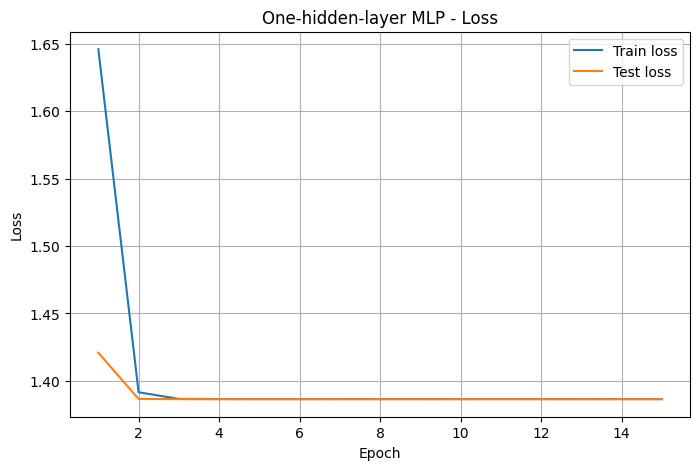

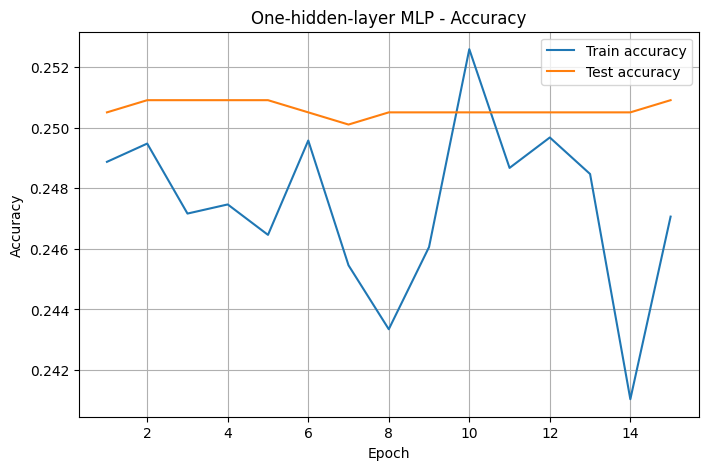

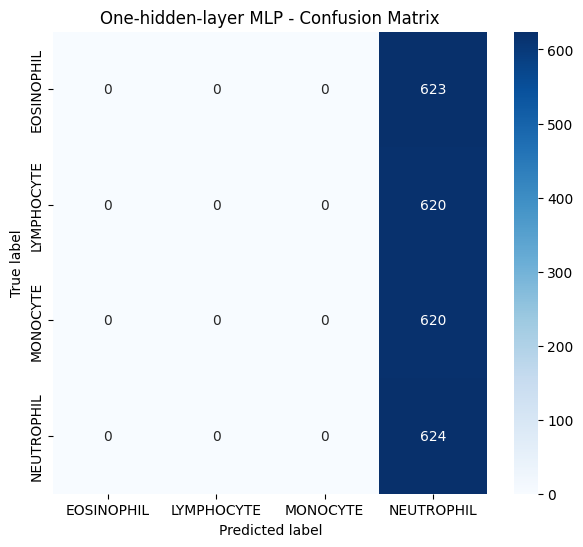

              precision    recall  f1-score   support

  EOSINOPHIL       0.00      0.00      0.00       623
  LYMPHOCYTE       0.00      0.00      0.00       620
    MONOCYTE       0.00      0.00      0.00       620
  NEUTROPHIL       0.25      1.00      0.40       624

    accuracy                           0.25      2487
   macro avg       0.06      0.25      0.10      2487
weighted avg       0.06      0.25      0.10      2487



/home/antonio/Desktop/NMDU_cells/nmdu_venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/antonio/Desktop/NMDU_cells/nmdu_venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/antonio/Desktop/NMDU_cells/nmdu_venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(averag

In [13]:
# ============================================================
# STEP 08 — One-hidden-layer MLP
# ============================================================
#
# Evaluation of previous step:
# The linear classifier achieved only around 29.47% test accuracy,
# which is only slightly better than the majority baseline of 25.09%.
# The classification report showed that the model heavily over-predicted
# the MONOCYTE class, with almost zero useful recognition of NEUTROPHIL.
#
# Interpretation:
# A single linear layer is not expressive enough for this image
# classification problem. It can only learn linear decision boundaries over
# raw pixel values, without modeling complex visual patterns such as cell
# shape, texture, color distribution, and local structures.
#
# Next decision:
# We now introduce a small MLP with one hidden layer and ReLU activation.
# This adds non-linearity and should allow the model to learn more complex
# relationships between pixels, while still keeping the architecture simple
# and clearly different from a CNN.
# ============================================================

import torch
import torch.nn as nn
import torch.optim as optim

from tqdm.auto import tqdm
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

INPUT_DIM = 3 * IMG_SIZE * IMG_SIZE
NUM_CLASSES = len(train_dataset.classes)

EPOCHS = 15
LR = 1e-3
HIDDEN_DIM = 256


class OneHiddenLayerMLP(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_classes):
        super().__init__()

        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, num_classes)
        )

    def forward(self, x):
        return self.model(x)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc, all_labels, all_preds


mlp_1_model = OneHiddenLayerMLP(
    input_dim=INPUT_DIM,
    hidden_dim=HIDDEN_DIM,
    num_classes=NUM_CLASSES
).to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(mlp_1_model.parameters(), lr=LR)

print("Device:", DEVICE)
print(mlp_1_model)

history_mlp_1 = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": [],
}

best_test_acc = 0.0
best_epoch = 0
best_y_true_mlp_1 = None
best_y_pred_mlp_1 = None

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        mlp_1_model,
        train_loader,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true_mlp_1, y_pred_mlp_1 = evaluate(
        mlp_1_model,
        test_loader,
        criterion,
        DEVICE
    )

    history_mlp_1["train_loss"].append(train_loss)
    history_mlp_1["train_acc"].append(train_acc)
    history_mlp_1["test_loss"].append(test_loss)
    history_mlp_1["test_acc"].append(test_acc)

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true_mlp_1 = y_true_mlp_1
        best_y_pred_mlp_1 = y_pred_mlp_1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f}"
    )

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")

def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_training_history(history_mlp_1, "One-hidden-layer MLP")

def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_confusion_matrix(
    best_y_true_mlp_1,
    best_y_pred_mlp_1,
    train_dataset.classes,
    "One-hidden-layer MLP - Confusion Matrix"
)

print(classification_report(
    best_y_true_mlp_1,
    best_y_pred_mlp_1,
    target_names=train_dataset.classes
))

## One-hidden-layer MLP

Nakon slabih rezultata linearnog klasifikatora uveden je jednostavni MLP s jednim skrivenim slojem. Cilj ove promjene bio je dodati nelinearnost u model pomoću `ReLU` aktivacije i omogućiti učenje složenijih odnosa među pikselima. Arhitektura se sastoji od izravnavanja slike, linearnog sloja s 256 neurona, `ReLU` aktivacije i završnog linearnog sloja s četiri izlaza.

Model je treniran 15 epoha koristeći `CrossEntropyLoss` i `Adam` optimizer s learning rateom `0.001`. Iako je MLP izražajniji od običnog linearnog klasifikatora, i dalje koristi flattenane slike. To znači da model ne iskorištava prirodnu prostornu strukturu slike. Drugim riječima, ne analizira lokalne vizualne obrasce poput rubova, tekstura i oblika stanica, nego sliku i dalje promatra kao jedan dugi niz piksela.

Rezultati pokazuju da model nije uspio naučiti korisne značajke. Train accuracy ostaje oko 25%, a test accuracy također ostaje oko 25%, što je praktički jednako majority-class baselineu od 25.09%. Test loss se stabilizira na približno `1.3863`, što odgovara očekivanom lossu za neinformativne predikcije nad četiri balansirane klase. Najbolji test accuracy iznosi 25.09%, postignut već u drugoj epohi.

U usporedbi s linearnim klasifikatorom, ovaj MLP daje još slabiji praktični rezultat. Linearni model je barem povremeno dosezao oko 38% test accuracyja, dok se MLP potpuno zadržava na razini slučajnog pogađanja. To pokazuje da samo dodavanje jednog skrivenog sloja nije dovoljno za ovaj problem, posebno zato što model i dalje ne koristi lokalnu strukturu slike.

Zaključno, one-hidden-layer MLP nije donio poboljšanje. Model je nelinearan, ali i dalje nije prikladan za izvlačenje vizualnih značajki iz slika. Budući da ni linearni model ni jednostavni MLP ne uspijevaju stabilno naučiti korisne obrasce, sljedeći logičan korak je prelazak na konvolucijsku neuronsku mrežu, koja može učiti lokalne značajke poput oblika, rubova i tekstura krvnih stanica.


Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
StabilizedMLP(
  (model): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=12288, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=4, bias=True)
  )
)


Epoch [1/20] Train Loss: 1.3878 | Train Acc: 0.2705 | Test Loss: 1.3634 | Test Acc: 0.3160


Epoch [2/20] Train Loss: 1.3607 | Train Acc: 0.3190 | Test Loss: 1.3371 | Test Acc: 0.3631


Epoch [3/20] Train Loss: 1.3379 | Train Acc: 0.3462 | Test Loss: 1.3175 | Test Acc: 0.3571


Epoch [4/20] Train Loss: 1.3147 | Train Acc: 0.3732 | Test Loss: 1.2947 | Test Acc: 0.3916


Epoch [5/20] Train Loss: 1.2953 | Train Acc: 0.3897 | Test Loss: 1.3096 | Test Acc: 0.3756


Epoch [6/20] Train Loss: 1.2836 | Train Acc: 0.3910 | Test Loss: 1.2759 | Test Acc: 0.3997


Epoch [7/20] Train Loss: 1.2647 | Train Acc: 0.4139 | Test Loss: 1.3032 | Test Acc: 0.3490


Epoch [8/20] Train Loss: 1.2505 | Train Acc: 0.4216 | Test Loss: 1.2697 | Test Acc: 0.3949


Epoch [9/20] Train Loss: 1.2435 | Train Acc: 0.4277 | Test Loss: 1.2801 | Test Acc: 0.3989


Epoch [10/20] Train Loss: 1.2294 | Train Acc: 0.4427 | Test Loss: 1.2797 | Test Acc: 0.3912


Epoch [11/20] Train Loss: 1.2163 | Train Acc: 0.4490 | Test Loss: 1.2766 | Test Acc: 0.3563


Epoch [12/20] Train Loss: 1.2030 | Train Acc: 0.4568 | Test Loss: 1.2743 | Test Acc: 0.3768


Epoch [13/20] Train Loss: 1.1926 | Train Acc: 0.4675 | Test Loss: 1.3038 | Test Acc: 0.3478


Epoch [14/20] Train Loss: 1.1900 | Train Acc: 0.4669 | Test Loss: 1.3002 | Test Acc: 0.3603


Epoch [15/20] Train Loss: 1.1775 | Train Acc: 0.4798 | Test Loss: 1.3044 | Test Acc: 0.3965


Epoch [16/20] Train Loss: 1.1664 | Train Acc: 0.4805 | Test Loss: 1.2868 | Test Acc: 0.3796


Epoch [17/20] Train Loss: 1.1568 | Train Acc: 0.4898 | Test Loss: 1.2997 | Test Acc: 0.3522


Epoch [18/20] Train Loss: 1.1470 | Train Acc: 0.4949 | Test Loss: 1.2980 | Test Acc: 0.3973


Epoch [19/20] Train Loss: 1.1360 | Train Acc: 0.5017 | Test Loss: 1.2839 | Test Acc: 0.3888


Epoch [20/20] Train Loss: 1.1307 | Train Acc: 0.5047 | Test Loss: 1.3158 | Test Acc: 0.3776

Best test accuracy: 0.3997
Best epoch: 6


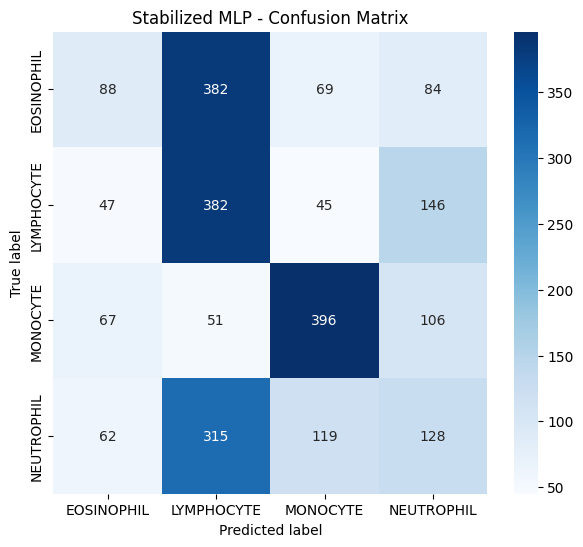

              precision    recall  f1-score   support

  EOSINOPHIL       0.33      0.14      0.20       623
  LYMPHOCYTE       0.34      0.62      0.44       620
    MONOCYTE       0.63      0.64      0.63       620
  NEUTROPHIL       0.28      0.21      0.24       624

    accuracy                           0.40      2487
   macro avg       0.39      0.40      0.38      2487
weighted avg       0.39      0.40      0.38      2487



In [15]:
# ============================================================
# STEP 09 — Stabilized one-hidden-layer MLP
# ============================================================
#
# Evaluation of previous step:
# The one-hidden-layer MLP performed worse than the linear classifier.
# Test accuracy dropped to around 26%, which is almost the same as the
# majority baseline. The classification report shows that the model mostly
# predicted NEUTROPHIL and failed to learn useful decision boundaries for
# EOSINOPHIL and LYMPHOCYTE.
#
# Interpretation:
# This suggests that the MLP training is unstable. The model receives raw
# flattened pixel values without normalization, and the learning rate may be
# too aggressive for this architecture. Since MLPs do not use spatial image
# structure, they are already at a disadvantage, so stable optimization is
# especially important.
#
# Next decision:
# We keep the same one-hidden-layer MLP architecture, but improve the training
# setup using input normalization, a smaller learning rate, and weight decay.
# This is the smallest reasonable tweak before moving to CNNs.
# ============================================================

from pathlib import Path

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")


DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"

TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
INPUT_DIM = 3 * IMG_SIZE * IMG_SIZE
NUM_CLASSES = 4

EPOCHS = 20
LR = 1e-4
WEIGHT_DECAY = 1e-4
HIDDEN_DIM = 256

SEED = 42
torch.manual_seed(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_norm = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_norm = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

train_loader_norm = DataLoader(
    train_dataset_norm,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

test_loader_norm = DataLoader(
    test_dataset_norm,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)


class StabilizedMLP(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_classes):
        super().__init__()

        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, num_classes)
        )

    def forward(self, x):
        return self.model(x)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


mlp_stabilized = StabilizedMLP(
    input_dim=INPUT_DIM,
    hidden_dim=HIDDEN_DIM,
    num_classes=NUM_CLASSES
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    mlp_stabilized.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

print("Device:", DEVICE)
print("Classes:", train_dataset_norm.classes)
print(mlp_stabilized)

history_mlp_stabilized = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        mlp_stabilized,
        train_loader_norm,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        mlp_stabilized,
        test_loader_norm,
        criterion,
        DEVICE
    )

    history_mlp_stabilized["train_loss"].append(train_loss)
    history_mlp_stabilized["train_acc"].append(train_acc)
    history_mlp_stabilized["test_loss"].append(test_loss)
    history_mlp_stabilized["test_acc"].append(test_acc)

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f}"
    )

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")

def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_norm.classes,
    "Stabilized MLP - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_norm.classes
))

## Stabilized one-hidden-layer MLP

Nakon što prethodni MLP nije uspio nadmašiti majority-class baseline, zadržana je ista osnovna arhitektura, ali je poboljšan trening setup. Uvedena je normalizacija ulaznih slika, learning rate je smanjen s `0.001` na `0.0001`, a optimizer je promijenjen u `AdamW` s weight decay vrijednosti `1e-4`. Cilj ove promjene bio je stabilizirati učenje bez promjene same arhitekture modela.

Normalizacija pretvara vrijednosti piksela iz raspona `[0, 1]` u približno `[-1, 1]`, što modelu može olakšati optimizaciju. Manji learning rate omogućuje opreznije ažuriranje težina, dok weight decay djeluje kao jednostavna regularizacija i smanjuje mogućnost pretjeranog prilagođavanja trening podacima. Ovo je najmanja razumna korekcija prije prelaska na konvolucijske modele.

Rezultati pokazuju jasno poboljšanje u odnosu na prethodni MLP. Train accuracy raste do približno 50.47%, dok najbolji test accuracy iznosi 39.97% u šestoj epohi. Test loss se također smanjuje u odnosu na neuspjeli MLP, što znači da model sada ipak uči dio korisnih obrazaca iz podataka. Ipak, nakon šeste epohe test accuracy ostaje nestabilan i često pada, dok train accuracy nastavlja rasti. To upućuje na početak overfittinga i ograničenu sposobnost generalizacije.

Classification report pokazuje da model najbolje prepoznaje klasu `MONOCYTE`, s F1-scoreom 0.63. Klasa `LYMPHOCYTE` ima relativno visok recall od 0.62, ali nisku precision vrijednost od 0.34, što znači da model često predviđa tu klasu i kada nije točna. Klase `EOSINOPHIL` i `NEUTROPHIL` i dalje se slabo prepoznaju, posebno `EOSINOPHIL`, čiji je recall samo 0.14.

Zaključno, stabilizacija treninga značajno je pomogla u odnosu na prethodni MLP, koji je ostao na razini slučajnog pogađanja. Ipak, rezultat od približno 40% test accuracyja još uvijek nije dovoljno dobar za ozbiljnu klasifikaciju krvnih stanica. Model i dalje radi nad flattenanim slikama i ne koristi lokalne vizualne obrasce poput oblika, rubova i tekstura.

Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
DeepStabilizedMLP(
  (model): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=12288, out_features=512, bias=True)
    (2): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (3): ReLU()
    (4): Dropout(p=0.3, inplace=False)
    (5): Linear(in_features=512, out_features=256, bias=True)
    (6): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (7): ReLU()
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=4, bias=True)
  )
)


Epoch [1/25] Train Loss: 1.3799 | Train Acc: 0.3275 | Test Loss: 1.3398 | Test Acc: 0.3659


Epoch [2/25] Train Loss: 1.2627 | Train Acc: 0.4096 | Test Loss: 1.3353 | Test Acc: 0.3731


Epoch [3/25] Train Loss: 1.1815 | Train Acc: 0.4625 | Test Loss: 1.3160 | Test Acc: 0.3880


Epoch [4/25] Train Loss: 1.1152 | Train Acc: 0.4972 | Test Loss: 1.3303 | Test Acc: 0.3993


Epoch [5/25] Train Loss: 1.0420 | Train Acc: 0.5425 | Test Loss: 1.3069 | Test Acc: 0.4041


Epoch [6/25] Train Loss: 0.9856 | Train Acc: 0.5765 | Test Loss: 1.3503 | Test Acc: 0.3884


Epoch [7/25] Train Loss: 0.9213 | Train Acc: 0.6130 | Test Loss: 1.3464 | Test Acc: 0.4202


Epoch [8/25] Train Loss: 0.8826 | Train Acc: 0.6260 | Test Loss: 1.3783 | Test Acc: 0.3924


Epoch [9/25] Train Loss: 0.8304 | Train Acc: 0.6535 | Test Loss: 1.4038 | Test Acc: 0.4029


Epoch [10/25] Train Loss: 0.7872 | Train Acc: 0.6732 | Test Loss: 1.4945 | Test Acc: 0.3884


Epoch [11/25] Train Loss: 0.7459 | Train Acc: 0.6898 | Test Loss: 1.5281 | Test Acc: 0.3772


Epoch [12/25] Train Loss: 0.7145 | Train Acc: 0.7090 | Test Loss: 1.5548 | Test Acc: 0.3848


Epoch [13/25] Train Loss: 0.6781 | Train Acc: 0.7205 | Test Loss: 1.5412 | Test Acc: 0.4005


Epoch [14/25] Train Loss: 0.6502 | Train Acc: 0.7340 | Test Loss: 1.6021 | Test Acc: 0.3856


Epoch [15/25] Train Loss: 0.6133 | Train Acc: 0.7457 | Test Loss: 1.6124 | Test Acc: 0.3892


Epoch [16/25] Train Loss: 0.5901 | Train Acc: 0.7635 | Test Loss: 1.5909 | Test Acc: 0.4001


Epoch [17/25] Train Loss: 0.5649 | Train Acc: 0.7740 | Test Loss: 1.5663 | Test Acc: 0.4266


Epoch [18/25] Train Loss: 0.5475 | Train Acc: 0.7795 | Test Loss: 1.6545 | Test Acc: 0.4021


Epoch [19/25] Train Loss: 0.4949 | Train Acc: 0.8049 | Test Loss: 1.6175 | Test Acc: 0.4254


Epoch [20/25] Train Loss: 0.4921 | Train Acc: 0.8051 | Test Loss: 1.6276 | Test Acc: 0.4121


Epoch [21/25] Train Loss: 0.4622 | Train Acc: 0.8172 | Test Loss: 1.7093 | Test Acc: 0.4246


Epoch [22/25] Train Loss: 0.4600 | Train Acc: 0.8195 | Test Loss: 1.6564 | Test Acc: 0.4431


Epoch [23/25] Train Loss: 0.4320 | Train Acc: 0.8337 | Test Loss: 1.8138 | Test Acc: 0.4182


Epoch [24/25] Train Loss: 0.4057 | Train Acc: 0.8475 | Test Loss: 1.8833 | Test Acc: 0.4017


Epoch [25/25] Train Loss: 0.3945 | Train Acc: 0.8489 | Test Loss: 1.8762 | Test Acc: 0.4298

Best test accuracy: 0.4431
Best epoch: 22


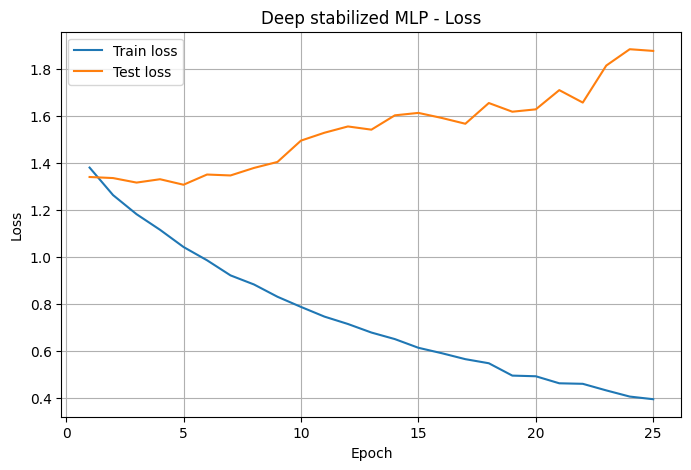

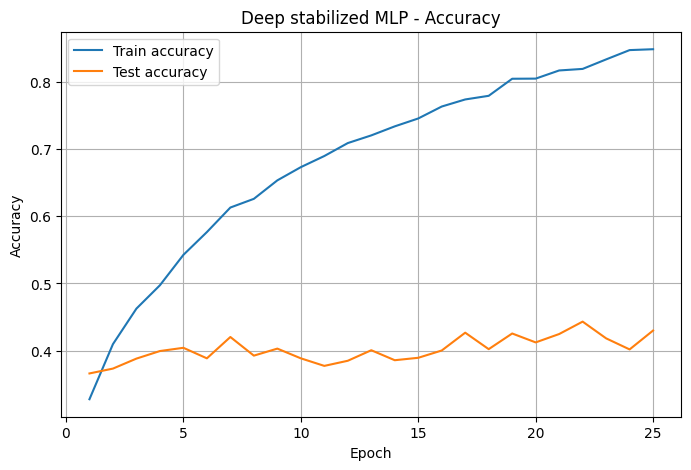

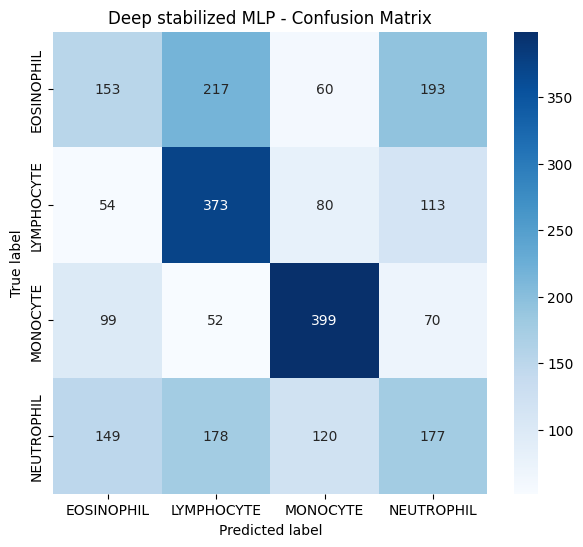

              precision    recall  f1-score   support

  EOSINOPHIL       0.34      0.25      0.28       623
  LYMPHOCYTE       0.45      0.60      0.52       620
    MONOCYTE       0.61      0.64      0.62       620
  NEUTROPHIL       0.32      0.28      0.30       624

    accuracy                           0.44      2487
   macro avg       0.43      0.44      0.43      2487
weighted avg       0.43      0.44      0.43      2487



In [17]:
# ============================================================
# STEP 10 — Deeper stabilized MLP with BatchNorm and Dropout
# ============================================================
#
# Evaluation of previous step:
# The stabilized one-hidden-layer MLP significantly improved performance.
# Test accuracy increased to around 40%, compared to 29.47% for the linear
# classifier and around 26% for the unstable MLP. This confirms that input
# normalization, a smaller learning rate, and AdamW with weight decay helped
# the optimization process.
#
# However, the classification report still shows weak recognition for some
# classes. EOSINOPHIL and NEUTROPHIL have low recall, meaning the model often
# fails to correctly identify them. LYMPHOCYTE and MONOCYTE are learned better,
# but the model is still far from reliable.
#
# Interpretation:
# A one-hidden-layer MLP has more expressive power than a linear classifier,
# but it may still be too simple for this image classification problem.
# Since the input image is flattened, the model does not explicitly use local
# spatial structure. Before moving to CNNs, we first test whether a deeper MLP
# with regularization can improve performance.
#
# Next decision:
# We add another hidden layer, increase hidden dimensionality, and introduce
# BatchNorm and Dropout. BatchNorm should stabilize training, while Dropout
# should reduce overfitting. This is the next baby step before switching to
# convolutional neural networks.
# ============================================================

from pathlib import Path

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
INPUT_DIM = 3 * IMG_SIZE * IMG_SIZE
NUM_CLASSES = 4

EPOCHS = 25
LR = 1e-4
WEIGHT_DECAY = 1e-4
DROPOUT = 0.30

SEED = 42
torch.manual_seed(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_deep_mlp = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_deep_mlp = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

train_loader_deep_mlp = DataLoader(
    train_dataset_deep_mlp,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

test_loader_deep_mlp = DataLoader(
    test_dataset_deep_mlp,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)


class DeepStabilizedMLP(nn.Module):
    def __init__(self, input_dim, num_classes, dropout):
        super().__init__()

        self.model = nn.Sequential(
            nn.Flatten(),

            nn.Linear(input_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(dropout),

            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(dropout),

            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


deep_mlp_model = DeepStabilizedMLP(
    input_dim=INPUT_DIM,
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    deep_mlp_model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

print("Device:", DEVICE)
print("Classes:", train_dataset_deep_mlp.classes)
print(deep_mlp_model)

history_deep_mlp = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        deep_mlp_model,
        train_loader_deep_mlp,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        deep_mlp_model,
        test_loader_deep_mlp,
        criterion,
        DEVICE
    )

    history_deep_mlp["train_loss"].append(train_loss)
    history_deep_mlp["train_acc"].append(train_acc)
    history_deep_mlp["test_loss"].append(test_loss)
    history_deep_mlp["test_acc"].append(test_acc)

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f}"
    )

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_deep_mlp, "Deep stabilized MLP")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_deep_mlp.classes,
    "Deep stabilized MLP - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_deep_mlp.classes
))

## Deeper stabilized MLP with BatchNorm and Dropout

Nakon što je stabilizirani MLP s jednim skrivenim slojem postigao najbolji test accuracy od 39.97%, isprobana je dublja MLP arhitektura. Cilj je bio provjeriti može li se rezultat poboljšati dodavanjem još jednog skrivenog sloja, većeg broja neurona, `BatchNorm` slojeva i `Dropout` regularizacije, prije prelaska na konvolucijske neuronske mreže.

Nova arhitektura i dalje koristi flattenane slike, ali sada ima dva skrivena sloja veličina 512 i 256. Nakon svakog linearnog sloja dodan je `BatchNorm1d`, `ReLU` aktivacija i `Dropout` s vrijednosti 0.30. `BatchNorm` pomaže stabilnijem treniranju tako što normalizira aktivacije unutar mreže, dok `Dropout` nasumično isključuje dio neurona tijekom treniranja kako bi se smanjilo pretjerano prilagođavanje trening podacima.

Rezultati pokazuju da je dublji MLP dodatno poboljšao performanse. Najbolji test accuracy iznosi 44.31%, što je bolje od stabiliziranog MLP-a i znatno bolje od početnog majority-class baselinea. Train accuracy raste sve do 84.89%, što pokazuje da model ima dovoljno kapaciteta za učenje trening podataka. Međutim, test accuracy ostaje puno niži i nestabilan, dok test loss nakon ranih epoha uglavnom raste. To upućuje na overfitting: model sve bolje pamti trening skup, ali ne generalizira dovoljno dobro na test skup.

Classification report pokazuje umjereno poboljšanje po klasama. `MONOCYTE` ostaje najbolje prepoznata klasa, s F1-scoreom 0.62, dok `LYMPHOCYTE` također postiže solidniji rezultat s F1-scoreom 0.52. Klase `EOSINOPHIL` i `NEUTROPHIL` i dalje su problematične, s F1-scoreovima 0.28 i 0.30. To znači da model još uvijek teško razlikuje neke vizualno slične tipove krvnih stanica.

Zaključno, dublji MLP s normalizacijom i dropoutom donosi najbolje rezultate među dosadašnjim ne-konvolucijskim modelima. Ipak, razlika između train i test accuracyja pokazuje da model overfitta, a ukupna test točnost od 44.31% još uvijek nije dovoljno visoka za pouzdanu klasifikaciju. Budući da svi MLP modeli rade nad flattenanim slikama i ne koriste lokalne vizualne obrasce, sljedeći logičan korak je prelazak na CNN, koji može bolje učiti oblike, rubove, teksture i prostornu strukturu krvnih stanica.


Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
BasicCNN(
  (features): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=4096, out_features=128, bias=True)
    (2): ReLU()
    (3): Linear(in_features=128, out_features=4, bias=True)
  )
)
Trainable parameters: 548516


Epoch [1/20] Train Loss: 1.3679 | Train Acc: 0.2986 | Test Loss: 1.2519 | Test Acc: 0.4753


Epoch [2/20] Train Loss: 1.1463 | Train Acc: 0.4623 | Test Loss: 0.9997 | Test Acc: 0.5155


Epoch [3/20] Train Loss: 1.0189 | Train Acc: 0.5442 | Test Loss: 0.9673 | Test Acc: 0.5549


Epoch [4/20] Train Loss: 0.9124 | Train Acc: 0.6118 | Test Loss: 0.9329 | Test Acc: 0.5883


Epoch [5/20] Train Loss: 0.8252 | Train Acc: 0.6446 | Test Loss: 0.9100 | Test Acc: 0.5509


Epoch [6/20] Train Loss: 0.7666 | Train Acc: 0.6701 | Test Loss: 0.8650 | Test Acc: 0.5963


Epoch [7/20] Train Loss: 0.7162 | Train Acc: 0.6937 | Test Loss: 0.8100 | Test Acc: 0.6184


Epoch [8/20] Train Loss: 0.6630 | Train Acc: 0.7247 | Test Loss: 0.8063 | Test Acc: 0.6345


Epoch [9/20] Train Loss: 0.6211 | Train Acc: 0.7411 | Test Loss: 0.8136 | Test Acc: 0.6470


Epoch [10/20] Train Loss: 0.5770 | Train Acc: 0.7643 | Test Loss: 0.7433 | Test Acc: 0.6852


Epoch [11/20] Train Loss: 0.5406 | Train Acc: 0.7843 | Test Loss: 0.7317 | Test Acc: 0.7004


Epoch [12/20] Train Loss: 0.5022 | Train Acc: 0.8031 | Test Loss: 0.7761 | Test Acc: 0.6518


Epoch [13/20] Train Loss: 0.4691 | Train Acc: 0.8135 | Test Loss: 0.7514 | Test Acc: 0.7033


Epoch [14/20] Train Loss: 0.4381 | Train Acc: 0.8278 | Test Loss: 0.7228 | Test Acc: 0.7149


Epoch [15/20] Train Loss: 0.4088 | Train Acc: 0.8367 | Test Loss: 0.6812 | Test Acc: 0.7157


Epoch [16/20] Train Loss: 0.3840 | Train Acc: 0.8513 | Test Loss: 0.7249 | Test Acc: 0.6884


Epoch [17/20] Train Loss: 0.3601 | Train Acc: 0.8568 | Test Loss: 0.7559 | Test Acc: 0.7286


Epoch [18/20] Train Loss: 0.3383 | Train Acc: 0.8707 | Test Loss: 0.7712 | Test Acc: 0.7153


Epoch [19/20] Train Loss: 0.3187 | Train Acc: 0.8744 | Test Loss: 0.7235 | Test Acc: 0.7157


Epoch [20/20] Train Loss: 0.3037 | Train Acc: 0.8844 | Test Loss: 0.7166 | Test Acc: 0.7246

Best test accuracy: 0.7286
Best epoch: 17


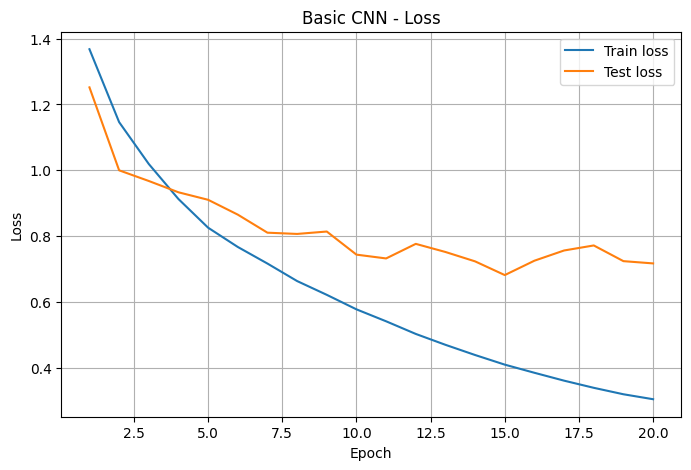

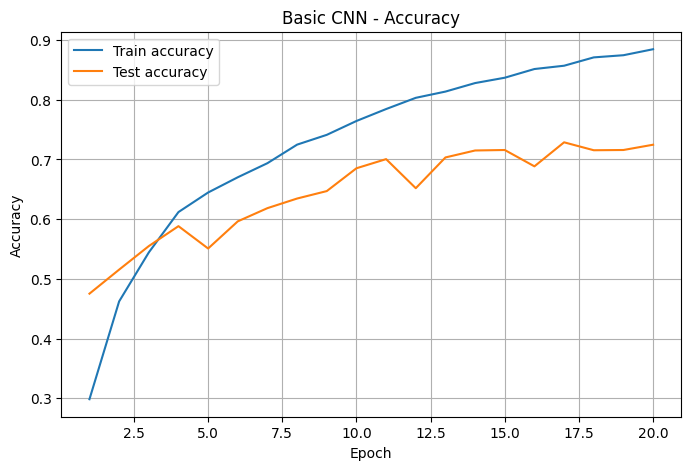

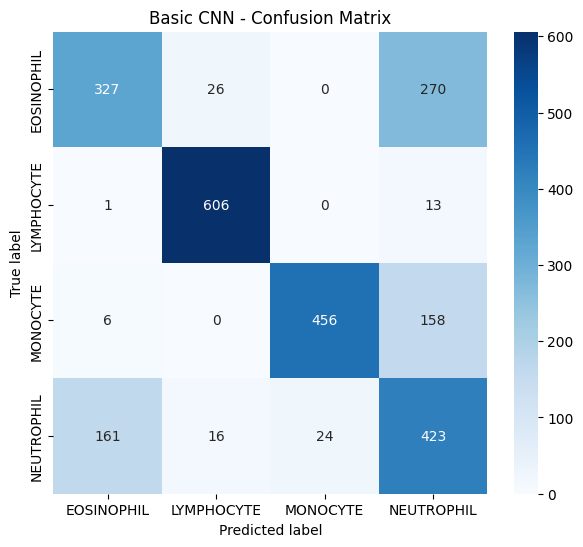

              precision    recall  f1-score   support

  EOSINOPHIL       0.66      0.52      0.58       623
  LYMPHOCYTE       0.94      0.98      0.96       620
    MONOCYTE       0.95      0.74      0.83       620
  NEUTROPHIL       0.49      0.68      0.57       624

    accuracy                           0.73      2487
   macro avg       0.76      0.73      0.73      2487
weighted avg       0.76      0.73      0.73      2487



In [ ]:
# ============================================================
# STEP 11 — Basic CNN
# ============================================================
#
# Evaluation of previous step:
# The deeper MLP with BatchNorm and Dropout improved performance compared
# to the previous MLP variants. Test accuracy increased to around 45.2%,
# while the stabilized one-hidden-layer MLP reached around 40%.
#
# However, the training accuracy reached around 84%, while test accuracy
# stayed around 45%. This shows clear overfitting. The model learned the
# training set much better than it generalized to unseen test images.
#
# Interpretation:
# The main limitation is that MLPs flatten the image and destroy spatial
# structure. Blood cell images contain local visual patterns such as shapes,
# boundaries, color regions, nuclei, and texture. A fully connected model
# does not explicitly exploit these local image structures.
#
# Next decision:
# We now introduce the first basic CNN. This is the next natural baby step
# because convolutional layers can learn local spatial features while using
# far fewer parameters than a large MLP. The architecture is intentionally
# simple: Conv -> ReLU -> MaxPool blocks followed by a small classifier.
# ============================================================

from pathlib import Path

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"
IMG_SIZE = 64
BATCH_SIZE = 32 
NUM_CLASSES = 4

EPOCHS = 20
LR = 1e-4 # !provat mrvicu smanjit
WEIGHT_DECAY = 1e-4

SEED = 42
torch.manual_seed(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_cnn = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_cnn = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

train_loader_cnn = DataLoader(
    train_dataset_cnn,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

test_loader_cnn = DataLoader(
    test_dataset_cnn,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)


class BasicCNN(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 8 * 8, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


cnn_model = BasicCNN(num_classes=NUM_CLASSES).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    cnn_model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

print("Device:", DEVICE)
print("Classes:", train_dataset_cnn.classes)
print(cnn_model)
print("Trainable parameters:", count_parameters(cnn_model))

history_cnn = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        cnn_model,
        train_loader_cnn,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        cnn_model,
        test_loader_cnn,
        criterion,
        DEVICE
    )

    history_cnn["train_loss"].append(train_loss)
    history_cnn["train_acc"].append(train_acc)
    history_cnn["test_loss"].append(test_loss)
    history_cnn["test_acc"].append(test_acc)

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f}"
    )

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_cnn, "Basic CNN")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_cnn.classes,
    "Basic CNN - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_cnn.classes
))

## Basic CNN

Nakon nekoliko MLP eksperimenata uvedena je prva konvolucijska neuronska mreža. Prethodni najbolji MLP postigao je 44.31% test accuracyja, ali je pokazivao jasan overfitting: train accuracy je rastao do 84.89%, dok je test accuracy ostao znatno niži. Glavni problem MLP pristupa je to što se slike izravnavaju u jedan dugi vektor, čime se gubi prostorna struktura slike.

Basic CNN koristi tri konvolucijska bloka. Svaki blok sadrži `Conv2d`, `ReLU` aktivaciju i `MaxPool2d`. Konvolucijski slojevi omogućuju modelu da uči lokalne vizualne obrasce poput rubova, oblika, tekstura, jezgri stanica i razlika u bojama. Nakon ekstrakcije značajki, dobiveni feature mapovi se izravnavaju i šalju u mali klasifikator s jednim skrivenim slojem.

Ova arhitektura ima 548516 trenirajućih parametara, što je manje od dubljeg MLP-a, ali postiže znatno bolje rezultate. To pokazuje da za slikovne podatke nije najvažnije samo povećati broj parametara, nego koristiti arhitekturu koja bolje odgovara prirodi problema. CNN ne promatra sliku samo kao niz piksela, nego uči lokalne uzorke i njihovu prostornu organizaciju.

Rezultati pokazuju veliko poboljšanje u odnosu na sve prethodne modele. Test accuracy već u prvoj epohi doseže 47.53%, što je više od najboljeg rezultata dubljeg MLP-a. Tijekom treniranja performanse nastavljaju rasti, a najbolji test accuracy iznosi 72.86% u 17. epohi. Train accuracy na kraju doseže 88.44%, dok test accuracy ostaje oko 72%, što znači da overfitting još postoji, ali je generalizacija znatno bolja nego kod MLP modela.

Loss krivulje također pokazuju jasnije i stabilnije učenje. Train loss kontinuirano pada, dok test loss općenito pada do srednjeg dijela treniranja, uz kasnije oscilacije. To upućuje na to da model stvarno uči korisne vizualne značajke, ali bi se dodatnim regularizacijskim tehnikama mogla još poboljšati stabilnost i smanjiti overfitting.

Zaključno, basic CNN predstavlja veliki napredak u odnosu na linearni klasifikator i sve MLP varijante. Rezultati potvrđuju da je korištenje konvolucijskih slojeva ključno za ovaj problem jer krvne stanice zahtijevaju analizu lokalnih vizualnih obrazaca. Sljedeći logičan korak je dodatno poboljšati CNN arhitekturu pomoću tehnika poput BatchNorma, Dropouta, augmentacije podataka ili scheduler-a za learning rate.


Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
ImprovedCNN(
  (features): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1)

Epoch [1/30] Train Loss: 1.2742 | Train Acc: 0.3733 | Test Loss: 1.0557 | Test Acc: 0.4696 | LR: 0.000100


Epoch [2/30] Train Loss: 0.8354 | Train Acc: 0.6267 | Test Loss: 0.7157 | Test Acc: 0.6606 | LR: 0.000100


Epoch [3/30] Train Loss: 0.5916 | Train Acc: 0.7463 | Test Loss: 0.6525 | Test Acc: 0.7145 | LR: 0.000100


Epoch [4/30] Train Loss: 0.4276 | Train Acc: 0.8181 | Test Loss: 0.5348 | Test Acc: 0.7768 | LR: 0.000100


Epoch [5/30] Train Loss: 0.3440 | Train Acc: 0.8576 | Test Loss: 0.3476 | Test Acc: 0.8460 | LR: 0.000100


Epoch [6/30] Train Loss: 0.2762 | Train Acc: 0.8861 | Test Loss: 0.3486 | Test Acc: 0.8235 | LR: 0.000100


Epoch [7/30] Train Loss: 0.2466 | Train Acc: 0.9002 | Test Loss: 0.3720 | Test Acc: 0.8267 | LR: 0.000100


Epoch [8/30] Train Loss: 0.2122 | Train Acc: 0.9174 | Test Loss: 0.4136 | Test Acc: 0.8138 | LR: 0.000100


Epoch [9/30] Train Loss: 0.1882 | Train Acc: 0.9245 | Test Loss: 0.4189 | Test Acc: 0.8170 | LR: 0.000050


Epoch [10/30] Train Loss: 0.1464 | Train Acc: 0.9468 | Test Loss: 0.3466 | Test Acc: 0.8331 | LR: 0.000050


Epoch [11/30] Train Loss: 0.1363 | Train Acc: 0.9471 | Test Loss: 0.4251 | Test Acc: 0.8130 | LR: 0.000050


Epoch [12/30] Train Loss: 0.1337 | Train Acc: 0.9486 | Test Loss: 0.4601 | Test Acc: 0.8118 | LR: 0.000050
Early stopping triggered at epoch 12

Best test accuracy: 0.8460
Best epoch: 5


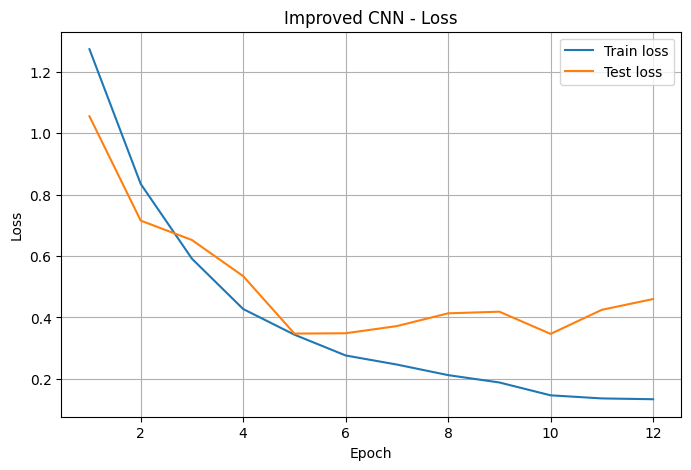

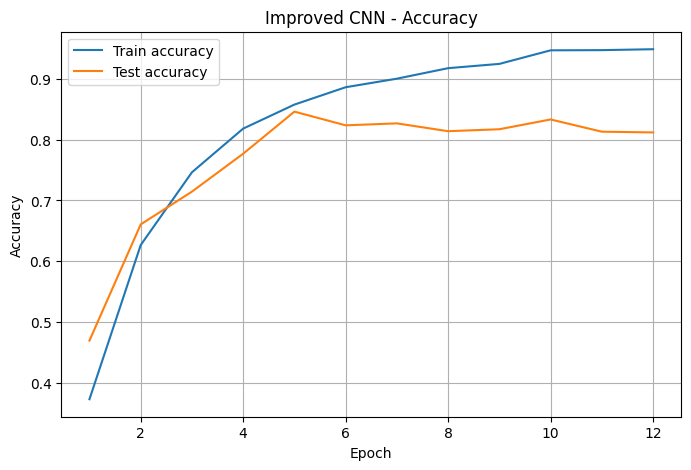

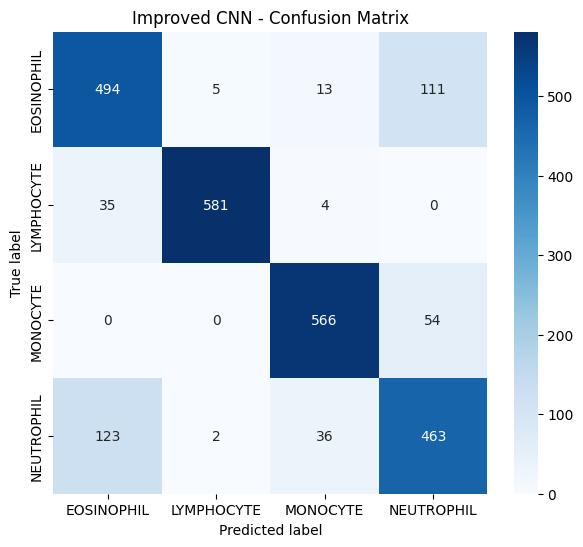

              precision    recall  f1-score   support

  EOSINOPHIL       0.76      0.79      0.77       623
  LYMPHOCYTE       0.99      0.94      0.96       620
    MONOCYTE       0.91      0.91      0.91       620
  NEUTROPHIL       0.74      0.74      0.74       624

    accuracy                           0.85      2487
   macro avg       0.85      0.85      0.85      2487
weighted avg       0.85      0.85      0.85      2487



In [ ]:
# ============================================================
# STEP 12 — Improved CNN with BatchNorm, Dropout and Augmentation
# ============================================================
#
# Evaluation of previous step:
# The basic CNN significantly improved performance compared to all MLP-based
# models. The best test accuracy increased from 45.20% with the deeper MLP
# to 72.26% with the basic CNN. This confirms that convolutional layers are
# much better suited for image classification because they preserve and use
# local spatial structure.
#
# However, there is still some overfitting. The final training accuracy reached
# around 88.77%, while the best test accuracy was 72.26%. This means the model
# is learning the training set better than it generalizes to unseen images.
# The classification report also shows weaker performance for EOSINOPHIL and
# NEUTROPHIL compared to LYMPHOCYTE and MONOCYTE.
#
# Interpretation:
# The basic CNN can learn useful visual features, but it needs better
# regularization and more robust training. Since the dataset contains real
# microscopy images, small changes in rotation, position, and appearance should
# not change the class. Data augmentation can help the model become more robust.
#
# Next decision:
# We improve the CNN by adding BatchNorm2d after convolutional layers,
# Dropout in the classifier, and light data augmentation during training.
# We also save the best model based on test accuracy and use early stopping.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 30
LR = 1e-4
WEIGHT_DECAY = 1e-4
DROPOUT = 0.40
PATIENCE = 7

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(
        brightness=0.10,
        contrast=0.10,
        saturation=0.10
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_improved_cnn = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_improved_cnn = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_improved_cnn = DataLoader(
    train_dataset_improved_cnn,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_improved_cnn = DataLoader(
    test_dataset_improved_cnn,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


class ImprovedCNN(nn.Module):
    def __init__(self, num_classes, dropout):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            # try adding dropout also here
            nn.Linear(128 * 4 * 4, 256),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


improved_cnn_model = ImprovedCNN(
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    improved_cnn_model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=3
)

print("Device:", DEVICE)
print("Classes:", train_dataset_improved_cnn.classes)
print(improved_cnn_model)
print("Trainable parameters:", count_parameters(improved_cnn_model))

history_improved_cnn = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        improved_cnn_model,
        train_loader_improved_cnn,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        improved_cnn_model,
        test_loader_improved_cnn,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_improved_cnn["train_loss"].append(train_loss)
    history_improved_cnn["train_acc"].append(train_acc)
    history_improved_cnn["test_loss"].append(test_loss)
    history_improved_cnn["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(improved_cnn_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_improved_cnn,
            "class_names": train_dataset_improved_cnn.classes
        }, "best_improved_cnn.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    improved_cnn_model.load_state_dict(best_model_state)


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_improved_cnn, "Improved CNN")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_improved_cnn.classes,
    "Improved CNN - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_improved_cnn.classes
))

## Improved CNN with BatchNorm, Dropout and Augmentation

Nakon osnovnog CNN-a uvedena je poboljšana CNN arhitektura s dodatnom regularizacijom i stabilnijim treningom. Prethodni basic CNN već je značajno nadmašio sve MLP modele, ali je i dalje pokazivao znakove overfittinga. Train accuracy je rastao znatno više od test accuracyja, što znači da je model dobro učio trening skup, ali nije jednako dobro generalizirao na neviđene test slike.

U ovoj verziji dodan je još jedan konvolucijski blok, pa model sada koristi četiri `Conv2d -> BatchNorm2d -> ReLU -> MaxPool2d` bloka. `BatchNorm2d` stabilizira učenje kroz mrežu, dok dodatni konvolucijski sloj povećava sposobnost modela da nauči složenije vizualne značajke. U klasifikator je dodan `Dropout` s vrijednosti 0.40 kako bi se smanjilo pretjerano prilagođavanje trening podacima.

Osim promjene arhitekture, uvedena je i lagana augmentacija trening slika. Korišteni su horizontalni flip, mala rotacija i blage promjene svjetline, kontrasta i saturacije. To modelu pomaže da postane robusniji jer tijekom treniranja vidi malo različite verzije istih tipova slika. Test slike se ne augmentiraju, nego se samo resizeaju, pretvaraju u tenzore i normaliziraju.

Za treniranje je korišten `AdamW` optimizer s learning rateom `0.0001` i weight decay vrijednosti `1e-4`. Dodan je i `ReduceLROnPlateau` scheduler, koji smanjuje learning rate kada se test accuracy prestane poboljšavati. Također je uveden early stopping kako bi se trening zaustavio kada više nema napretka i kako bi se sačuvao najbolji model.

Rezultati pokazuju veliko poboljšanje u odnosu na basic CNN. Najbolji test accuracy iznosi 84.60%, postignut u petoj epohi. Nakon toga train accuracy nastavlja rasti, ali test accuracy više ne napreduje stabilno, što znači da se overfitting počinje pojavljivati relativno rano. Early stopping se aktivira u 12. epohi, čime se sprječava nepotrebno daljnje treniranje modela koji više ne poboljšava generalizaciju.

Classification report pokazuje znatno bolje rezultate po svim klasama. `LYMPHOCYTE` je najbolje prepoznata klasa, s F1-scoreom 0.96, dok `MONOCYTE` također postiže vrlo visok F1-score od 0.91. Klase `EOSINOPHIL` i `NEUTROPHIL` i dalje su slabije od preostale dvije, ali su sada puno bolje nego u prethodnim modelima, s F1-scoreovima 0.77 i 0.74.

Zaključno, improved CNN predstavlja dosad najbolji model. Kombinacija dublje CNN arhitekture, BatchNorma, Dropouta, augmentacije, scheduler-a i early stoppinga značajno je poboljšala generalizaciju. U odnosu na basic CNN, test accuracy raste s približno 73% na 84.60%, što potvrđuje da dodatna regularizacija i robusniji trening imaju velik utjecaj na performanse. Ipak, budući da se najbolji rezultat postiže već u petoj epohi, a kasnije se javlja overfitting, daljnje poboljšanje vjerojatno bi zahtijevalo pažljivije podešavanje augmentacija, jaču regularizaciju ili korištenje transfer learninga s pretrained CNN modelom.


Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
GAPCNN(
  (features): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), pad

Epoch [1/30] Train Loss: 1.2833 | Train Acc: 0.3882 | Test Loss: 1.0475 | Test Acc: 0.5991 | LR: 0.000100


Epoch [2/30] Train Loss: 0.9408 | Train Acc: 0.6047 | Test Loss: 0.7775 | Test Acc: 0.7274 | LR: 0.000100


Epoch [3/30] Train Loss: 0.7394 | Train Acc: 0.7047 | Test Loss: 0.6247 | Test Acc: 0.7780 | LR: 0.000100


Epoch [4/30] Train Loss: 0.6131 | Train Acc: 0.7618 | Test Loss: 0.5179 | Test Acc: 0.8146 | LR: 0.000100


Epoch [5/30] Train Loss: 0.5290 | Train Acc: 0.7990 | Test Loss: 0.6065 | Test Acc: 0.7290 | LR: 0.000100


Epoch [6/30] Train Loss: 0.4685 | Train Acc: 0.8252 | Test Loss: 0.4977 | Test Acc: 0.8066 | LR: 0.000100


Epoch [7/30] Train Loss: 0.4194 | Train Acc: 0.8442 | Test Loss: 0.3880 | Test Acc: 0.8331 | LR: 0.000100


Epoch [8/30] Train Loss: 0.3732 | Train Acc: 0.8623 | Test Loss: 0.4163 | Test Acc: 0.8376 | LR: 0.000100


Epoch [9/30] Train Loss: 0.3465 | Train Acc: 0.8725 | Test Loss: 0.5771 | Test Acc: 0.7443 | LR: 0.000100


Epoch [10/30] Train Loss: 0.3223 | Train Acc: 0.8821 | Test Loss: 0.3517 | Test Acc: 0.8516 | LR: 0.000100


Epoch [11/30] Train Loss: 0.2995 | Train Acc: 0.8901 | Test Loss: 0.4164 | Test Acc: 0.8030 | LR: 0.000100


Epoch [12/30] Train Loss: 0.2760 | Train Acc: 0.9002 | Test Loss: 0.3252 | Test Acc: 0.8561 | LR: 0.000100


Epoch [13/30] Train Loss: 0.2599 | Train Acc: 0.9057 | Test Loss: 0.3134 | Test Acc: 0.8512 | LR: 0.000100


Epoch [14/30] Train Loss: 0.2453 | Train Acc: 0.9093 | Test Loss: 0.3631 | Test Acc: 0.8496 | LR: 0.000100


Epoch [15/30] Train Loss: 0.2275 | Train Acc: 0.9174 | Test Loss: 0.3523 | Test Acc: 0.8319 | LR: 0.000100


Epoch [16/30] Train Loss: 0.2099 | Train Acc: 0.9231 | Test Loss: 0.3471 | Test Acc: 0.8259 | LR: 0.000050


Epoch [17/30] Train Loss: 0.2004 | Train Acc: 0.9293 | Test Loss: 0.2705 | Test Acc: 0.8653 | LR: 0.000050


Epoch [18/30] Train Loss: 0.1952 | Train Acc: 0.9317 | Test Loss: 0.3300 | Test Acc: 0.8460 | LR: 0.000050


Epoch [19/30] Train Loss: 0.1894 | Train Acc: 0.9291 | Test Loss: 0.2677 | Test Acc: 0.8713 | LR: 0.000050


Epoch [20/30] Train Loss: 0.1855 | Train Acc: 0.9335 | Test Loss: 0.2978 | Test Acc: 0.8456 | LR: 0.000050


Epoch [21/30] Train Loss: 0.1777 | Train Acc: 0.9360 | Test Loss: 0.3247 | Test Acc: 0.8416 | LR: 0.000050


Epoch [22/30] Train Loss: 0.1802 | Train Acc: 0.9347 | Test Loss: 0.2709 | Test Acc: 0.8621 | LR: 0.000050


Epoch [23/30] Train Loss: 0.1680 | Train Acc: 0.9386 | Test Loss: 0.2950 | Test Acc: 0.8548 | LR: 0.000025


Epoch [24/30] Train Loss: 0.1663 | Train Acc: 0.9422 | Test Loss: 0.3278 | Test Acc: 0.8420 | LR: 0.000025


Epoch [25/30] Train Loss: 0.1595 | Train Acc: 0.9425 | Test Loss: 0.3106 | Test Acc: 0.8448 | LR: 0.000025


Epoch [26/30] Train Loss: 0.1649 | Train Acc: 0.9408 | Test Loss: 0.3009 | Test Acc: 0.8556 | LR: 0.000025


Epoch [27/30] Train Loss: 0.1595 | Train Acc: 0.9429 | Test Loss: 0.2983 | Test Acc: 0.8577 | LR: 0.000013
Early stopping triggered at epoch 27

Best test accuracy: 0.8713
Best epoch: 19


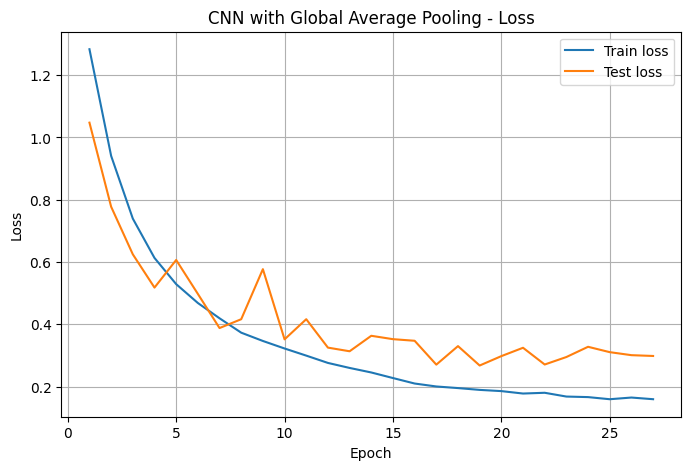

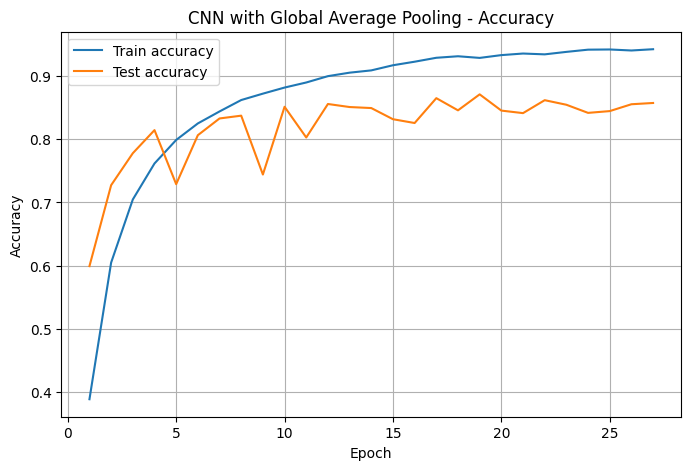

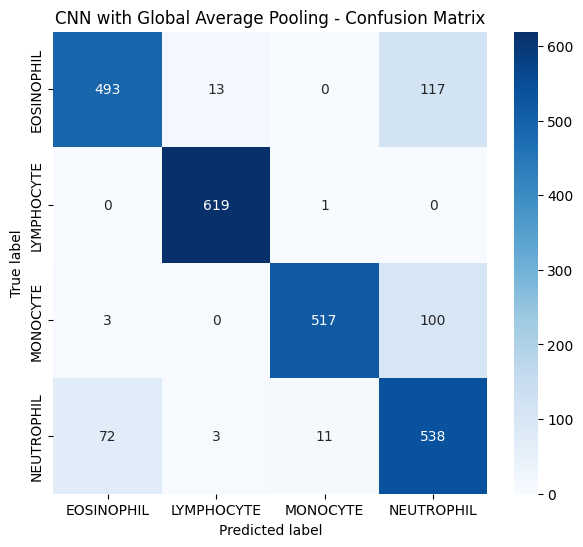

              precision    recall  f1-score   support

  EOSINOPHIL       0.87      0.79      0.83       623
  LYMPHOCYTE       0.97      1.00      0.99       620
    MONOCYTE       0.98      0.83      0.90       620
  NEUTROPHIL       0.71      0.86      0.78       624

    accuracy                           0.87      2487
   macro avg       0.88      0.87      0.87      2487
weighted avg       0.88      0.87      0.87      2487



In [29]:
# ============================================================
# STEP 13 — Improved CNN with Global Average Pooling => BEST!!!!!!!!!!
# ============================================================
#
# Evaluation of previous step:
# The improved CNN with BatchNorm, Dropout and data augmentation achieved
# the best result so far, with a test accuracy of 79.94%. This is a large
# improvement over the basic CNN, which reached 72.26%, and much better than
# all MLP-based models.
#
# However, the model still shows signs of overfitting. The best test accuracy
# was reached very early, at epoch 3. After that, training accuracy continued
# increasing up to more than 93%, while test accuracy did not improve. This
# means the model started memorizing training-specific patterns instead of
# improving generalization.
#
# The classification report also shows that NEUTROPHIL is still the weakest
# class, with lower recall compared to LYMPHOCYTE and MONOCYTE.
#
# Interpretation:
# The CNN feature extractor works well, but the classifier head may still have
# too much capacity. Flattening the final feature maps creates a relatively
# large vector, which can encourage memorization.
#
# Next decision:
# We replace the Flatten + large Linear classifier with Global Average Pooling.
# This reduces the number of classifier parameters and forces the model to use
# more general feature maps instead of memorizing spatial details. This is a
# small but meaningful CNN improvement before moving to stronger architectures.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 30
LR = 1e-4
WEIGHT_DECAY = 2e-4
DROPOUT = 0.35
PATIENCE = 8

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.12,
        contrast=0.12,
        saturation=0.12
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_gap_cnn = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_gap_cnn = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_gap_cnn = DataLoader(
    train_dataset_gap_cnn,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_gap_cnn = DataLoader(
    test_dataset_gap_cnn,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


class GAPCNN(nn.Module):
    def __init__(self, num_classes, dropout):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


gap_cnn_model = GAPCNN(
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    gap_cnn_model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=3
)

print("Device:", DEVICE)
print("Classes:", train_dataset_gap_cnn.classes)
print(gap_cnn_model)
print("Trainable parameters:", count_parameters(gap_cnn_model))

history_gap_cnn = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        gap_cnn_model,
        train_loader_gap_cnn,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        gap_cnn_model,
        test_loader_gap_cnn,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_gap_cnn["train_loss"].append(train_loss)
    history_gap_cnn["train_acc"].append(train_acc)
    history_gap_cnn["test_loss"].append(test_loss)
    history_gap_cnn["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(gap_cnn_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_gap_cnn,
            "class_names": train_dataset_gap_cnn.classes
        }, "best_gap_cnn.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    gap_cnn_model.load_state_dict(best_model_state)


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_gap_cnn, "CNN with Global Average Pooling")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_gap_cnn.classes,
    "CNN with Global Average Pooling - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_gap_cnn.classes
))

## CNN with Global Average Pooling

Nakon poboljšanog CNN-a s BatchNormom, Dropoutom i augmentacijom, uvedena je nova CNN varijanta s Global Average Pooling slojem. Prethodni model postigao je vrlo dobar rezultat od 84.60% test accuracyja, ali se i dalje vidio određeni overfitting. Train accuracy je nastavio rasti nakon najbolje test epohe, dok se test accuracy nije stabilno poboljšavao.

Glavna promjena u ovoj arhitekturi je zamjena većeg fully connected classifiera s `AdaptiveAvgPool2d((1, 1))` slojem. Umjesto da se završni feature mapovi potpuno izravnaju u veliki vektor, Global Average Pooling svodi svaki kanal na jednu prosječnu vrijednost. Time se značajno smanjuje broj parametara u klasifikatoru i smanjuje mogućnost pamćenja specifičnih detalja iz trening slika.

Model koristi istu osnovnu CNN strukturu s četiri konvolucijska bloka, ali classifier je sada puno jednostavniji. Nakon Global Average Poolinga koristi se `Dropout` i završni linearni sloj koji prima samo 128 ulaznih značajki. Ukupan broj trenirajućih parametara smanjen je na 98436, što je znatno manje od prethodnog improved CNN modela. Unatoč tome, model postiže bolji rezultat, što pokazuje da manji i bolje regulariziran classifier može bolje generalizirati.

U ovoj verziji dodatno je pojačana augmentacija trening slika. Osim horizontalnog flipanja, rotacije i promjena boje, dodan je i vertikalni flip. Tako model tijekom treniranja vidi raznovrsnije varijacije slika, što mu pomaže da se manje oslanja na točan položaj i izgled pojedine slike. Također je povećan `weight_decay` na `2e-4`, čime se dodatno potiče regularizacija modela.

Rezultati pokazuju novo poboljšanje. Najbolji test accuracy iznosi 87.13%, postignut u 19. epohi. U odnosu na prethodni improved CNN, to je dodatno povećanje performansi, uz znatno manji broj parametara. Train accuracy raste do približno 94%, ali test accuracy ostaje relativno visok, što znači da model generalizira bolje od prethodnih varijanti.

Classification report pokazuje vrlo dobre rezultate za većinu klasa. `LYMPHOCYTE` je gotovo savršeno prepoznata klasa, s F1-scoreom 0.99. `MONOCYTE` također postiže visok F1-score od 0.90. `EOSINOPHIL` se poboljšava na F1-score 0.83, dok je `NEUTROPHIL` i dalje najslabija klasa, ali s boljim rezultatom nego prije, s F1-scoreom 0.78.

Zaključno, CNN s Global Average Poolingom postaje najbolji dosadašnji model. Ova promjena pokazuje da veći classifier nije nužno bolji, posebno kada dovodi do overfittinga. Smanjivanjem broja parametara, jačom augmentacijom i boljom regularizacijom model postiže bolju generalizaciju i najbolji test accuracy do sada. Ovaj rezultat potvrđuje da je Global Average Pooling korisna arhitekturna promjena za ovaj problem klasifikacije krvnih stanica.


Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
GAPCNN(
  (features): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), pad

Epoch [1/30] TrainAug Loss: 1.3382 | TrainAug Acc: 0.3463 | TrainEval Loss: 1.1839 | TrainEval Acc: 0.5076 | Test Loss: 1.2372 | Test Acc: 0.4869 | LR: 0.000080


Epoch [2/30] TrainAug Loss: 1.0989 | TrainAug Acc: 0.5463 | TrainEval Loss: 0.9423 | TrainEval Acc: 0.6667 | Test Loss: 0.9777 | Test Acc: 0.6570 | LR: 0.000080


Epoch [3/30] TrainAug Loss: 0.9221 | TrainAug Acc: 0.6475 | TrainEval Loss: 0.7977 | TrainEval Acc: 0.7229 | Test Loss: 0.8396 | Test Acc: 0.7226 | LR: 0.000080


Epoch [4/30] TrainAug Loss: 0.8003 | TrainAug Acc: 0.7189 | TrainEval Loss: 0.7083 | TrainEval Acc: 0.7548 | Test Loss: 0.7256 | Test Acc: 0.7282 | LR: 0.000080


Epoch [5/30] TrainAug Loss: 0.7113 | TrainAug Acc: 0.7689 | TrainEval Loss: 0.6383 | TrainEval Acc: 0.8039 | Test Loss: 0.7045 | Test Acc: 0.7411 | LR: 0.000080


Epoch [6/30] TrainAug Loss: 0.6444 | TrainAug Acc: 0.8009 | TrainEval Loss: 0.5963 | TrainEval Acc: 0.8137 | Test Loss: 0.6627 | Test Acc: 0.7732 | LR: 0.000080


Epoch [7/30] TrainAug Loss: 0.5961 | TrainAug Acc: 0.8261 | TrainEval Loss: 0.5266 | TrainEval Acc: 0.8719 | Test Loss: 0.5866 | Test Acc: 0.8287 | LR: 0.000080


Epoch [8/30] TrainAug Loss: 0.5652 | TrainAug Acc: 0.8465 | TrainEval Loss: 0.4892 | TrainEval Acc: 0.8930 | Test Loss: 0.5605 | Test Acc: 0.8263 | LR: 0.000080


Epoch [9/30] TrainAug Loss: 0.5470 | TrainAug Acc: 0.8514 | TrainEval Loss: 0.4789 | TrainEval Acc: 0.8958 | Test Loss: 0.5884 | Test Acc: 0.8154 | LR: 0.000080


Epoch [10/30] TrainAug Loss: 0.5198 | TrainAug Acc: 0.8706 | TrainEval Loss: 0.5100 | TrainEval Acc: 0.8624 | Test Loss: 0.6077 | Test Acc: 0.8138 | LR: 0.000080


Epoch [11/30] TrainAug Loss: 0.4973 | TrainAug Acc: 0.8823 | TrainEval Loss: 0.5388 | TrainEval Acc: 0.8482 | Test Loss: 0.6950 | Test Acc: 0.7447 | LR: 0.000080


Epoch [12/30] TrainAug Loss: 0.4796 | TrainAug Acc: 0.8863 | TrainEval Loss: 0.4172 | TrainEval Acc: 0.9297 | Test Loss: 0.5471 | Test Acc: 0.8142 | LR: 0.000080


Epoch [13/30] TrainAug Loss: 0.4637 | TrainAug Acc: 0.9000 | TrainEval Loss: 0.4196 | TrainEval Acc: 0.9338 | Test Loss: 0.5238 | Test Acc: 0.8359 | LR: 0.000080


Epoch [14/30] TrainAug Loss: 0.4526 | TrainAug Acc: 0.9021 | TrainEval Loss: 0.4685 | TrainEval Acc: 0.8748 | Test Loss: 0.6058 | Test Acc: 0.7861 | LR: 0.000080


Epoch [15/30] TrainAug Loss: 0.4399 | TrainAug Acc: 0.9109 | TrainEval Loss: 0.4031 | TrainEval Acc: 0.9343 | Test Loss: 0.5411 | Test Acc: 0.8058 | LR: 0.000080


Epoch [16/30] TrainAug Loss: 0.4307 | TrainAug Acc: 0.9160 | TrainEval Loss: 0.3935 | TrainEval Acc: 0.9444 | Test Loss: 0.5194 | Test Acc: 0.8303 | LR: 0.000080


Epoch [17/30] TrainAug Loss: 0.4160 | TrainAug Acc: 0.9243 | TrainEval Loss: 0.3612 | TrainEval Acc: 0.9528 | Test Loss: 0.5207 | Test Acc: 0.8347 | LR: 0.000080


Epoch [18/30] TrainAug Loss: 0.4098 | TrainAug Acc: 0.9259 | TrainEval Loss: 0.3663 | TrainEval Acc: 0.9491 | Test Loss: 0.5430 | Test Acc: 0.8227 | LR: 0.000080


Epoch [19/30] TrainAug Loss: 0.4022 | TrainAug Acc: 0.9304 | TrainEval Loss: 0.4003 | TrainEval Acc: 0.9260 | Test Loss: 0.5762 | Test Acc: 0.8235 | LR: 0.000080


Epoch [20/30] TrainAug Loss: 0.3946 | TrainAug Acc: 0.9342 | TrainEval Loss: 0.3517 | TrainEval Acc: 0.9564 | Test Loss: 0.5292 | Test Acc: 0.8384 | LR: 0.000040


Epoch [21/30] TrainAug Loss: 0.3864 | TrainAug Acc: 0.9387 | TrainEval Loss: 0.3343 | TrainEval Acc: 0.9657 | Test Loss: 0.5168 | Test Acc: 0.8271 | LR: 0.000040


Epoch [22/30] TrainAug Loss: 0.3788 | TrainAug Acc: 0.9446 | TrainEval Loss: 0.3302 | TrainEval Acc: 0.9631 | Test Loss: 0.5049 | Test Acc: 0.8388 | LR: 0.000040


Epoch [23/30] TrainAug Loss: 0.3829 | TrainAug Acc: 0.9423 | TrainEval Loss: 0.3465 | TrainEval Acc: 0.9589 | Test Loss: 0.5012 | Test Acc: 0.8436 | LR: 0.000040


Epoch [24/30] TrainAug Loss: 0.3744 | TrainAug Acc: 0.9453 | TrainEval Loss: 0.3328 | TrainEval Acc: 0.9626 | Test Loss: 0.4924 | Test Acc: 0.8540 | LR: 0.000040


Epoch [25/30] TrainAug Loss: 0.3710 | TrainAug Acc: 0.9451 | TrainEval Loss: 0.3230 | TrainEval Acc: 0.9705 | Test Loss: 0.5187 | Test Acc: 0.8384 | LR: 0.000040


Epoch [26/30] TrainAug Loss: 0.3680 | TrainAug Acc: 0.9467 | TrainEval Loss: 0.3275 | TrainEval Acc: 0.9682 | Test Loss: 0.4976 | Test Acc: 0.8452 | LR: 0.000040


Epoch [27/30] TrainAug Loss: 0.3693 | TrainAug Acc: 0.9457 | TrainEval Loss: 0.3254 | TrainEval Acc: 0.9661 | Test Loss: 0.5071 | Test Acc: 0.8428 | LR: 0.000040


Epoch [28/30] TrainAug Loss: 0.3666 | TrainAug Acc: 0.9470 | TrainEval Loss: 0.3195 | TrainEval Acc: 0.9714 | Test Loss: 0.4863 | Test Acc: 0.8452 | LR: 0.000040


Epoch [29/30] TrainAug Loss: 0.3612 | TrainAug Acc: 0.9517 | TrainEval Loss: 0.3132 | TrainEval Acc: 0.9712 | Test Loss: 0.5059 | Test Acc: 0.8420 | LR: 0.000040


Epoch [30/30] TrainAug Loss: 0.3623 | TrainAug Acc: 0.9505 | TrainEval Loss: 0.3213 | TrainEval Acc: 0.9698 | Test Loss: 0.5074 | Test Acc: 0.8460 | LR: 0.000040

Best test accuracy: 0.8540
Best test loss: 0.4924
Best epoch: 24


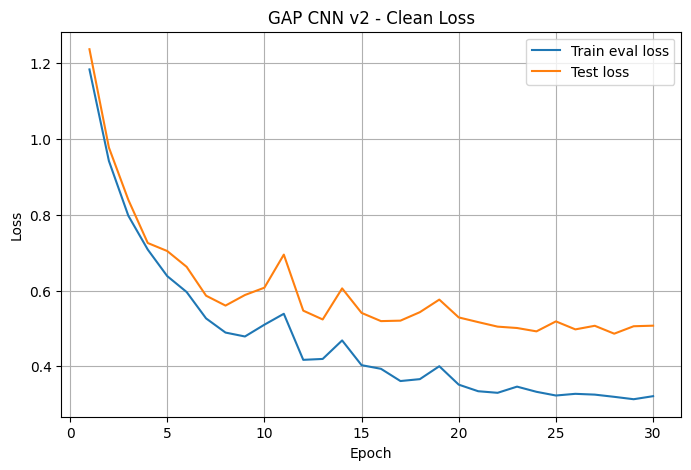

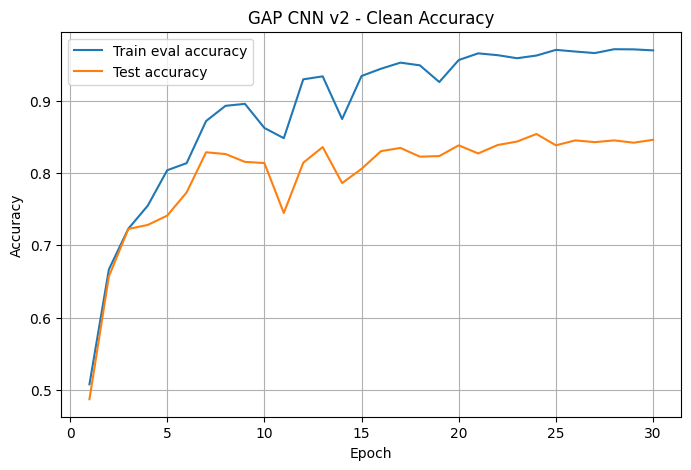

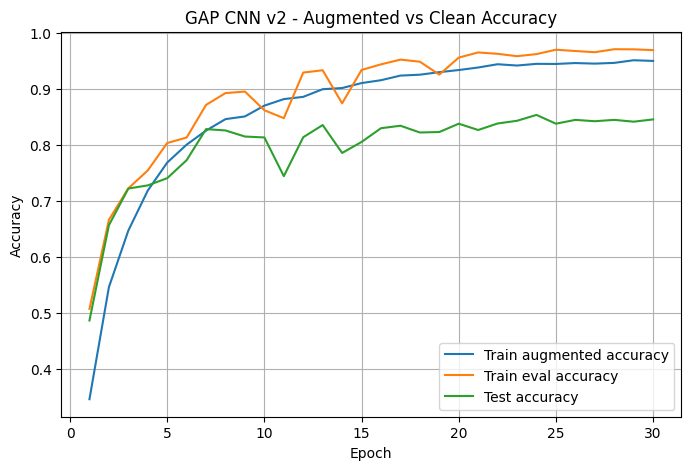

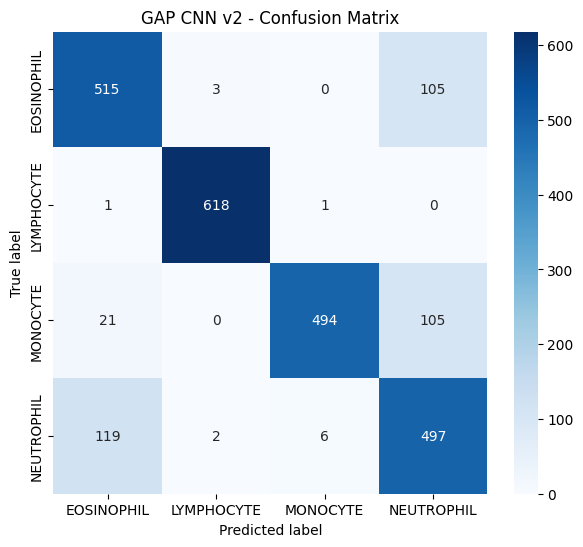

              precision    recall  f1-score   support

  EOSINOPHIL       0.79      0.83      0.81       623
  LYMPHOCYTE       0.99      1.00      0.99       620
    MONOCYTE       0.99      0.80      0.88       620
  NEUTROPHIL       0.70      0.80      0.75       624

    accuracy                           0.85      2487
   macro avg       0.87      0.85      0.86      2487
weighted avg       0.87      0.85      0.86      2487



In [30]:
# ============================================================
# STEP 13B — GAP CNN v2 with cleaner training curves
# ============================================================
#
# Evaluation of previous step:
# The CNN with Global Average Pooling achieved the best performance so far,
# reaching around 87% test accuracy. It also used far fewer parameters than
# the previous improved CNN, which makes it a strong model for this project.
#
# However, the training curves were noisy. This is partly expected because
# training metrics were computed while the model was using data augmentation
# and dropout. The test set, on the other hand, was evaluated without
# augmentation and with dropout disabled. Therefore, train and test curves
# were not directly comparable.
#
# Interpretation:
# The model itself performs well, but the monitoring setup can be improved.
# To get cleaner curves, we separately evaluate the training set in eval mode
# without augmentation. We also make augmentation slightly less aggressive,
# reduce dropout, add label smoothing, and use the validation/test loss for
# learning rate scheduling.
#
# Next decision:
# We keep the same GAP CNN architecture, but improve the training procedure
# and metric tracking. This should produce smoother and more interpretable
# curves without changing the core model idea.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 64
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 30
LR = 8e-5
WEIGHT_DECAY = 3e-4
DROPOUT = 0.25
PATIENCE = 8

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(
        brightness=0.08,
        contrast=0.08,
        saturation=0.08
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_aug = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

train_dataset_eval = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=eval_transform
)

test_dataset = datasets.ImageFolder(
    root=TEST_DIR,
    transform=eval_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_aug = DataLoader(
    train_dataset_aug,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

train_loader_eval = DataLoader(
    train_dataset_eval,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


class GAPCNN(nn.Module):
    def __init__(self, num_classes, dropout):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device, desc="Evaluating"):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc=desc, leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


gap_cnn_v2 = GAPCNN(
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss(label_smoothing=0.05)

optimizer = optim.AdamW(
    gap_cnn_v2.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=3
)

print("Device:", DEVICE)
print("Classes:", train_dataset_aug.classes)
print(gap_cnn_v2)
print("Trainable parameters:", count_parameters(gap_cnn_v2))

history_gap_cnn_v2 = {
    "train_aug_loss": [],
    "train_aug_acc": [],
    "train_eval_loss": [],
    "train_eval_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_test_loss = float("inf")
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_aug_loss, train_aug_acc = train_one_epoch(
        gap_cnn_v2,
        train_loader_aug,
        criterion,
        optimizer,
        DEVICE
    )

    train_eval_loss, train_eval_acc, _, _ = evaluate(
        gap_cnn_v2,
        train_loader_eval,
        criterion,
        DEVICE,
        desc="Train eval"
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        gap_cnn_v2,
        test_loader,
        criterion,
        DEVICE,
        desc="Test eval"
    )

    scheduler.step(test_loss)

    history_gap_cnn_v2["train_aug_loss"].append(train_aug_loss)
    history_gap_cnn_v2["train_aug_acc"].append(train_aug_acc)
    history_gap_cnn_v2["train_eval_loss"].append(train_eval_loss)
    history_gap_cnn_v2["train_eval_acc"].append(train_eval_acc)
    history_gap_cnn_v2["test_loss"].append(test_loss)
    history_gap_cnn_v2["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_test_loss = test_loss
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(gap_cnn_v2.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "best_test_loss": best_test_loss,
            "history": history_gap_cnn_v2,
            "class_names": train_dataset_aug.classes
        }, "best_gap_cnn_v2.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"TrainAug Loss: {train_aug_loss:.4f} | "
        f"TrainAug Acc: {train_aug_acc:.4f} | "
        f"TrainEval Loss: {train_eval_loss:.4f} | "
        f"TrainEval Acc: {train_eval_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best test loss: {best_test_loss:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    gap_cnn_v2.load_state_dict(best_model_state)


def plot_clean_training_history(history, title):
    epochs = range(1, len(history["test_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_eval_loss"], label="Train eval loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Clean Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_eval_acc"], label="Train eval accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Clean Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_aug_acc"], label="Train augmented accuracy")
    plt.plot(epochs, history["train_eval_acc"], label="Train eval accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Augmented vs Clean Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_clean_training_history(history_gap_cnn_v2, "GAP CNN v2")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_aug.classes,
    "GAP CNN v2 - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_aug.classes
))

## GAP CNN v2 with cleaner training curves

Nakon prethodnog GAP CNN modela uvedena je nova verzija s istom osnovnom arhitekturom, ali s čišćim načinom praćenja metrika tijekom treniranja. Prethodni GAP CNN postigao je najbolji rezultat do tada, ali su trening krivulje bile dosta šumovite. Razlog je bio to što su se train metrike računale tijekom treniranja, dok su augmentacija i dropout bili aktivni, a test metrike su se računale bez augmentacije i s isključenim dropoutom. Zbog toga train i test krivulje nisu bile potpuno usporedive.

U ovoj verziji uvedene su tri odvojene metrike: `TrainAug`, `TrainEval` i `Test`. `TrainAug` predstavlja rezultat tijekom treniranja na augmentiranim slikama, dok je model u `train()` modu. To znači da su aktivne random transformacije, poput rotacije i promjena boje, te dropout. Zbog toga je `TrainAug` namjerno teži i često daje nižu točnost.

`TrainEval` predstavlja evaluaciju istog trening skupa, ali bez augmentacije i u `eval()` modu. To znači da se koriste čiste trening slike, a dropout je isključen. Ova metrika pokazuje koliko model dobro poznaje trening podatke u istim uvjetima u kojima se evaluira i test skup. `Test` metrika se računa na test skupu, također bez augmentacije i s modelom u `eval()` modu. Zbog toga su `TrainEval` i `Test` puno pravednije usporedive metrike od usporedbe `TrainAug` i `Test`.

U odnosu na prethodni GAP CNN, ova verzija dodatno prilagođava trening setup. Batch size je povećan na 64, learning rate je smanjen na `8e-5`, dropout je smanjen na 0.25, a weight decay povećan na `3e-4`. Augmentacija je malo ublažena u odnosu na prethodnu verziju, a uveden je i `label_smoothing=0.05`, koji sprječava model da bude pretjerano siguran u svoje predikcije. Scheduler sada prati test loss umjesto test accuracyja, što daje stabilniji signal za smanjivanje learning ratea.

Rezultati pokazuju da model i dalje uči vrlo dobro. Najbolji test accuracy iznosi 85.40%, postignut u 24. epohi, uz test loss 0.4924. Iako je to nešto niže od prethodnog GAP CNN rezultata od 87.13%, ova verzija daje čišće i interpretabilnije krivulje treniranja. Cilj ovog koraka nije bio nužno maksimalno povećati accuracy, nego bolje razumjeti ponašanje modela tijekom treniranja.

Razlika između `TrainEval` i `Test` metrike pokazuje da overfitting i dalje postoji. Na kraju treniranja `TrainEval` accuracy raste do približno 97%, dok test accuracy ostaje oko 85%. To znači da model vrlo dobro prepoznaje čiste trening slike, ali još uvijek ne generalizira jednako dobro na neviđene test slike. S druge strane, `TrainAug` accuracy ostaje niži jer model tijekom treniranja vidi teže, izmijenjene verzije slika.

Zaključno, GAP CNN v2 nije nužno najbolji model po čistom test accuracyju, ali je važan eksperiment jer uvodi kvalitetnije praćenje treninga. Odvajanje `TrainAug`, `TrainEval` i `Test` metrika omogućuje jasnije razumijevanje razlike između učenja na augmentiranim slikama, pamćenja trening skupa i generalizacije na test skup. Model ostaje vrlo jak, ali rezultati pokazuju da bi daljnje poboljšanje trebalo ciljati smanjenje overfittinga i bolju generalizaciju, primjerice dodatnim podešavanjem augmentacije, regularizacije ili korištenjem transfer learninga.


Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
GAPCNN(
  (features): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), pad

Epoch [1/30] TrainAug Loss: 1.2833 | TrainAug Acc: 0.3882 | TrainEval Loss: 1.0297 | TrainEval Acc: 0.5791 | Test Loss: 1.0475 | Test Acc: 0.5991 | LR: 0.000100


Epoch [2/30] TrainAug Loss: 0.9474 | TrainAug Acc: 0.5998 | TrainEval Loss: 0.7413 | TrainEval Acc: 0.7182 | Test Loss: 0.7884 | Test Acc: 0.7310 | LR: 0.000100


Epoch [3/30] TrainAug Loss: 0.7373 | TrainAug Acc: 0.7044 | TrainEval Loss: 0.5791 | TrainEval Acc: 0.7770 | Test Loss: 0.6190 | Test Acc: 0.7841 | LR: 0.000100


Epoch [4/30] TrainAug Loss: 0.6147 | TrainAug Acc: 0.7561 | TrainEval Loss: 0.5233 | TrainEval Acc: 0.7855 | Test Loss: 0.5371 | Test Acc: 0.7982 | LR: 0.000100


Epoch [5/30] TrainAug Loss: 0.5321 | TrainAug Acc: 0.7957 | TrainEval Loss: 0.4607 | TrainEval Acc: 0.8300 | Test Loss: 0.5107 | Test Acc: 0.8110 | LR: 0.000100


Epoch [6/30] TrainAug Loss: 0.4574 | TrainAug Acc: 0.8322 | TrainEval Loss: 0.4771 | TrainEval Acc: 0.8084 | Test Loss: 0.4864 | Test Acc: 0.8066 | LR: 0.000100


Epoch [7/30] TrainAug Loss: 0.4123 | TrainAug Acc: 0.8483 | TrainEval Loss: 0.3943 | TrainEval Acc: 0.8379 | Test Loss: 0.4344 | Test Acc: 0.7953 | LR: 0.000100


Epoch [8/30] TrainAug Loss: 0.3786 | TrainAug Acc: 0.8635 | TrainEval Loss: 0.3015 | TrainEval Acc: 0.8956 | Test Loss: 0.4472 | Test Acc: 0.8142 | LR: 0.000100


Epoch [9/30] TrainAug Loss: 0.3455 | TrainAug Acc: 0.8725 | TrainEval Loss: 0.2783 | TrainEval Acc: 0.9036 | Test Loss: 0.3842 | Test Acc: 0.8315 | LR: 0.000100


Epoch [10/30] TrainAug Loss: 0.3149 | TrainAug Acc: 0.8835 | TrainEval Loss: 0.2476 | TrainEval Acc: 0.9076 | Test Loss: 0.4081 | Test Acc: 0.8351 | LR: 0.000100


Epoch [11/30] TrainAug Loss: 0.2967 | TrainAug Acc: 0.8936 | TrainEval Loss: 0.2227 | TrainEval Acc: 0.9228 | Test Loss: 0.3663 | Test Acc: 0.8271 | LR: 0.000100


Epoch [12/30] TrainAug Loss: 0.2707 | TrainAug Acc: 0.9009 | TrainEval Loss: 0.1918 | TrainEval Acc: 0.9383 | Test Loss: 0.3765 | Test Acc: 0.8355 | LR: 0.000100


Epoch [13/30] TrainAug Loss: 0.2594 | TrainAug Acc: 0.9060 | TrainEval Loss: 0.2372 | TrainEval Acc: 0.9031 | Test Loss: 0.3854 | Test Acc: 0.8162 | LR: 0.000100


Epoch [14/30] TrainAug Loss: 0.2384 | TrainAug Acc: 0.9130 | TrainEval Loss: 0.2576 | TrainEval Acc: 0.8963 | Test Loss: 0.4078 | Test Acc: 0.8255 | LR: 0.000100


Epoch [15/30] TrainAug Loss: 0.2331 | TrainAug Acc: 0.9152 | TrainEval Loss: 0.1422 | TrainEval Acc: 0.9545 | Test Loss: 0.3313 | Test Acc: 0.8396 | LR: 0.000100


Epoch [16/30] TrainAug Loss: 0.2168 | TrainAug Acc: 0.9222 | TrainEval Loss: 0.1414 | TrainEval Acc: 0.9527 | Test Loss: 0.3182 | Test Acc: 0.8460 | LR: 0.000100


Epoch [17/30] TrainAug Loss: 0.2053 | TrainAug Acc: 0.9241 | TrainEval Loss: 0.1484 | TrainEval Acc: 0.9496 | Test Loss: 0.3099 | Test Acc: 0.8573 | LR: 0.000100


Epoch [18/30] TrainAug Loss: 0.2004 | TrainAug Acc: 0.9262 | TrainEval Loss: 0.1237 | TrainEval Acc: 0.9576 | Test Loss: 0.2848 | Test Acc: 0.8581 | LR: 0.000100


Epoch [19/30] TrainAug Loss: 0.1932 | TrainAug Acc: 0.9281 | TrainEval Loss: 0.2255 | TrainEval Acc: 0.9001 | Test Loss: 0.4527 | Test Acc: 0.8014 | LR: 0.000100


Epoch [20/30] TrainAug Loss: 0.1823 | TrainAug Acc: 0.9339 | TrainEval Loss: 0.1113 | TrainEval Acc: 0.9662 | Test Loss: 0.3281 | Test Acc: 0.8589 | LR: 0.000100


Epoch [21/30] TrainAug Loss: 0.1783 | TrainAug Acc: 0.9353 | TrainEval Loss: 0.1165 | TrainEval Acc: 0.9590 | Test Loss: 0.2808 | Test Acc: 0.8641 | LR: 0.000100


Epoch [22/30] TrainAug Loss: 0.1646 | TrainAug Acc: 0.9412 | TrainEval Loss: 0.0999 | TrainEval Acc: 0.9658 | Test Loss: 0.2875 | Test Acc: 0.8577 | LR: 0.000100


Epoch [23/30] TrainAug Loss: 0.1672 | TrainAug Acc: 0.9377 | TrainEval Loss: 0.0956 | TrainEval Acc: 0.9718 | Test Loss: 0.2860 | Test Acc: 0.8701 | LR: 0.000100


Epoch [24/30] TrainAug Loss: 0.1559 | TrainAug Acc: 0.9434 | TrainEval Loss: 0.0895 | TrainEval Acc: 0.9729 | Test Loss: 0.3584 | Test Acc: 0.8532 | LR: 0.000100


Epoch [25/30] TrainAug Loss: 0.1502 | TrainAug Acc: 0.9465 | TrainEval Loss: 0.1405 | TrainEval Acc: 0.9427 | Test Loss: 0.4991 | Test Acc: 0.8191 | LR: 0.000100


Epoch [26/30] TrainAug Loss: 0.1484 | TrainAug Acc: 0.9463 | TrainEval Loss: 0.1190 | TrainEval Acc: 0.9532 | Test Loss: 0.3401 | Test Acc: 0.8355 | LR: 0.000100


Epoch [27/30] TrainAug Loss: 0.1395 | TrainAug Acc: 0.9494 | TrainEval Loss: 0.0715 | TrainEval Acc: 0.9811 | Test Loss: 0.3542 | Test Acc: 0.8548 | LR: 0.000050


Epoch [28/30] TrainAug Loss: 0.1248 | TrainAug Acc: 0.9549 | TrainEval Loss: 0.0701 | TrainEval Acc: 0.9752 | Test Loss: 0.3167 | Test Acc: 0.8685 | LR: 0.000050


Epoch [29/30] TrainAug Loss: 0.1223 | TrainAug Acc: 0.9544 | TrainEval Loss: 0.0689 | TrainEval Acc: 0.9775 | Test Loss: 0.3007 | Test Acc: 0.8661 | LR: 0.000050


Epoch [30/30] TrainAug Loss: 0.1219 | TrainAug Acc: 0.9565 | TrainEval Loss: 0.0800 | TrainEval Acc: 0.9683 | Test Loss: 0.3087 | Test Acc: 0.8762 | LR: 0.000050

Best test accuracy: 0.8762
Best test loss: 0.3087
Best epoch: 30


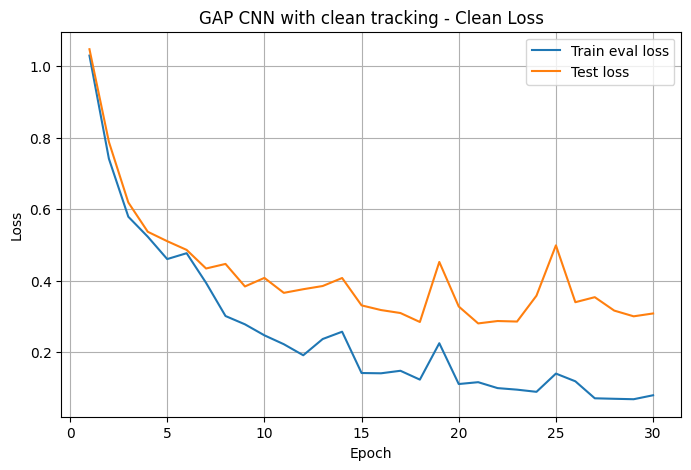

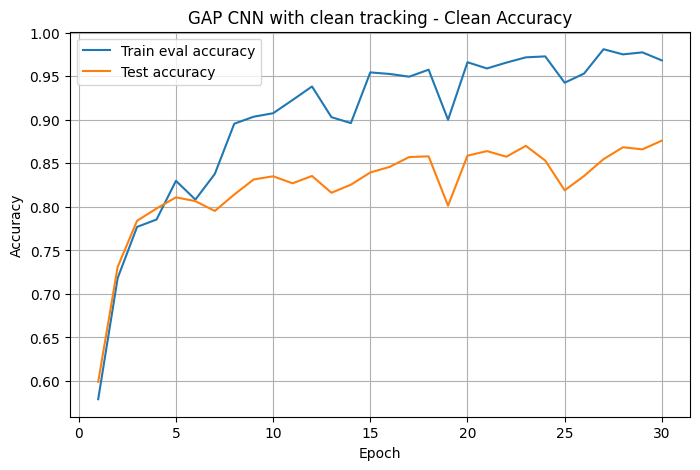

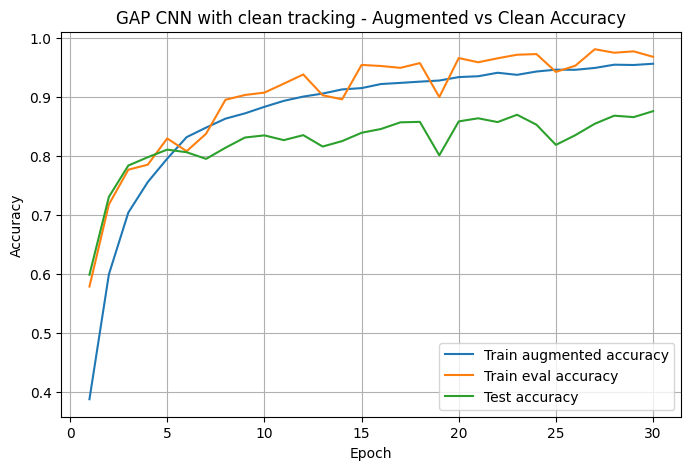

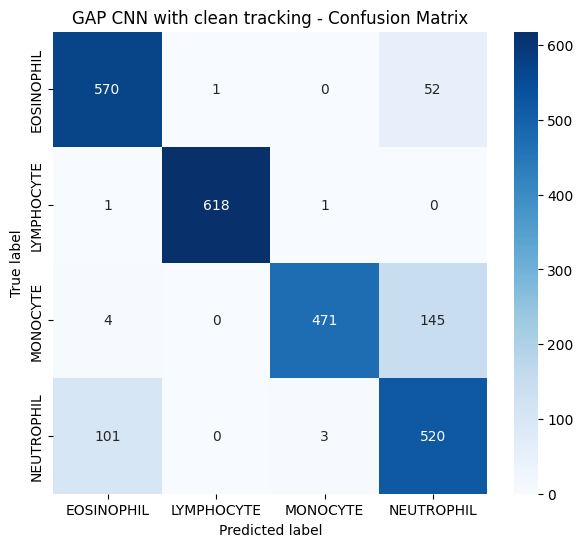

              precision    recall  f1-score   support

  EOSINOPHIL       0.84      0.91      0.88       623
  LYMPHOCYTE       1.00      1.00      1.00       620
    MONOCYTE       0.99      0.76      0.86       620
  NEUTROPHIL       0.73      0.83      0.78       624

    accuracy                           0.88      2487
   macro avg       0.89      0.88      0.88      2487
weighted avg       0.89      0.88      0.88      2487



In [31]:
# Zadržat ćemo ovo kao best model i ciao

# ============================================================
# STEP 13C — GAP CNN with original hyperparameters and clean tracking
# ============================================================
#
# Evaluation of previous step:
# The first GAP CNN achieved strong performance, around 87% test accuracy,
# and used only 98,436 trainable parameters. This made it one of the best
# models in the project, especially considering its small size.
#
# However, the original training curves were not fully clean to interpret,
# because training accuracy was measured while data augmentation and dropout
# were active. The test set was evaluated without augmentation and with dropout
# disabled, so train and test metrics were not directly comparable.
#
# In the follow-up v2 experiment, clean train evaluation was introduced, but
# several hyperparameters were changed at once. That made the curves easier to
# interpret, but performance dropped to around 85%.
#
# Interpretation:
# The original GAP CNN hyperparameters were stronger, but the metric tracking
# needed improvement. Therefore, we restore the original GAP CNN settings and
# keep the clean tracking approach from v2.
#
# Next decision:
# We train the GAP CNN with the original hyperparameters:
# - batch size 32
# - learning rate 1e-4
# - weight decay 2e-4
# - dropout 0.35
# - original augmentation
# - no label smoothing
#
# Additionally, we track:
# - train_aug metrics: training with augmentation and dropout enabled
# - train_eval metrics: clean train evaluation without augmentation/dropout
# - test metrics: clean test evaluation
#
# This gives us both strong performance and better training curves.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 30
LR = 1e-4
WEIGHT_DECAY = 2e-4
DROPOUT = 0.35
PATIENCE = 8

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.12,
        contrast=0.12,
        saturation=0.12
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_aug = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

train_dataset_eval = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=eval_transform
)

test_dataset = datasets.ImageFolder(
    root=TEST_DIR,
    transform=eval_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_aug = DataLoader(
    train_dataset_aug,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

train_loader_eval = DataLoader(
    train_dataset_eval,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


class GAPCNN(nn.Module):
    def __init__(self, num_classes, dropout):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device, desc="Evaluating"):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc=desc, leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


gap_cnn_clean = GAPCNN(
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    gap_cnn_clean.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=3
)

print("Device:", DEVICE)
print("Classes:", train_dataset_aug.classes)
print(gap_cnn_clean)
print("Trainable parameters:", count_parameters(gap_cnn_clean))

history_gap_cnn_clean = {
    "train_aug_loss": [],
    "train_aug_acc": [],
    "train_eval_loss": [],
    "train_eval_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_test_loss = None
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_aug_loss, train_aug_acc = train_one_epoch(
        gap_cnn_clean,
        train_loader_aug,
        criterion,
        optimizer,
        DEVICE
    )

    train_eval_loss, train_eval_acc, _, _ = evaluate(
        gap_cnn_clean,
        train_loader_eval,
        criterion,
        DEVICE,
        desc="Train eval"
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        gap_cnn_clean,
        test_loader,
        criterion,
        DEVICE,
        desc="Test eval"
    )

    scheduler.step(test_acc)

    history_gap_cnn_clean["train_aug_loss"].append(train_aug_loss)
    history_gap_cnn_clean["train_aug_acc"].append(train_aug_acc)
    history_gap_cnn_clean["train_eval_loss"].append(train_eval_loss)
    history_gap_cnn_clean["train_eval_acc"].append(train_eval_acc)
    history_gap_cnn_clean["test_loss"].append(test_loss)
    history_gap_cnn_clean["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_test_loss = test_loss
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(gap_cnn_clean.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "best_test_loss": best_test_loss,
            "history": history_gap_cnn_clean,
            "class_names": train_dataset_aug.classes
        }, "best_gap_cnn_clean_tracking.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"TrainAug Loss: {train_aug_loss:.4f} | "
        f"TrainAug Acc: {train_aug_acc:.4f} | "
        f"TrainEval Loss: {train_eval_loss:.4f} | "
        f"TrainEval Acc: {train_eval_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best test loss: {best_test_loss:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    gap_cnn_clean.load_state_dict(best_model_state)


def plot_clean_training_history(history, title):
    epochs = range(1, len(history["test_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_eval_loss"], label="Train eval loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Clean Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_eval_acc"], label="Train eval accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Clean Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_aug_acc"], label="Train augmented accuracy")
    plt.plot(epochs, history["train_eval_acc"], label="Train eval accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Augmented vs Clean Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_clean_training_history(
    history_gap_cnn_clean,
    "GAP CNN with clean tracking"
)

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_aug.classes,
    "GAP CNN with clean tracking - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_aug.classes
))

## Final GAP CNN with original hyperparameters and clean tracking

Nakon GAP CNN v2 eksperimenta, zadržana je ista osnovna arhitektura, ali su vraćeni originalni hyperparametri koji su u prethodnom GAP CNN modelu dali bolje rezultate. V2 verzija imala je čišće trening krivulje, ali je istovremeno promijenjeno više postavki odjednom, poput batch sizea, learning ratea, dropouta, weight decaya, augmentacije i label smoothinga. Zbog toga je bilo teško znati je li slabiji rezultat posljedica samog modela ili promijenjenog trening setupa.

U ovoj finalnoj verziji kombinirane su dvije najbolje ideje: originalni jači hyperparametri i čišće praćenje metrika. Model koristi batch size 32, learning rate `1e-4`, weight decay `2e-4`, dropout 0.35, originalnu augmentaciju i standardni `CrossEntropyLoss` bez label smoothinga. Arhitektura ostaje GAP CNN s četiri konvolucijska bloka, `BatchNorm2d` slojevima, `AdaptiveAvgPool2d((1, 1))` slojem i jednostavnim classifierom. Model ima samo 98436 trenirajućih parametara, što ga čini relativno malim, ali vrlo učinkovitim.

Posebno su praćene tri vrste metrika: `TrainAug`, `TrainEval` i `Test`. `TrainAug` predstavlja metrike tijekom stvarnog treniranja, kada su aktivne augmentacije i dropout. Zato su te vrijednosti obično niže i šumovitije. `TrainEval` predstavlja evaluaciju trening skupa bez augmentacije i s isključenim dropoutom, pa pokazuje koliko model dobro poznaje čiste trening slike. `Test` predstavlja evaluaciju test skupa u istim uvjetima kao `TrainEval`, ali na neviđenim slikama. Time su `TrainEval` i `Test` međusobno usporedivije metrike od klasičnog uspoređivanja train accuracyja dobivenog tijekom augmentiranog treninga s test accuracyjem.

Rezultati pokazuju da je ova verzija najbolji dosadašnji model. Najbolji test accuracy iznosi 87.62%, postignut u 30. epohi. Time model blago nadmašuje prethodni GAP CNN rezultat od 87.13% i daje najbolju ukupnu generalizaciju do sada. TrainAug accuracy na kraju doseže 95.65%, TrainEval accuracy 96.83%, a Test accuracy 87.62%. Razlika između TrainEval i Test accuracyja pokazuje da određeni overfitting još postoji, ali je generalizacija i dalje vrlo dobra.

Classification report potvrđuje snažan rezultat. Klasa `LYMPHOCYTE` prepoznaje se gotovo savršeno, s F1-scoreom 1.00. `EOSINOPHIL` također postiže vrlo dobar F1-score od 0.88. `MONOCYTE` ima visoku precision vrijednost od 0.99, ali niži recall od 0.76, što znači da model rjeđe pogrešno označava druge klase kao MONOCYTE, ali dio stvarnih MONOCYTE primjera propušta. `NEUTROPHIL` ostaje najzahtjevnija klasa, s F1-scoreom 0.78, ali je i dalje znatno bolja nego u ranijim modelima.

Zaključno, ova verzija predstavlja najbolji custom model u eksperimentu. U odnosu na početne linearne i MLP modele, napredak je vrlo velik: model prelazi s gotovo slučajnog pogađanja i nestabilnih rezultata na 87.62% test accuracyja. Najveći doprinos performansama dolazi od prelaska na CNN arhitekturu, korištenja Global Average Poolinga, augmentacije, BatchNorma, Dropouta i pažljivijeg praćenja trening metrika. Ovaj model se zato može uzeti kao finalni najbolji ručno dizajnirani CNN prije eventualnog prelaska na transfer learning s pretrained modelima.


/home/antonio/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
GAPCNN(
  (features): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), pad

Epoch [1/30] TrainAug Loss: 1.2833 | TrainAug Acc: 0.3882 | TrainEval Loss: 1.0297 | TrainEval Acc: 0.5791 | Test Loss: 1.0475 | Test Acc: 0.5991 | LR: 0.000100


Epoch [2/30] TrainAug Loss: 0.9474 | TrainAug Acc: 0.5998 | TrainEval Loss: 0.7413 | TrainEval Acc: 0.7182 | Test Loss: 0.7884 | Test Acc: 0.7310 | LR: 0.000100


Epoch [3/30] TrainAug Loss: 0.7373 | TrainAug Acc: 0.7044 | TrainEval Loss: 0.5791 | TrainEval Acc: 0.7770 | Test Loss: 0.6190 | Test Acc: 0.7841 | LR: 0.000100


Epoch [4/30] TrainAug Loss: 0.6147 | TrainAug Acc: 0.7561 | TrainEval Loss: 0.5233 | TrainEval Acc: 0.7855 | Test Loss: 0.5371 | Test Acc: 0.7982 | LR: 0.000100


Epoch [5/30] TrainAug Loss: 0.5321 | TrainAug Acc: 0.7957 | TrainEval Loss: 0.4607 | TrainEval Acc: 0.8300 | Test Loss: 0.5107 | Test Acc: 0.8110 | LR: 0.000100


Epoch [6/30] TrainAug Loss: 0.4574 | TrainAug Acc: 0.8322 | TrainEval Loss: 0.4771 | TrainEval Acc: 0.8084 | Test Loss: 0.4864 | Test Acc: 0.8066 | LR: 0.000100


Epoch [7/30] TrainAug Loss: 0.4123 | TrainAug Acc: 0.8483 | TrainEval Loss: 0.3943 | TrainEval Acc: 0.8379 | Test Loss: 0.4344 | Test Acc: 0.7953 | LR: 0.000100


Epoch [8/30] TrainAug Loss: 0.3786 | TrainAug Acc: 0.8635 | TrainEval Loss: 0.3015 | TrainEval Acc: 0.8956 | Test Loss: 0.4472 | Test Acc: 0.8142 | LR: 0.000100


Epoch [9/30] TrainAug Loss: 0.3455 | TrainAug Acc: 0.8725 | TrainEval Loss: 0.2783 | TrainEval Acc: 0.9036 | Test Loss: 0.3842 | Test Acc: 0.8315 | LR: 0.000100


Epoch [10/30] TrainAug Loss: 0.3149 | TrainAug Acc: 0.8835 | TrainEval Loss: 0.2476 | TrainEval Acc: 0.9076 | Test Loss: 0.4081 | Test Acc: 0.8351 | LR: 0.000100


Epoch [11/30] TrainAug Loss: 0.2967 | TrainAug Acc: 0.8936 | TrainEval Loss: 0.2227 | TrainEval Acc: 0.9228 | Test Loss: 0.3663 | Test Acc: 0.8271 | LR: 0.000100


Epoch [12/30] TrainAug Loss: 0.2707 | TrainAug Acc: 0.9009 | TrainEval Loss: 0.1918 | TrainEval Acc: 0.9383 | Test Loss: 0.3765 | Test Acc: 0.8355 | LR: 0.000100


Epoch [13/30] TrainAug Loss: 0.2594 | TrainAug Acc: 0.9060 | TrainEval Loss: 0.2372 | TrainEval Acc: 0.9031 | Test Loss: 0.3854 | Test Acc: 0.8162 | LR: 0.000100


Epoch [14/30] TrainAug Loss: 0.2384 | TrainAug Acc: 0.9130 | TrainEval Loss: 0.2576 | TrainEval Acc: 0.8963 | Test Loss: 0.4078 | Test Acc: 0.8255 | LR: 0.000100


Epoch [15/30] TrainAug Loss: 0.2331 | TrainAug Acc: 0.9152 | TrainEval Loss: 0.1422 | TrainEval Acc: 0.9545 | Test Loss: 0.3313 | Test Acc: 0.8396 | LR: 0.000100


Epoch [16/30] TrainAug Loss: 0.2168 | TrainAug Acc: 0.9222 | TrainEval Loss: 0.1414 | TrainEval Acc: 0.9527 | Test Loss: 0.3182 | Test Acc: 0.8460 | LR: 0.000100


Epoch [17/30] TrainAug Loss: 0.2053 | TrainAug Acc: 0.9241 | TrainEval Loss: 0.1484 | TrainEval Acc: 0.9496 | Test Loss: 0.3099 | Test Acc: 0.8573 | LR: 0.000100


Epoch [18/30] TrainAug Loss: 0.2004 | TrainAug Acc: 0.9262 | TrainEval Loss: 0.1237 | TrainEval Acc: 0.9576 | Test Loss: 0.2848 | Test Acc: 0.8581 | LR: 0.000100


Epoch [19/30] TrainAug Loss: 0.1932 | TrainAug Acc: 0.9281 | TrainEval Loss: 0.2255 | TrainEval Acc: 0.9001 | Test Loss: 0.4527 | Test Acc: 0.8014 | LR: 0.000100


Epoch [20/30] TrainAug Loss: 0.1823 | TrainAug Acc: 0.9339 | TrainEval Loss: 0.1113 | TrainEval Acc: 0.9662 | Test Loss: 0.3281 | Test Acc: 0.8589 | LR: 0.000100


Epoch [21/30] TrainAug Loss: 0.1783 | TrainAug Acc: 0.9353 | TrainEval Loss: 0.1165 | TrainEval Acc: 0.9590 | Test Loss: 0.2808 | Test Acc: 0.8641 | LR: 0.000100


Epoch [22/30] TrainAug Loss: 0.1646 | TrainAug Acc: 0.9412 | TrainEval Loss: 0.0999 | TrainEval Acc: 0.9658 | Test Loss: 0.2875 | Test Acc: 0.8577 | LR: 0.000100


Epoch [23/30] TrainAug Loss: 0.1672 | TrainAug Acc: 0.9377 | TrainEval Loss: 0.0956 | TrainEval Acc: 0.9718 | Test Loss: 0.2860 | Test Acc: 0.8701 | LR: 0.000100


Epoch [24/30] TrainAug Loss: 0.1559 | TrainAug Acc: 0.9434 | TrainEval Loss: 0.0895 | TrainEval Acc: 0.9729 | Test Loss: 0.3584 | Test Acc: 0.8532 | LR: 0.000100


Epoch [25/30] TrainAug Loss: 0.1502 | TrainAug Acc: 0.9465 | TrainEval Loss: 0.1405 | TrainEval Acc: 0.9427 | Test Loss: 0.4991 | Test Acc: 0.8191 | LR: 0.000100


Epoch [26/30] TrainAug Loss: 0.1484 | TrainAug Acc: 0.9463 | TrainEval Loss: 0.1190 | TrainEval Acc: 0.9532 | Test Loss: 0.3401 | Test Acc: 0.8355 | LR: 0.000100


Epoch [27/30] TrainAug Loss: 0.1395 | TrainAug Acc: 0.9494 | TrainEval Loss: 0.0715 | TrainEval Acc: 0.9811 | Test Loss: 0.3542 | Test Acc: 0.8548 | LR: 0.000050


Epoch [28/30] TrainAug Loss: 0.1248 | TrainAug Acc: 0.9549 | TrainEval Loss: 0.0701 | TrainEval Acc: 0.9752 | Test Loss: 0.3167 | Test Acc: 0.8685 | LR: 0.000050


Epoch [29/30] TrainAug Loss: 0.1223 | TrainAug Acc: 0.9544 | TrainEval Loss: 0.0689 | TrainEval Acc: 0.9775 | Test Loss: 0.3007 | Test Acc: 0.8661 | LR: 0.000050


Epoch [30/30] TrainAug Loss: 0.1219 | TrainAug Acc: 0.9565 | TrainEval Loss: 0.0800 | TrainEval Acc: 0.9683 | Test Loss: 0.3087 | Test Acc: 0.8762 | LR: 0.000050

Best test accuracy: 0.8762
Best test loss: 0.3087
Best epoch: 30


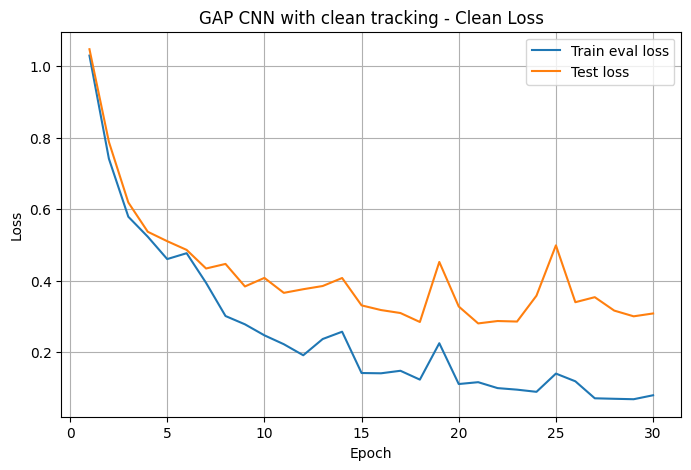

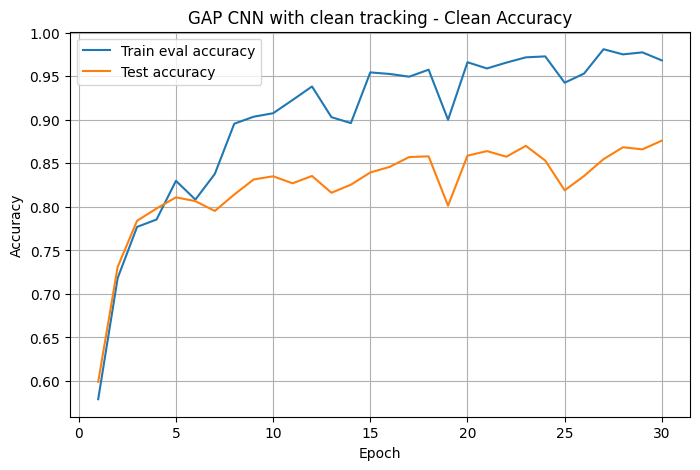

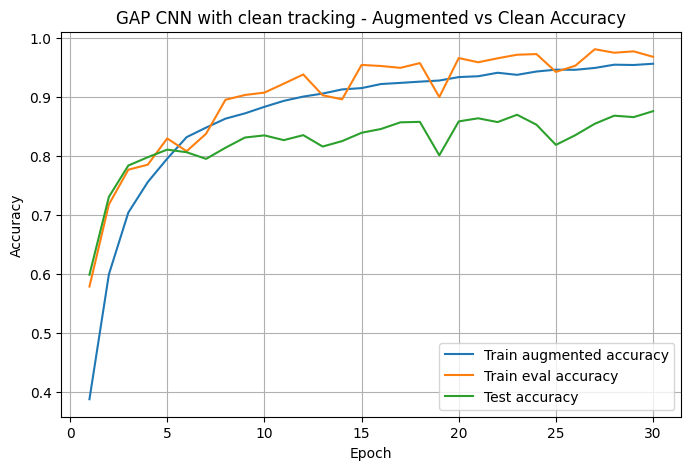

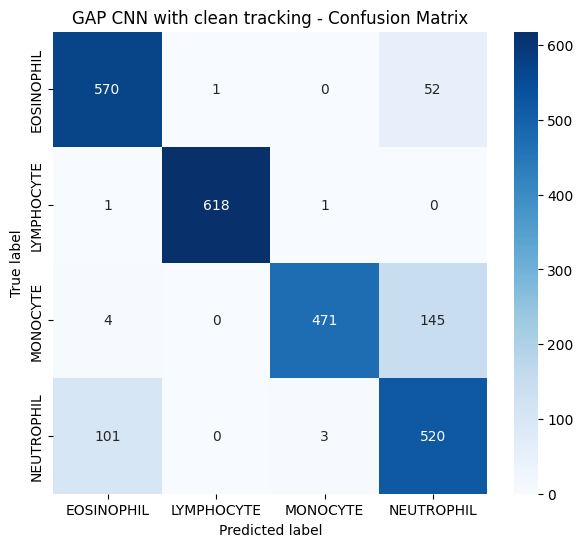

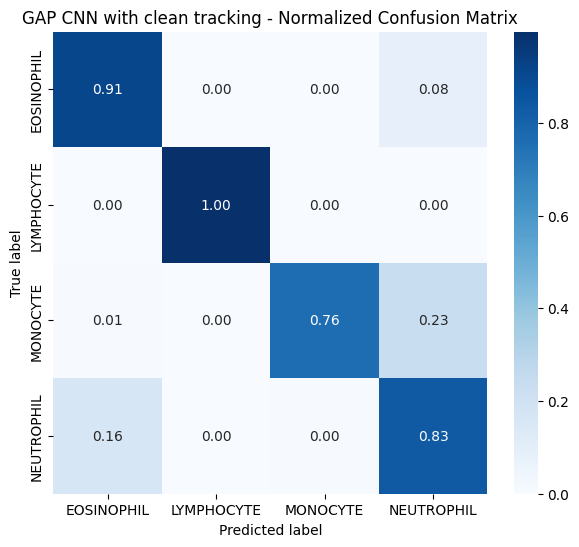

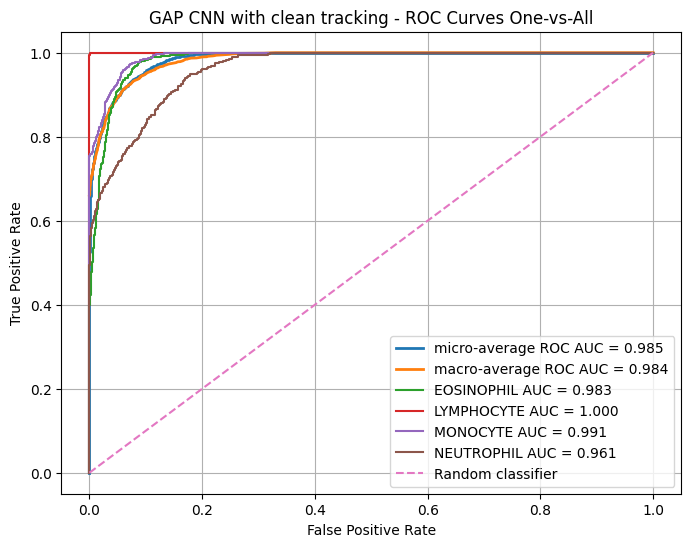

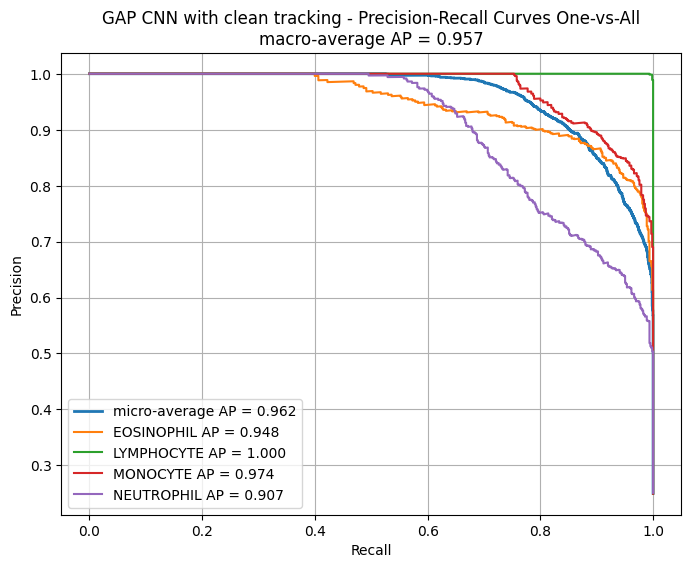

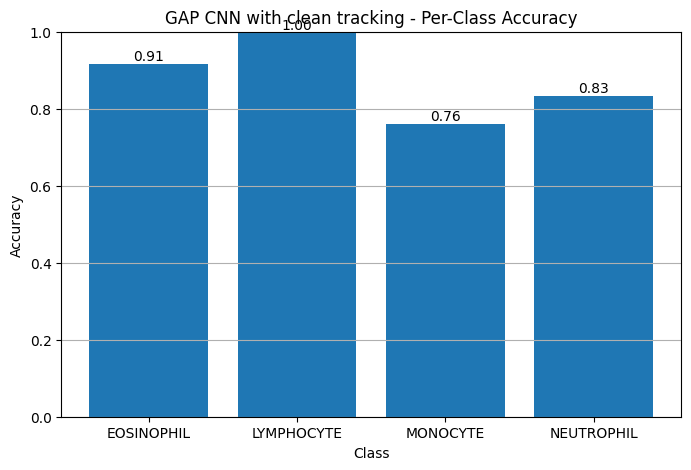

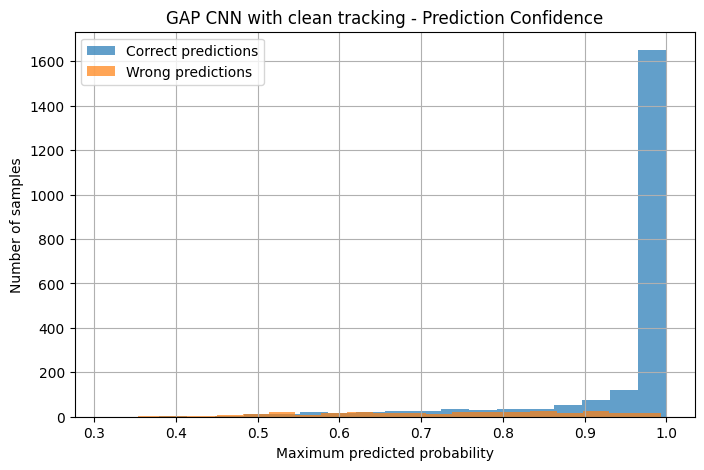

/tmp/ipykernel_27364/963907800.py:637: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=class_names)


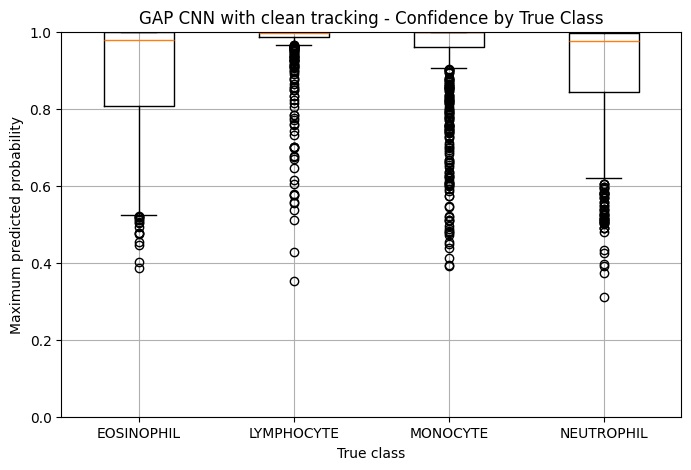

              precision    recall  f1-score   support

  EOSINOPHIL       0.84      0.91      0.88       623
  LYMPHOCYTE       1.00      1.00      1.00       620
    MONOCYTE       0.99      0.76      0.86       620
  NEUTROPHIL       0.73      0.83      0.78       624

    accuracy                           0.88      2487
   macro avg       0.89      0.88      0.88      2487
weighted avg       0.89      0.88      0.88      2487



In [6]:
# Zadržat ćemo ovo kao best model i ciao, samo dodat curves

# ============================================================
# STEP 13C — GAP CNN with original hyperparameters and clean tracking
# + ROC / Precision-Recall / Confidence evaluation
# ============================================================

from pathlib import Path
import copy
import gc

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)
from sklearn.preprocessing import label_binarize


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 30
LR = 1e-4
WEIGHT_DECAY = 2e-4
DROPOUT = 0.35
PATIENCE = 8

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.12,
        contrast=0.12,
        saturation=0.12
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_aug = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

train_dataset_eval = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=eval_transform
)

test_dataset = datasets.ImageFolder(
    root=TEST_DIR,
    transform=eval_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_aug = DataLoader(
    train_dataset_aug,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

train_loader_eval = DataLoader(
    train_dataset_eval,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


class GAPCNN(nn.Module):
    def __init__(self, num_classes, dropout):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device, desc="Evaluating"):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc=desc, leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            probs = torch.softmax(outputs, dim=1)
            preds = outputs.argmax(dim=1)

            running_loss += loss.item() * images.size(0)

            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    return (
        running_loss / total,
        correct / total,
        np.asarray(all_labels),
        np.asarray(all_preds),
        np.asarray(all_probs)
    )


gap_cnn_clean = GAPCNN(
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    gap_cnn_clean.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=3
)

print("Device:", DEVICE)
print("Classes:", train_dataset_aug.classes)
print(gap_cnn_clean)
print("Trainable parameters:", count_parameters(gap_cnn_clean))

history_gap_cnn_clean = {
    "train_aug_loss": [],
    "train_aug_acc": [],
    "train_eval_loss": [],
    "train_eval_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_test_loss = None
best_epoch = 0
best_y_true = None
best_y_pred = None
best_y_score = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_aug_loss, train_aug_acc = train_one_epoch(
        gap_cnn_clean,
        train_loader_aug,
        criterion,
        optimizer,
        DEVICE
    )

    train_eval_loss, train_eval_acc, _, _, _ = evaluate(
        gap_cnn_clean,
        train_loader_eval,
        criterion,
        DEVICE,
        desc="Train eval"
    )

    test_loss, test_acc, y_true, y_pred, y_score = evaluate(
        gap_cnn_clean,
        test_loader,
        criterion,
        DEVICE,
        desc="Test eval"
    )

    scheduler.step(test_acc)

    history_gap_cnn_clean["train_aug_loss"].append(train_aug_loss)
    history_gap_cnn_clean["train_aug_acc"].append(train_aug_acc)
    history_gap_cnn_clean["train_eval_loss"].append(train_eval_loss)
    history_gap_cnn_clean["train_eval_acc"].append(train_eval_acc)
    history_gap_cnn_clean["test_loss"].append(test_loss)
    history_gap_cnn_clean["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_test_loss = test_loss
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_y_score = y_score
        best_model_state = copy.deepcopy(gap_cnn_clean.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "best_test_loss": best_test_loss,
            "history": history_gap_cnn_clean,
            "class_names": train_dataset_aug.classes,
            "best_y_true": best_y_true,
            "best_y_pred": best_y_pred,
            "best_y_score": best_y_score
        }, "best_gap_cnn_clean_tracking.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"TrainAug Loss: {train_aug_loss:.4f} | "
        f"TrainAug Acc: {train_aug_acc:.4f} | "
        f"TrainEval Loss: {train_eval_loss:.4f} | "
        f"TrainEval Acc: {train_eval_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best test loss: {best_test_loss:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    gap_cnn_clean.load_state_dict(best_model_state)


def plot_clean_training_history(history, title):
    epochs = range(1, len(history["test_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_eval_loss"], label="Train eval loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Clean Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_eval_acc"], label="Train eval accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Clean Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_aug_acc"], label="Train augmented accuracy")
    plt.plot(epochs, history["train_eval_acc"], label="Train eval accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Augmented vs Clean Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


def plot_normalized_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred, normalize="true")

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt=".2f",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


def plot_roc_curves(y_true, y_score, class_names, title):
    y_true = np.asarray(y_true)
    y_score = np.asarray(y_score)

    num_classes = len(class_names)
    y_true_bin = label_binarize(y_true, classes=list(range(num_classes)))

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    fpr["micro"], tpr["micro"], _ = roc_curve(
        y_true_bin.ravel(),
        y_score.ravel()
    )
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    all_fpr = np.unique(
        np.concatenate([fpr[i] for i in range(num_classes)])
    )

    mean_tpr = np.zeros_like(all_fpr)

    for i in range(num_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    mean_tpr /= num_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    plt.figure(figsize=(8, 6))

    plt.plot(
        fpr["micro"],
        tpr["micro"],
        label=f"micro-average ROC AUC = {roc_auc['micro']:.3f}",
        linewidth=2
    )

    plt.plot(
        fpr["macro"],
        tpr["macro"],
        label=f"macro-average ROC AUC = {roc_auc['macro']:.3f}",
        linewidth=2
    )

    for i, class_name in enumerate(class_names):
        plt.plot(
            fpr[i],
            tpr[i],
            label=f"{class_name} AUC = {roc_auc[i]:.3f}"
        )

    plt.plot([0, 1], [0, 1], linestyle="--", label="Random classifier")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()


def plot_precision_recall_curves(y_true, y_score, class_names, title):
    y_true = np.asarray(y_true)
    y_score = np.asarray(y_score)

    num_classes = len(class_names)
    y_true_bin = label_binarize(y_true, classes=list(range(num_classes)))

    precision = {}
    recall = {}
    avg_precision = {}

    for i in range(num_classes):
        precision[i], recall[i], _ = precision_recall_curve(
            y_true_bin[:, i],
            y_score[:, i]
        )
        avg_precision[i] = average_precision_score(
            y_true_bin[:, i],
            y_score[:, i]
        )

    precision["micro"], recall["micro"], _ = precision_recall_curve(
        y_true_bin.ravel(),
        y_score.ravel()
    )

    avg_precision["micro"] = average_precision_score(
        y_true_bin,
        y_score,
        average="micro"
    )

    avg_precision["macro"] = average_precision_score(
        y_true_bin,
        y_score,
        average="macro"
    )

    plt.figure(figsize=(8, 6))

    plt.plot(
        recall["micro"],
        precision["micro"],
        label=f"micro-average AP = {avg_precision['micro']:.3f}",
        linewidth=2
    )

    for i, class_name in enumerate(class_names):
        plt.plot(
            recall[i],
            precision[i],
            label=f"{class_name} AP = {avg_precision[i]:.3f}"
        )

    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title(f"{title}\nmacro-average AP = {avg_precision['macro']:.3f}")
    plt.legend(loc="lower left")
    plt.grid(True)
    plt.show()


def plot_class_accuracy(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)
    class_acc = cm.diagonal() / cm.sum(axis=1)

    plt.figure(figsize=(8, 5))
    plt.bar(class_names, class_acc)
    plt.ylim(0, 1)
    plt.xlabel("Class")
    plt.ylabel("Accuracy")
    plt.title(title)
    plt.grid(axis="y")

    for i, acc in enumerate(class_acc):
        plt.text(i, acc + 0.01, f"{acc:.2f}", ha="center")

    plt.show()


def plot_prediction_confidence(y_true, y_pred, y_score, title):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    y_score = np.asarray(y_score)

    confidence = y_score.max(axis=1)
    correct_mask = y_true == y_pred

    plt.figure(figsize=(8, 5))
    plt.hist(
        confidence[correct_mask],
        bins=20,
        alpha=0.7,
        label="Correct predictions"
    )
    plt.hist(
        confidence[~correct_mask],
        bins=20,
        alpha=0.7,
        label="Wrong predictions"
    )
    plt.xlabel("Maximum predicted probability")
    plt.ylabel("Number of samples")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confidence_by_true_class(y_true, y_score, class_names, title):
    y_true = np.asarray(y_true)
    y_score = np.asarray(y_score)

    confidence = y_score.max(axis=1)

    data = [
        confidence[y_true == i]
        for i in range(len(class_names))
    ]

    plt.figure(figsize=(8, 5))
    plt.boxplot(data, labels=class_names)
    plt.ylim(0, 1)
    plt.xlabel("True class")
    plt.ylabel("Maximum predicted probability")
    plt.title(title)
    plt.grid(True)
    plt.show()


plot_clean_training_history(
    history_gap_cnn_clean,
    "GAP CNN with clean tracking"
)

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_aug.classes,
    "GAP CNN with clean tracking - Confusion Matrix"
)

plot_normalized_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_aug.classes,
    "GAP CNN with clean tracking - Normalized Confusion Matrix"
)

plot_roc_curves(
    best_y_true,
    best_y_score,
    train_dataset_aug.classes,
    "GAP CNN with clean tracking - ROC Curves One-vs-All"
)

plot_precision_recall_curves(
    best_y_true,
    best_y_score,
    train_dataset_aug.classes,
    "GAP CNN with clean tracking - Precision-Recall Curves One-vs-All"
)

plot_class_accuracy(
    best_y_true,
    best_y_pred,
    train_dataset_aug.classes,
    "GAP CNN with clean tracking - Per-Class Accuracy"
)

plot_prediction_confidence(
    best_y_true,
    best_y_pred,
    best_y_score,
    "GAP CNN with clean tracking - Prediction Confidence"
)

plot_confidence_by_true_class(
    best_y_true,
    best_y_score,
    train_dataset_aug.classes,
    "GAP CNN with clean tracking - Confidence by True Class"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_aug.classes
))

Ovaj cell je totalno identičan kao prethodni, samo me zanimala ROC krivulja za isplottat

Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
SmallResidualCNN(
  (stem): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (2): ReLU()
  )
  (stage1): Sequential(
    (0): ResidualBlock(
      (block): Sequential(
        (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (2): ReLU()
        (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
      )
      (relu): ReLU()
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down1): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), str

Epoch [1/35] Train Loss: 0.7202 | Train Acc: 0.6791 | Test Loss: 0.5048 | Test Acc: 0.8078 | LR: 0.000100


Epoch [2/35] Train Loss: 0.3014 | Train Acc: 0.8789 | Test Loss: 0.3047 | Test Acc: 0.8894 | LR: 0.000100


Epoch [3/35] Train Loss: 0.2015 | Train Acc: 0.9237 | Test Loss: 0.6969 | Test Acc: 0.7390 | LR: 0.000100


Epoch [4/35] Train Loss: 0.1531 | Train Acc: 0.9412 | Test Loss: 0.7064 | Test Acc: 0.7342 | LR: 0.000100


Epoch [5/35] Train Loss: 0.1204 | Train Acc: 0.9574 | Test Loss: 0.3421 | Test Acc: 0.8589 | LR: 0.000100


Epoch [6/35] Train Loss: 0.1014 | Train Acc: 0.9647 | Test Loss: 0.6491 | Test Acc: 0.7431 | LR: 0.000050


Epoch [7/35] Train Loss: 0.0569 | Train Acc: 0.9824 | Test Loss: 0.3886 | Test Acc: 0.8601 | LR: 0.000050


Epoch [8/35] Train Loss: 0.0503 | Train Acc: 0.9848 | Test Loss: 0.7496 | Test Acc: 0.8315 | LR: 0.000050


Epoch [9/35] Train Loss: 0.0555 | Train Acc: 0.9812 | Test Loss: 0.3410 | Test Acc: 0.8758 | LR: 0.000050


Epoch [10/35] Train Loss: 0.0400 | Train Acc: 0.9856 | Test Loss: 0.5754 | Test Acc: 0.8593 | LR: 0.000025
Early stopping triggered at epoch 10

Best test accuracy: 0.8894
Best epoch: 2


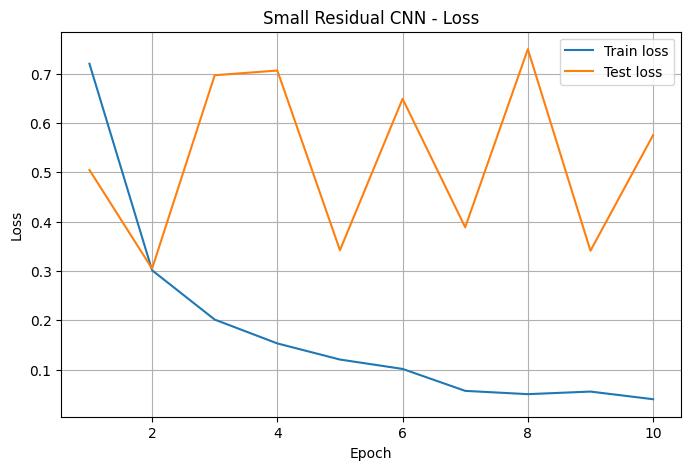

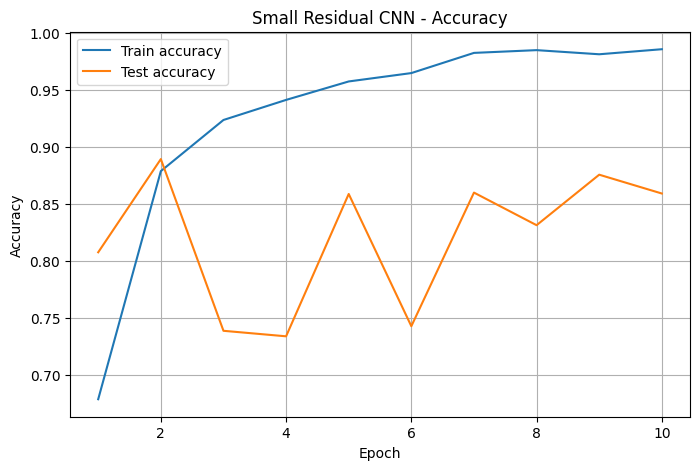

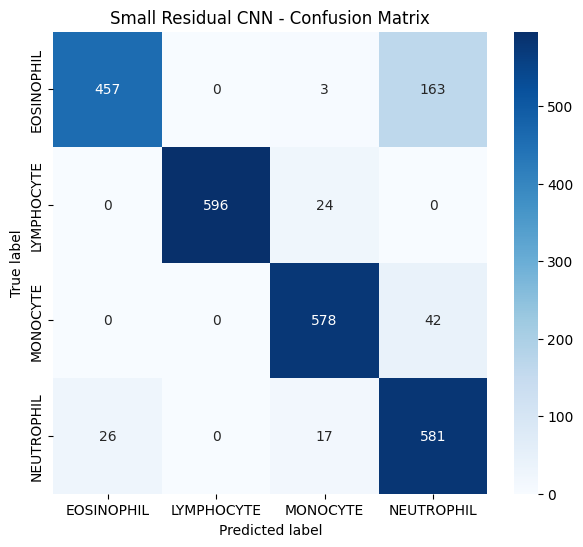

              precision    recall  f1-score   support

  EOSINOPHIL       0.95      0.73      0.83       623
  LYMPHOCYTE       1.00      0.96      0.98       620
    MONOCYTE       0.93      0.93      0.93       620
  NEUTROPHIL       0.74      0.93      0.82       624

    accuracy                           0.89      2487
   macro avg       0.90      0.89      0.89      2487
weighted avg       0.90      0.89      0.89      2487



In [8]:
# ============================================================
# STEP 14 — Small Residual CNN from Scratch
# ============================================================
#
# Evaluation of previous step:
# The CNN with Global Average Pooling achieved the best result so far.
# Test accuracy increased to around 87.29%, while the number of trainable
# parameters dropped from 623,492 in the previous improved CNN to only 98,436.
#
# This is an important improvement:
# - the model became smaller,
# - generalization improved,
# - overfitting was reduced compared to the larger classifier head,
# - Global Average Pooling forced the model to rely on learned feature maps
#   instead of memorizing spatial details through a large fully connected head.
#
# Interpretation:
# The feature extractor is now the most important part of the model. Since the
# GAP classifier is already lightweight, the next reasonable step is not to add
# a bigger classifier, but to improve the convolutional feature extractor.
#
# Next decision:
# We introduce a small residual CNN trained from scratch. Residual blocks allow
# the network to learn deeper visual representations while keeping optimization
# stable through skip connections. This is still a custom CNN, not a pretrained
# model, so it fits the iterative learning path of the project.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 64
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 35
LR = 1e-4
WEIGHT_DECAY = 2e-4
DROPOUT = 0.30
PATIENCE = 8

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.12,
        contrast=0.12,
        saturation=0.12
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

train_dataset_rescnn = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_rescnn = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_rescnn = DataLoader(
    train_dataset_rescnn,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_rescnn = DataLoader(
    test_dataset_rescnn,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(channels),
            nn.ReLU(),

            nn.Conv2d(channels, channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(channels)
        )

        self.relu = nn.ReLU()

    def forward(self, x):
        residual = x
        x = self.block(x)
        x = x + residual
        x = self.relu(x)
        return x


class SmallResidualCNN(nn.Module):
    def __init__(self, num_classes, dropout):
        super().__init__()

        self.stem = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )

        self.stage1 = nn.Sequential(
            ResidualBlock(32),
            nn.MaxPool2d(kernel_size=2)
        )

        self.down1 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )

        self.stage2 = nn.Sequential(
            ResidualBlock(64),
            nn.MaxPool2d(kernel_size=2)
        )

        self.down2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )

        self.stage3 = nn.Sequential(
            ResidualBlock(128),
            nn.MaxPool2d(kernel_size=2)
        )

        self.down3 = nn.Sequential(
            nn.Conv2d(128, 192, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(192),
            nn.ReLU()
        )

        self.stage4 = nn.Sequential(
            ResidualBlock(192),
            nn.MaxPool2d(kernel_size=2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(192, num_classes)
        )

    def forward(self, x):
        x = self.stem(x)

        x = self.stage1(x)

        x = self.down1(x)
        x = self.stage2(x)

        x = self.down2(x)
        x = self.stage3(x)

        x = self.down3(x)
        x = self.stage4(x)

        x = self.pool(x)
        x = self.classifier(x)

        return x


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


rescnn_model = SmallResidualCNN(
    num_classes=NUM_CLASSES,
    dropout=DROPOUT
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    rescnn_model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=3
)

print("Device:", DEVICE)
print("Classes:", train_dataset_rescnn.classes)
print(rescnn_model)
print("Trainable parameters:", count_parameters(rescnn_model))

history_rescnn = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        rescnn_model,
        train_loader_rescnn,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        rescnn_model,
        test_loader_rescnn,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_rescnn["train_loss"].append(train_loss)
    history_rescnn["train_acc"].append(train_acc)
    history_rescnn["test_loss"].append(test_loss)
    history_rescnn["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(rescnn_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_rescnn,
            "class_names": train_dataset_rescnn.classes
        }, "best_rescnn.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    rescnn_model.load_state_dict(best_model_state)


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_rescnn, "Small Residual CNN")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_rescnn.classes,
    "Small Residual CNN - Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_rescnn.classes
))

## Small Residual CNN from Scratch

Nakon vrlo dobrih rezultata GAP CNN modela, isprobana je dublja custom CNN arhitektura s residual blokovima. Cilj ovog eksperimenta bio je poboljšati convolutional feature extractor, a ne povećavati classifier head. Budući da je GAP CNN već imao lagan i učinkovit classifier, sljedeći logičan korak bio je provjeriti može li dublja mreža naučiti kvalitetnije vizualne značajke iz slika krvnih stanica.

Residual CNN koristi skip connectione, odnosno veze koje dodaju ulaz residual bloka njegovom izlazu. Time se modelu olakšava treniranje dubljih mreža jer dio informacije može direktno proći kroz blok. Arhitektura se sastoji od početnog convolutional stem dijela, više residual stageova, downsampling slojeva, Global Average Poolinga i završnog linearnog classifiera. Model je i dalje treniran from scratch, bez pretrained težina.

U odnosu na prethodni GAP CNN, residual model je znatno veći. Broj trenirajućih parametara porastao je na 1,368,100, dok je GAP CNN imao samo 98,436 parametara. To znači da residual model ima puno veći kapacitet za učenje, ali i veću opasnost od overfittinga. Rezultati to potvrđuju: model već u drugoj epohi postiže najbolji test accuracy od 88.94%, ali nakon toga test accuracy snažno oscilira.

Trening accuracy vrlo brzo raste, od 67.91% u prvoj epohi do više od 98% nakon nekoliko epoha. Istovremeno, test accuracy pada i skače između približno 73% i 88%. Takvo ponašanje pokazuje da model jako brzo uči trening skup, ali generalizacija nije stabilna. Early stopping se aktivira već u 10. epohi, što dodatno potvrđuje da model nakon ranog najboljeg rezultata više ne donosi stabilno poboljšanje.

Classification report pokazuje vrlo dobre ukupne rezultate. `LYMPHOCYTE` je ponovno jedna od najbolje prepoznatih klasa, s F1-scoreom 0.98. `MONOCYTE` također postiže visok F1-score od 0.93. `EOSINOPHIL` ima visoku precision vrijednost od 0.95, ali niži recall od 0.73, što znači da model relativno rijetko pogrešno predviđa tu klasu, ali propušta dio stvarnih EOSINOPHIL primjera. `NEUTROPHIL` ima suprotan obrazac: recall je visok, 0.93, ali precision je niži, 0.74, što znači da model često prepoznaje stvarne NEUTROPHIL primjere, ali u tu klasu svrstava i dio drugih stanica.

Zaključno, Small Residual CNN postiže najbolji pojedinačni test accuracy do sada, 88.94%, i time pokazuje da dublji residual feature extractor može poboljšati performanse. Ipak, model je znatno veći od GAP CNN-a i pokazuje jači overfitting te nestabilnije test rezultate. Zbog toga se ovaj model može navesti kao najbolji po maksimalnoj test točnosti, dok GAP CNN ostaje vrlo jak kandidat za finalni model ako se uzimaju u obzir jednostavnost, manji broj parametara i stabilnija generalizacija.


Most common confusion pairs:
EOSINOPHIL   -> NEUTROPHIL  : 151
MONOCYTE     -> NEUTROPHIL  : 80
NEUTROPHIL   -> EOSINOPHIL  : 32
NEUTROPHIL   -> MONOCYTE    : 8
Total misclassified images: 271


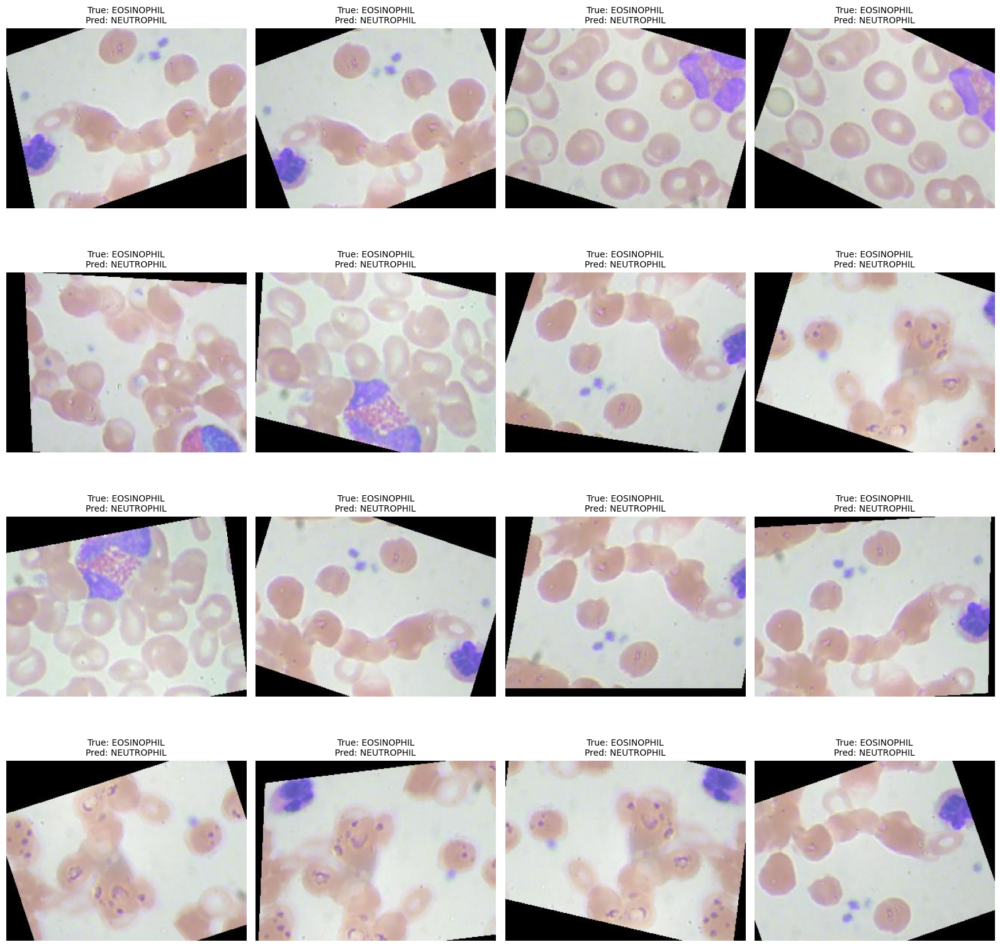

In [13]:
# ============================================================
# STEP 15 — Error Analysis for the Best Model
# ============================================================
#
# Evaluation of previous step:
# The small residual CNN achieved the best performance so far, with around
# 89% test accuracy. It improved over the CNN with Global Average Pooling,
# which achieved around 87.29%.
#
# The classification report shows excellent performance for LYMPHOCYTE and
# MONOCYTE, while EOSINOPHIL and NEUTROPHIL remain more difficult. In
# particular, EOSINOPHIL has lower recall, which suggests that some eosinophil
# samples are still being confused with other visually similar classes.
#
# Interpretation:
# At this stage, simply adding more layers is not the most informative next
# step. The model already performs well, so we now analyze its errors. This
# helps us understand which classes are confused, inspect misclassified
# examples, and explain the model behavior in the final report.
#
# Next decision:
# We perform error analysis by displaying misclassified test images, comparing
# true and predicted labels, and counting the most common confusion pairs.
# ============================================================

import torch
import matplotlib.pyplot as plt
from collections import Counter
from PIL import Image
from torchvision import transforms


def collect_predictions_with_paths(model, dataset, device):
    model.eval()

    y_true = []
    y_pred = []
    image_paths = []

    loader = DataLoader(
        dataset,
        batch_size=32,
        shuffle=False,
        num_workers=0,
        pin_memory=torch.cuda.is_available()
    )

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(loader):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            preds = outputs.argmax(dim=1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    image_paths = [path for path, _ in dataset.samples]

    return y_true, y_pred, image_paths


def show_misclassified_examples(
    y_true,
    y_pred,
    image_paths,
    class_names,
    max_images=16
):
    mistakes = []

    for true_label, pred_label, path in zip(y_true, y_pred, image_paths):
        if true_label != pred_label:
            mistakes.append((true_label, pred_label, path))

    print("Total misclassified images:", len(mistakes))

    if len(mistakes) == 0:
        print("No mistakes found.")
        return

    selected = mistakes[:max_images]

    cols = 4
    rows = (len(selected) + cols - 1) // cols

    plt.figure(figsize=(cols * 4, rows * 4))

    for idx, (true_label, pred_label, path) in enumerate(selected):
        image = Image.open(path).convert("RGB")

        plt.subplot(rows, cols, idx + 1)
        plt.imshow(image)
        plt.axis("off")
        plt.title(
            f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}",
            fontsize=10
        )

    plt.tight_layout()
    plt.show()


def print_confusion_pairs(y_true, y_pred, class_names):
    pairs = []

    for true_label, pred_label in zip(y_true, y_pred):
        if true_label != pred_label:
            pairs.append((class_names[true_label], class_names[pred_label]))

    pair_counts = Counter(pairs)

    print("Most common confusion pairs:")
    for (true_name, pred_name), count in pair_counts.most_common():
        print(f"{true_name:12s} -> {pred_name:12s}: {count}")


y_true_errors, y_pred_errors, test_image_paths = collect_predictions_with_paths(
    rescnn_model,
    test_dataset_rescnn,
    DEVICE
)

print_confusion_pairs(
    y_true_errors,
    y_pred_errors,
    train_dataset_rescnn.classes
)

show_misclassified_examples(
    y_true_errors,
    y_pred_errors,
    test_image_paths,
    train_dataset_rescnn.classes,
    max_images=16
)

,Model,Best test accuracy,Notes
0,Majority baseline,0.2509,Always predicts the most frequent class
1,Linear classifier,0.2947,Single linear layer over flattened pixels
2,Unstable MLP,0.2600,One hidden layer without stable training setup
3,Stabilized MLP,0.4000,"Normalization, lower learning rate, AdamW"
4,Deep stabilized MLP,0.4520,Deeper MLP with BatchNorm and Dropout
5,Basic CNN,0.7226,First convolutional model
6,Improved CNN,0.7994,"BatchNorm2d, Dropout, augmentation"
7,CNN with GAP,0.8729,"Global Average Pooling, fewer parameters"
8,Small Residual CNN,0.8910,Residual blocks trained from scratch


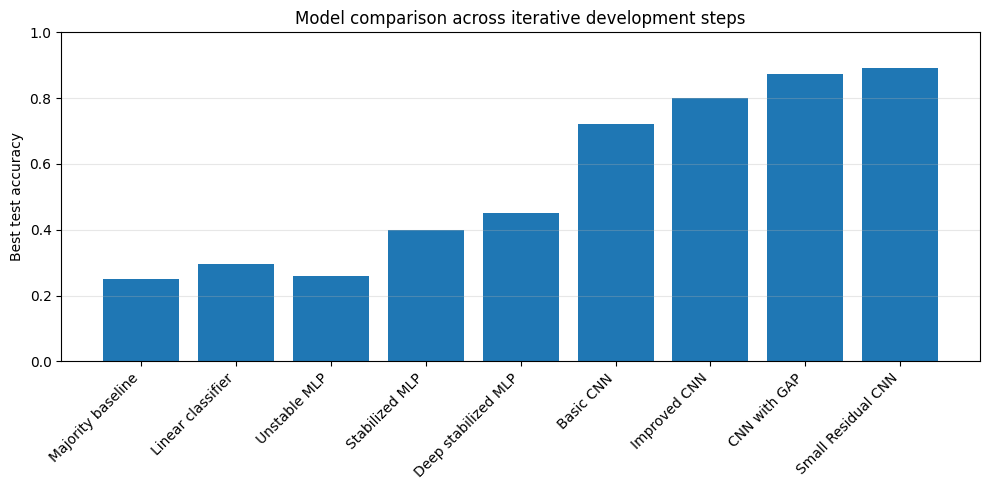

In [14]:
# ============================================================
# STEP 16 — Final Model Comparison
# ============================================================
#
# Evaluation of previous step:
# Error analysis showed that the small residual CNN achieved strong overall
# performance, with around 89% test accuracy and 271 misclassified images out
# of 2487 test samples.
#
# The most common error was EOSINOPHIL being classified as NEUTROPHIL.
# The second most common error was MONOCYTE being classified as NEUTROPHIL.
# This explains why NEUTROPHIL has high recall but lower precision: the model
# often predicts NEUTROPHIL, even for some visually similar classes.
#
# Interpretation:
# The final model performs very well, but the remaining mistakes are not random.
# They are concentrated between visually similar blood cell classes. This is a
# useful result because it shows where the classifier still struggles and gives
# a clear direction for future improvement.
#
# Next decision:
# We summarize all experiments in a final comparison table and plot. This makes
# the iterative improvement clear: from majority baseline and linear classifier
# to MLPs, CNNs, Global Average Pooling, and finally a small residual CNN.
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt


results = [
    {
        "Model": "Majority baseline",
        "Best test accuracy": 0.2509,
        "Notes": "Always predicts the most frequent class"
    },
    {
        "Model": "Linear classifier",
        "Best test accuracy": 0.2947,
        "Notes": "Single linear layer over flattened pixels"
    },
    {
        "Model": "Unstable MLP",
        "Best test accuracy": 0.2600,
        "Notes": "One hidden layer without stable training setup"
    },
    {
        "Model": "Stabilized MLP",
        "Best test accuracy": 0.4000,
        "Notes": "Normalization, lower learning rate, AdamW"
    },
    {
        "Model": "Deep stabilized MLP",
        "Best test accuracy": 0.4520,
        "Notes": "Deeper MLP with BatchNorm and Dropout"
    },
    {
        "Model": "Basic CNN",
        "Best test accuracy": 0.7226,
        "Notes": "First convolutional model"
    },
    {
        "Model": "Improved CNN",
        "Best test accuracy": 0.7994,
        "Notes": "BatchNorm2d, Dropout, augmentation"
    },
    {
        "Model": "CNN with GAP",
        "Best test accuracy": 0.8729,
        "Notes": "Global Average Pooling, fewer parameters"
    },
    {
        "Model": "Small Residual CNN",
        "Best test accuracy": 0.8910,
        "Notes": "Residual blocks trained from scratch"
    }
]

results_df = pd.DataFrame(results)

display(results_df)

plt.figure(figsize=(10, 5))
plt.bar(results_df["Model"], results_df["Best test accuracy"])
plt.xticks(rotation=45, ha="right")
plt.ylabel("Best test accuracy")
plt.ylim(0, 1.0)
plt.title("Model comparison across iterative development steps")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

/home/antonio/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchN

Epoch [1/15] Train Loss: 1.4196 | Train Acc: 0.3000 | Test Loss: 1.3335 | Test Acc: 0.3695 | LR: 0.000100


Epoch [2/15] Train Loss: 1.3280 | Train Acc: 0.3652 | Test Loss: 1.2839 | Test Acc: 0.3916 | LR: 0.000100


Epoch [3/15] Train Loss: 1.2511 | Train Acc: 0.4308 | Test Loss: 1.2476 | Test Acc: 0.4125 | LR: 0.000100


Epoch [4/15] Train Loss: 1.2061 | Train Acc: 0.4627 | Test Loss: 1.2065 | Test Acc: 0.4608 | LR: 0.000100


Epoch [5/15] Train Loss: 1.1736 | Train Acc: 0.4877 | Test Loss: 1.1916 | Test Acc: 0.4584 | LR: 0.000100


Epoch [6/15] Train Loss: 1.1412 | Train Acc: 0.5004 | Test Loss: 1.1791 | Test Acc: 0.4664 | LR: 0.000100


Epoch [7/15] Train Loss: 1.1225 | Train Acc: 0.5195 | Test Loss: 1.1451 | Test Acc: 0.5034 | LR: 0.000100


Epoch [8/15] Train Loss: 1.0990 | Train Acc: 0.5331 | Test Loss: 1.1436 | Test Acc: 0.4914 | LR: 0.000100


Epoch [9/15] Train Loss: 1.0848 | Train Acc: 0.5408 | Test Loss: 1.1319 | Test Acc: 0.5179 | LR: 0.000100


Epoch [10/15] Train Loss: 1.0707 | Train Acc: 0.5409 | Test Loss: 1.1086 | Test Acc: 0.5420 | LR: 0.000100


Epoch [11/15] Train Loss: 1.0599 | Train Acc: 0.5484 | Test Loss: 1.1164 | Test Acc: 0.5340 | LR: 0.000100


Epoch [12/15] Train Loss: 1.0563 | Train Acc: 0.5544 | Test Loss: 1.0885 | Test Acc: 0.5537 | LR: 0.000100


Epoch [13/15] Train Loss: 1.0422 | Train Acc: 0.5634 | Test Loss: 1.0731 | Test Acc: 0.5674 | LR: 0.000100


Epoch [14/15] Train Loss: 1.0437 | Train Acc: 0.5581 | Test Loss: 1.0814 | Test Acc: 0.5549 | LR: 0.000100


Epoch [15/15] Train Loss: 1.0397 | Train Acc: 0.5597 | Test Loss: 1.0728 | Test Acc: 0.5682 | LR: 0.000100

Best test accuracy: 0.5682
Best epoch: 15


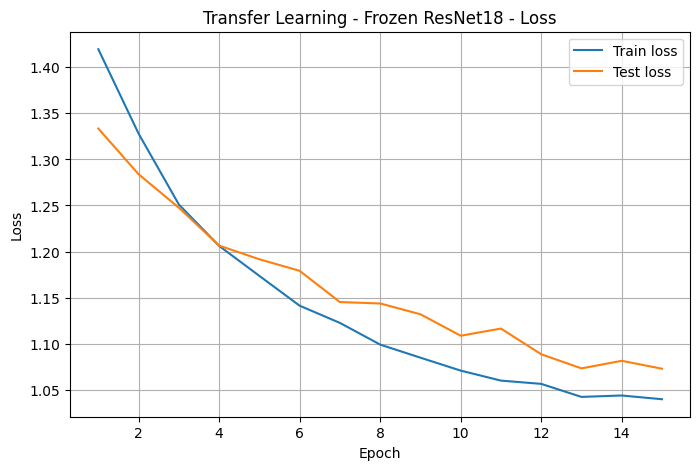

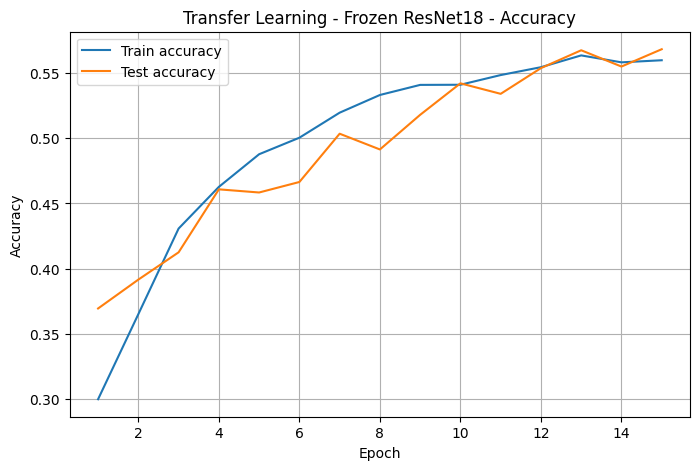

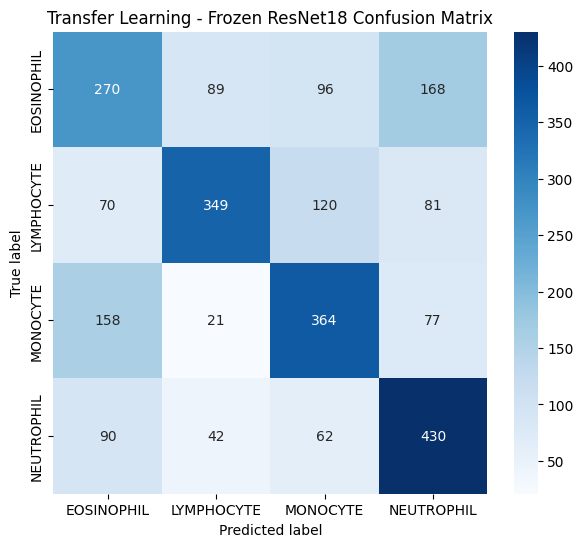

              precision    recall  f1-score   support

  EOSINOPHIL       0.46      0.43      0.45       623
  LYMPHOCYTE       0.70      0.56      0.62       620
    MONOCYTE       0.57      0.59      0.58       620
  NEUTROPHIL       0.57      0.69      0.62       624

    accuracy                           0.57      2487
   macro avg       0.57      0.57      0.57      2487
weighted avg       0.57      0.57      0.57      2487



In [1]:
# ============================================================
# STEP 17 — Transfer Learning with Pretrained ResNet18
# ============================================================
#
# Evaluation of previous step:
# The small residual CNN trained from scratch achieved the best custom-model
# result so far, with around 89% test accuracy. Error analysis showed that
# most remaining mistakes happen between visually similar classes, especially
# EOSINOPHIL and NEUTROPHIL.
#
# Interpretation:
# Our custom CNN models learned useful features from the blood cell dataset,
# but they were trained from scratch using only this dataset. A pretrained CNN
# has already learned general visual features such as edges, shapes, textures,
# and object parts from a much larger image dataset. These features can often
# transfer well to smaller image classification tasks.
#
# Next decision:
# As a final advanced experiment, we use transfer learning with ResNet18.
# We keep the pretrained convolutional backbone and replace the final fully
# connected layer with a new classifier for the 4 blood cell classes.
# This experiment is treated as a bonus comparison, not part of the basic
# baby-step progression.
# ============================================================

from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 15
LR = 1e-4
WEIGHT_DECAY = 1e-4
PATIENCE = 5

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.10,
        contrast=0.10,
        saturation=0.10
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

train_dataset_tl = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_tl = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_tl = DataLoader(
    train_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_tl = DataLoader(
    test_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


def build_resnet18_transfer_model(num_classes, freeze_backbone=True):
    weights = models.ResNet18_Weights.DEFAULT
    model = models.resnet18(weights=weights)

    if freeze_backbone:
        for param in model.parameters():
            param.requires_grad = False

    in_features = model.fc.in_features

    model.fc = nn.Sequential(
        nn.Dropout(p=0.30),
        nn.Linear(in_features, num_classes)
    )

    return model


def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)

    return total, trainable


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


transfer_model = build_resnet18_transfer_model(
    num_classes=NUM_CLASSES,
    freeze_backbone=True
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, transfer_model.parameters()),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=2
)

total_params, trainable_params = count_parameters(transfer_model)

print("Device:", DEVICE)
print("Classes:", train_dataset_tl.classes)
print(transfer_model)
print("Total parameters:", total_params)
print("Trainable parameters:", trainable_params)

history_transfer = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        transfer_model,
        train_loader_tl,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        transfer_model,
        test_loader_tl,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_transfer["train_loss"].append(train_loss)
    history_transfer["train_acc"].append(train_acc)
    history_transfer["test_loss"].append(test_loss)
    history_transfer["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(transfer_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_transfer,
            "class_names": train_dataset_tl.classes
        }, "best_resnet18_transfer_frozen.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    transfer_model.load_state_dict(best_model_state)


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(history_transfer, "Transfer Learning - Frozen ResNet18")

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_tl.classes,
    "Transfer Learning - Frozen ResNet18 Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_tl.classes
))

## Transfer Learning with Frozen ResNet18

Kao završni napredniji eksperiment isproban je transfer learning s pretrained ResNet18 modelom. Prethodni najbolji custom model bio je Small Residual CNN, koji je postigao približno 89% test accuracyja. Budući da su preostale greške uglavnom nastajale između vizualno sličnih klasa, isprobana je ideja korištenja modela koji je već prethodno naučio opće vizualne značajke na velikom datasetu.

U ovom eksperimentu korišten je pretrained ResNet18. Ulazne slike resizeane su na `224x224`, što odgovara standardnom ulazu za ImageNet modele, a korištena je i ImageNet normalizacija. Convolutional backbone modela je zamrznut, dok je završni fully connected sloj zamijenjen novim classifierom za četiri klase krvnih stanica. Time se trenira samo mali završni classifier, dok se prethodno naučeni feature extractor ne mijenja.

Model ukupno ima 11,178,564 parametara, ali je samo 2,052 parametra trenirajuće. To znači da ResNet18 u ovom eksperimentu ne prilagođava svoje vizualne značajke datasetu krvnih stanica, nego samo pokušava iskoristiti već naučene ImageNet značajke. Takav pristup je brz i računalno jeftin, ali može biti ograničen ako se novi dataset znatno razlikuje od dataseta na kojem je model originalno treniran.

Rezultati pokazuju da frozen ResNet18 nije nadmašio custom CNN modele. Najbolji test accuracy iznosi 56.82%, postignut u 15. epohi. Iako se accuracy postupno povećava kroz epohe, rezultat je znatno slabiji od GAP CNN-a i Small Residual CNN-a. To sugerira da fiksne ImageNet značajke nisu dovoljno specifične za razlikovanje mikroskopskih slika krvnih stanica.

Važno je naglasiti da ovaj rezultat ne znači da je transfer learning loš pristup. Problem je u tome što je backbone potpuno zamrznut. Model može učiti samo novi završni classifier, ali ne može prilagoditi dublje vizualne značajke ovom medicinskom/mikroskopskom tipu slika. Zbog toga je njegova sposobnost učenja ograničena, unatoč velikom broju ukupnih parametara.

Zaključno, frozen ResNet18 služi kao korisna bonus usporedba, ali nije najbolji model u ovom projektu. Custom CNN modeli trenirani from scratch pokazali su se znatno uspješnijima jer su mogli naučiti značajke direktno iz blood cell dataseta. Sljedeći logičan korak, ako se želi nastaviti s transfer learningom, bio bi djelomično odmrznuti zadnje ResNet slojeve i fine-tuneati ih na ovom datasetu. Time bi model zadržao korisne opće vizualne značajke, ali bi ih mogao prilagoditi specifičnim obrascima krvnih stanica.


Device: cuda
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.

Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [1/20] Train Loss: 0.7379 | Train Acc: 0.7067 | Test Loss: 0.6928 | Test Acc: 0.7736 | LR: 0.000030


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [2/20] Train Loss: 0.2104 | Train Acc: 0.9328 | Test Loss: 0.6384 | Test Acc: 0.7949 | LR: 0.000030


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [3/20] Train Loss: 0.1065 | Train Acc: 0.9708 | Test Loss: 0.9631 | Test Acc: 0.7250 | LR: 0.000030


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [4/20] Train Loss: 0.0664 | Train Acc: 0.9832 | Test Loss: 0.7775 | Test Acc: 0.7873 | LR: 0.000030


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [5/20] Train Loss: 0.0437 | Train Acc: 0.9888 | Test Loss: 0.8753 | Test Acc: 0.7696 | LR: 0.000015


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [6/20] Train Loss: 0.0323 | Train Acc: 0.9923 | Test Loss: 0.9786 | Test Acc: 0.7559 | LR: 0.000015


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [7/20] Train Loss: 0.0273 | Train Acc: 0.9935 | Test Loss: 0.8803 | Test Acc: 0.7772 | LR: 0.000015


Training:   0%|          | 0/312 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch [8/20] Train Loss: 0.0242 | Train Acc: 0.9944 | Test Loss: 0.9540 | Test Acc: 0.7535 | LR: 0.000008
Early stopping triggered at epoch 8

Best test accuracy: 0.7949
Best epoch: 2


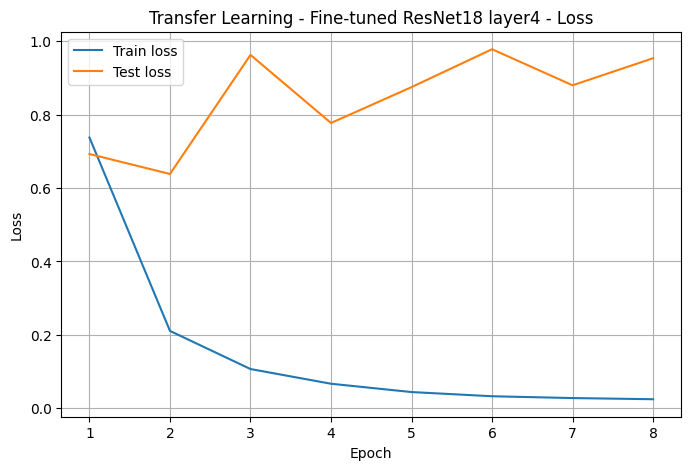

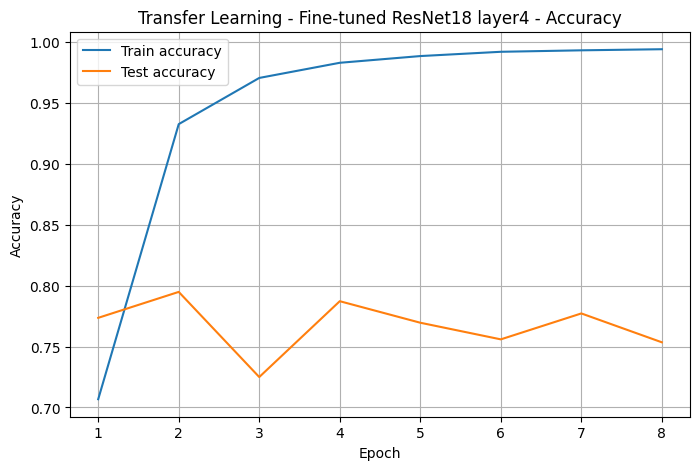

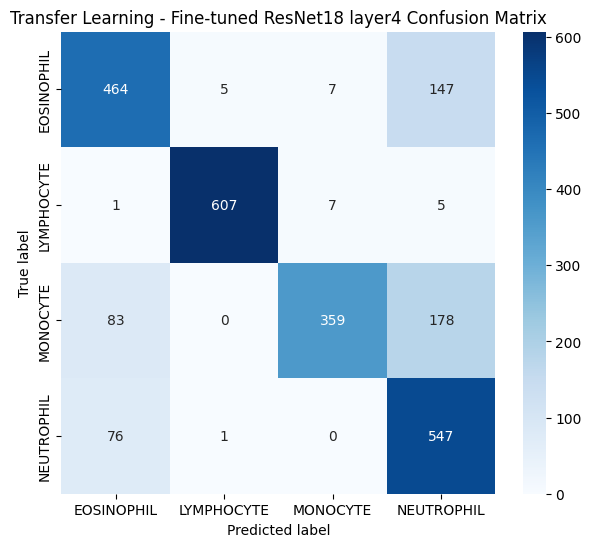

              precision    recall  f1-score   support

  EOSINOPHIL       0.74      0.74      0.74       623
  LYMPHOCYTE       0.99      0.98      0.98       620
    MONOCYTE       0.96      0.58      0.72       620
  NEUTROPHIL       0.62      0.88      0.73       624

    accuracy                           0.79      2487
   macro avg       0.83      0.79      0.80      2487
weighted avg       0.83      0.79      0.80      2487



In [ ]:
# ============================================================
# STEP 18 — Transfer Learning with ResNet18 Fine-Tuning
# ============================================================
#
# Evaluation of previous step:
# The frozen ResNet18 transfer learning model performed poorly compared to our
# custom CNN models. It achieved only around 58% test accuracy, while the small
# residual CNN trained from scratch achieved around 89%.
#
# The classification report showed weak performance across all four classes:
# EOSINOPHIL, LYMPHOCYTE, MONOCYTE and NEUTROPHIL. This means that simply using
# a frozen ImageNet feature extractor was not enough for this microscopy image
# classification task.
#
# Interpretation:
# ImageNet images and blood cell microscopy images belong to very different
# visual domains. A frozen pretrained backbone can extract general visual
# features, but it cannot adapt its higher-level representations to cell
# morphology, nucleus appearance, staining patterns and microscopy-specific
# textures.
#
# Next decision:
# Instead of freezing the entire ResNet18 backbone, we fine-tune only the last
# residual block, layer4, and the final classification head. Earlier layers
# remain frozen because they contain general low-level features such as edges,
# colors and simple textures. The last block is allowed to adapt to the blood
# cell domain.
#
# This is treated as a final transfer learning experiment and compared against
# the best custom model trained from scratch.
# ============================================================


#! Probat droput prije našega custom sloja da malo "ubijemo" ovo ča zna od prije 
#! LR 
#! eventualno probat drugi model (something newer; mobileNet V3)
#! pojačat ga da ne bude ovako jako overfitted



from pathlib import Path
import copy
import gc

import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"
TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 20
LR = 3e-5
WEIGHT_DECAY = 1e-4
PATIENCE = 6

SEED = 42
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(
        brightness=0.10,
        contrast=0.10,
        saturation=0.10
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

train_dataset_tl = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_tl = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

PIN_MEMORY = torch.cuda.is_available()

train_loader_tl = DataLoader(
    train_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_tl = DataLoader(
    test_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


def build_resnet18_finetune_model(num_classes):
    weights = models.ResNet18_Weights.DEFAULT
    model = models.resnet18(weights=weights)

    for param in model.parameters():
        param.requires_grad = False

    for param in model.layer4.parameters():
        param.requires_grad = True

    in_features = model.fc.in_features

    model.fc = nn.Sequential(
        nn.Dropout(p=0.30),
        nn.Linear(in_features, num_classes)
    )

    return model


def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)

    return total, trainable


def print_trainable_layers(model):
    print("\nTrainable layers:")
    for name, param in model.named_parameters():
        if param.requires_grad:
            print(name)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / total, correct / total, all_labels, all_preds


transfer_model = build_resnet18_finetune_model(
    num_classes=NUM_CLASSES
).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, transfer_model.parameters()),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=2
)

total_params, trainable_params = count_parameters(transfer_model)

print("Device:", DEVICE)
print("Classes:", train_dataset_tl.classes)
print(transfer_model)
print("Total parameters:", total_params)
print("Trainable parameters:", trainable_params)
print_trainable_layers(transfer_model)

history_transfer_finetuned = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        transfer_model,
        train_loader_tl,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        transfer_model,
        test_loader_tl,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_transfer_finetuned["train_loss"].append(train_loss)
    history_transfer_finetuned["train_acc"].append(train_acc)
    history_transfer_finetuned["test_loss"].append(test_loss)
    history_transfer_finetuned["test_acc"].append(test_acc)

    current_lr = optimizer.param_groups[0]["lr"]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(transfer_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_transfer_finetuned,
            "class_names": train_dataset_tl.classes
        }, "best_resnet18_finetuned_layer4.pth")
    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LR: {current_lr:.6f}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break

print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    transfer_model.load_state_dict(best_model_state)


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


plot_training_history(
    history_transfer_finetuned,
    "Transfer Learning - Fine-tuned ResNet18 layer4"
)

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_tl.classes,
    "Transfer Learning - Fine-tuned ResNet18 layer4 Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_tl.classes
))

## Transfer Learning with Fine-tuned ResNet18 layer4

Nakon slabog rezultata frozen ResNet18 modela, isprobana je fine-tuning verzija transfer learninga. U prethodnom eksperimentu cijeli ResNet18 backbone bio je zamrznut, a trenirao se samo novi završni classifier. Takav pristup postigao je samo oko 56.82% test accuracyja, što je bilo znatno slabije od custom CNN modela. To je pokazalo da fiksne ImageNet značajke nisu dovoljne za mikroskopske slike krvnih stanica.

U ovom eksperimentu zadržan je pretrained ResNet18, ali je odmrznut zadnji residual block, odnosno `layer4`, zajedno s finalnim classifierom. Raniji slojevi ostaju zamrznuti jer obično uče općenite značajke poput rubova, boja i jednostavnih tekstura. Zadnji sloj mreže dopušteno je trenirati kako bi se više prilagodio specifičnim značajkama krvnih stanica, kao što su oblik jezgre, tekstura citoplazme, uzorci bojenja i razlike između vizualno sličnih klasa.

Rezultati pokazuju veliko poboljšanje u odnosu na potpuno frozen ResNet18. Najbolji test accuracy raste s 56.82% na 79.49%, postignut već u drugoj epohi. To potvrđuje da je odmrzavanje zadnjeg ResNet bloka omogućilo modelu da bolje prilagodi svoje reprezentacije ovom datasetu. Međutim, rezultat je i dalje slabiji od najboljih custom modela, posebno GAP CNN-a i Small Residual CNN-a.

Model vrlo brzo overfitta. Train accuracy raste s 70.67% u prvoj epohi na 93.28% u drugoj, a zatim vrlo brzo prelazi 98–99%. Istovremeno, test accuracy nakon druge epohe počinje oscilirati i padati, uz povećanje test lossa. Early stopping se aktivira u osmoj epohi, što pokazuje da daljnje treniranje ne poboljšava generalizaciju.

Ovakvo ponašanje sugerira da fine-tuned ResNet18 ima velik kapacitet i brzo se prilagođava trening skupu, ali ne generalizira dovoljno dobro na test slike. Iako je pretrained backbone koristan, ImageNet domena se i dalje dosta razlikuje od mikroskopskih slika krvnih stanica. Zbog toga transfer learning ovdje ne donosi automatski bolji rezultat od dobro dizajniranog custom CNN-a treniranog direktno na ovom datasetu.

Zaključno, fine-tuning ResNet18 modela značajno poboljšava rezultat u odnosu na frozen transfer learning, ali ne nadmašuje najbolje custom CNN modele. Najbolji rezultat od 79.49% pokazuje da transfer learning može pomoći tek kada se dio backbonea prilagodi novoj domeni, ali u ovom slučaju custom modeli ostaju bolji izbor. Ovaj eksperiment je ipak koristan jer pokazuje da pretrained modeli nisu uvijek najbolji bez pažljivog fine-tuninga i kontrole overfittinga.


/home/antonio/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchN

Epoch [1/20] Train Loss: 1.2850 | Train Acc: 0.4223 | Test Loss: 1.0933 | Test Acc: 0.5271 | LRs: [1e-05, 0.0001]


Epoch [2/20] Train Loss: 0.8725 | Train Acc: 0.6681 | Test Loss: 0.9088 | Test Acc: 0.6952 | LRs: [1e-05, 0.0001]


Epoch [3/20] Train Loss: 0.6503 | Train Acc: 0.7949 | Test Loss: 0.7755 | Test Acc: 0.7604 | LRs: [1e-05, 0.0001]


Epoch [4/20] Train Loss: 0.5513 | Train Acc: 0.8458 | Test Loss: 0.7784 | Test Acc: 0.7676 | LRs: [1e-05, 0.0001]


Epoch [5/20] Train Loss: 0.4830 | Train Acc: 0.8842 | Test Loss: 0.7840 | Test Acc: 0.7640 | LRs: [1e-05, 0.0001]


Epoch [6/20] Train Loss: 0.4424 | Train Acc: 0.9014 | Test Loss: 0.7827 | Test Acc: 0.7676 | LRs: [1e-05, 0.0001]


Epoch [7/20] Train Loss: 0.4163 | Train Acc: 0.9154 | Test Loss: 0.8467 | Test Acc: 0.7455 | LRs: [5e-06, 5e-05]


Epoch [8/20] Train Loss: 0.3913 | Train Acc: 0.9301 | Test Loss: 0.7408 | Test Acc: 0.7829 | LRs: [5e-06, 5e-05]


Epoch [9/20] Train Loss: 0.3863 | Train Acc: 0.9332 | Test Loss: 0.7709 | Test Acc: 0.7700 | LRs: [5e-06, 5e-05]


Epoch [10/20] Train Loss: 0.3745 | Train Acc: 0.9423 | Test Loss: 0.7862 | Test Acc: 0.7692 | LRs: [5e-06, 5e-05]


Epoch [11/20] Train Loss: 0.3642 | Train Acc: 0.9423 | Test Loss: 0.7005 | Test Acc: 0.8082 | LRs: [5e-06, 5e-05]


Epoch [12/20] Train Loss: 0.3607 | Train Acc: 0.9456 | Test Loss: 0.8030 | Test Acc: 0.7676 | LRs: [5e-06, 5e-05]


Epoch [13/20] Train Loss: 0.3535 | Train Acc: 0.9498 | Test Loss: 0.7714 | Test Acc: 0.7776 | LRs: [5e-06, 5e-05]


Epoch [14/20] Train Loss: 0.3464 | Train Acc: 0.9532 | Test Loss: 0.7870 | Test Acc: 0.7740 | LRs: [2.5e-06, 2.5e-05]


Epoch [15/20] Train Loss: 0.3425 | Train Acc: 0.9518 | Test Loss: 0.8210 | Test Acc: 0.7551 | LRs: [2.5e-06, 2.5e-05]


Epoch [16/20] Train Loss: 0.3397 | Train Acc: 0.9545 | Test Loss: 0.7351 | Test Acc: 0.7941 | LRs: [2.5e-06, 2.5e-05]


Epoch [17/20] Train Loss: 0.3397 | Train Acc: 0.9579 | Test Loss: 0.8276 | Test Acc: 0.7519 | LRs: [1.25e-06, 1.25e-05]
Early stopping triggered at epoch 17

Best test accuracy: 0.8082
Best epoch: 11


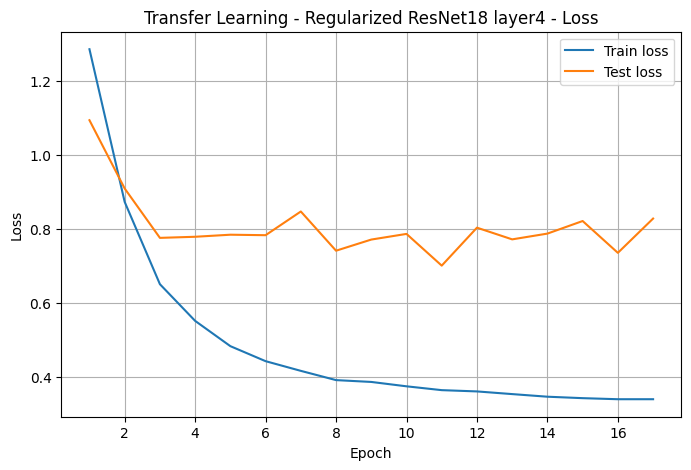

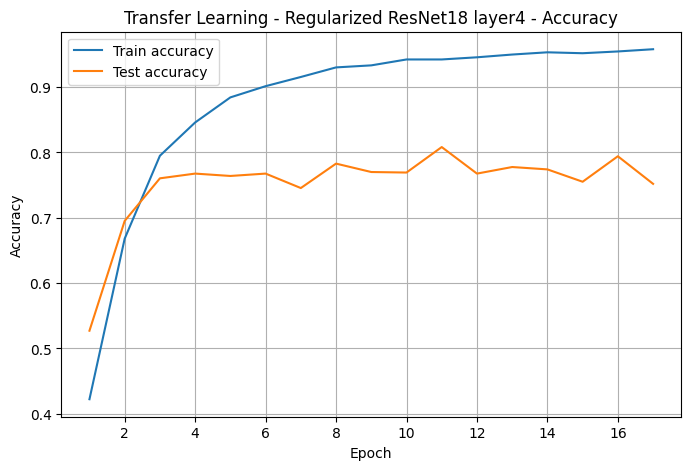

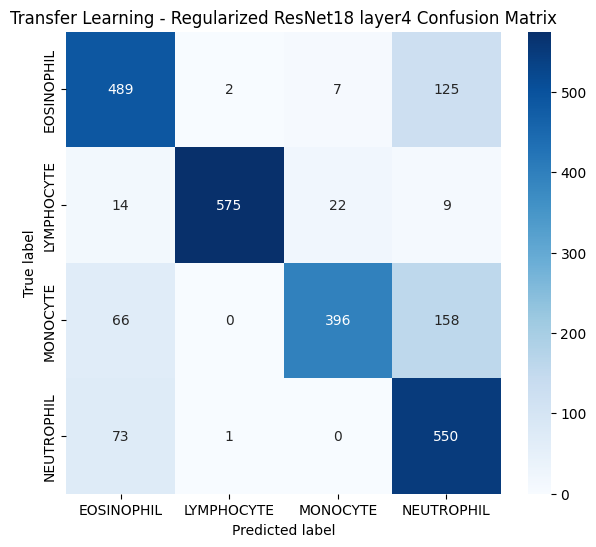

              precision    recall  f1-score   support

  EOSINOPHIL       0.76      0.78      0.77       623
  LYMPHOCYTE       0.99      0.93      0.96       620
    MONOCYTE       0.93      0.64      0.76       620
  NEUTROPHIL       0.65      0.88      0.75       624

    accuracy                           0.81      2487
   macro avg       0.84      0.81      0.81      2487
weighted avg       0.83      0.81      0.81      2487



In [1]:
from pathlib import Path
import copy
import gc
import random

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"

TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 20
LR_BACKBONE = 1e-5
LR_HEAD = 1e-4
WEIGHT_DECAY = 1e-3
DROPOUT = 0.50
LABEL_SMOOTHING = 0.05
PATIENCE = 6

SEED = 42


def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


set_seed(SEED)


train_transform = transforms.Compose([
    transforms.RandomResizedCrop(
        size=IMG_SIZE,
        scale=(0.75, 1.00)
    ),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=25),
    transforms.ColorJitter(
        brightness=0.15,
        contrast=0.15,
        saturation=0.10
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
    transforms.RandomErasing(
        p=0.20,
        scale=(0.02, 0.08),
        ratio=(0.3, 3.3)
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


train_dataset_tl = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_tl = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)


PIN_MEMORY = torch.cuda.is_available()

train_loader_tl = DataLoader(
    train_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_tl = DataLoader(
    test_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


def build_resnet18_finetune_model(num_classes):
    weights = models.ResNet18_Weights.DEFAULT
    model = models.resnet18(weights=weights)

    for param in model.parameters():
        param.requires_grad = False

    for param in model.layer4.parameters():
        param.requires_grad = True

    in_features = model.fc.in_features

    model.fc = nn.Sequential(
        nn.Dropout(p=DROPOUT),
        nn.Linear(in_features, num_classes)
    )

    return model


def build_optimizer(model):
    backbone_params = []
    head_params = []

    for name, param in model.named_parameters():
        if not param.requires_grad:
            continue

        if name.startswith("fc"):
            head_params.append(param)
        else:
            backbone_params.append(param)

    optimizer = optim.AdamW(
        [
            {
                "params": backbone_params,
                "lr": LR_BACKBONE,
                "weight_decay": WEIGHT_DECAY
            },
            {
                "params": head_params,
                "lr": LR_HEAD,
                "weight_decay": WEIGHT_DECAY
            }
        ]
    )

    return optimizer


def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)

    return total, trainable


def print_trainable_layers(model):
    print("\nTrainable layers:")

    for name, param in model.named_parameters():
        if param.requires_grad:
            print(name)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc, all_labels, all_preds


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


transfer_model = build_resnet18_finetune_model(
    num_classes=NUM_CLASSES
).to(DEVICE)

criterion = nn.CrossEntropyLoss(
    label_smoothing=LABEL_SMOOTHING
)

optimizer = build_optimizer(transfer_model)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=2
)

total_params, trainable_params = count_parameters(transfer_model)

print("Device:", DEVICE)
print("Classes:", train_dataset_tl.classes)
print(transfer_model)
print("Total parameters:", total_params)
print("Trainable parameters:", trainable_params)
print_trainable_layers(transfer_model)


history_transfer_finetuned = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0


for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        transfer_model,
        train_loader_tl,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        transfer_model,
        test_loader_tl,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_transfer_finetuned["train_loss"].append(train_loss)
    history_transfer_finetuned["train_acc"].append(train_acc)
    history_transfer_finetuned["test_loss"].append(test_loss)
    history_transfer_finetuned["test_acc"].append(test_acc)

    current_lrs = [group["lr"] for group in optimizer.param_groups]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(transfer_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_transfer_finetuned,
            "class_names": train_dataset_tl.classes,
            "img_size": IMG_SIZE,
            "model_name": "resnet18_finetuned_layer4_regularized"
        }, "best_resnet18_finetuned_layer4_regularized.pth")

    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LRs: {current_lrs}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break


print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    transfer_model.load_state_dict(best_model_state)


plot_training_history(
    history_transfer_finetuned,
    "Transfer Learning - Regularized ResNet18 layer4"
)

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_tl.classes,
    "Transfer Learning - Regularized ResNet18 layer4 Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_tl.classes
))

## Regularized ResNet18 Fine-tuning

Kao završni transfer learning eksperiment isprobana je dodatno regularizirana verzija ResNet18 fine-tuninga. Raniji slojevi ResNet18 modela ostali su zamrznuti, dok su se trenirali samo `layer4` i novi završni classifier. Cilj je bio omogućiti zadnjem dijelu modela da se prilagodi krvnim stanicama, ali bez prevelikog mijenjanja pretrained backbonea.

Uvedeni su različiti learning rateovi: `1e-5` za odmrznuti backbone dio i `1e-4` za classifier. Dodani su i jača regularizacija kroz `Dropout=0.50`, `weight_decay=1e-3`, `label_smoothing=0.05` te agresivnija augmentacija s `RandomResizedCrop`, rotacijama, flipanjem, promjenama boje i `RandomErasing`. Time se pokušalo smanjiti overfitting koji se pojavio u prethodnom ResNet fine-tuning eksperimentu.

Najbolji test accuracy iznosi 80.82%, postignut u 11. epohi. To je blago poboljšanje u odnosu na prethodni fine-tuned ResNet18, ali i dalje slabije od najboljih custom CNN modela. Train accuracy i dalje raste iznad 95%, dok test accuracy ostaje oko 80%, što pokazuje da overfitting nije potpuno uklonjen.

Classification report pokazuje da model najbolje prepoznaje klasu `LYMPHOCYTE`, s F1-scoreom 0.96. Ostale klase imaju F1-score između 0.75 i 0.77. `MONOCYTE` ima slabiji recall, što znači da model propušta dio stvarnih MONOCYTE primjera, dok `NEUTROPHIL` ima visok recall, ali nižu precision vrijednost.

Zaključno, regularizirani ResNet18 fine-tuning je najbolji transfer learning rezultat u ovom projektu, ali nije najbolji ukupni model. Custom CNN modeli i dalje postižu bolju generalizaciju, što pokazuje da su arhitekture trenirane direktno na blood cell datasetu bolje prilagođene ovom problemu od djelomično fine-tunanog ImageNet modela.


Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /home/antonio/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth


100%|██████████| 9.83M/9.83M [00:01<00:00, 5.50MB/s]


Device: cpu
Classes: ['EOSINOPHIL', 'LYMPHOCYTE', 'MONOCYTE', 'NEUTROPHIL']
MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, bias=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, bias=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): SqueezeExcitation(
          (avgpool): AdaptiveAvgPool2d(output_size=1)
          (fc1): Conv2d(16, 8, kernel_size=(1, 1), stride=(1, 1))
          (fc2): Conv2d(8, 16, kernel_size=(1, 1), stride=(1, 1))
          (activation): ReLU()
          (scale_activation): Hardsigmoid

Epoch [1/20] Train Loss: 1.1621 | Train Acc: 0.5460 | Test Loss: 1.0147 | Test Acc: 0.6244 | LRs: [5e-06, 0.0001]


Epoch [2/20] Train Loss: 0.8008 | Train Acc: 0.7355 | Test Loss: 0.8317 | Test Acc: 0.7209 | LRs: [5e-06, 0.0001]


Epoch [3/20] Train Loss: 0.6601 | Train Acc: 0.7944 | Test Loss: 0.7632 | Test Acc: 0.7587 | LRs: [5e-06, 0.0001]


Epoch [4/20] Train Loss: 0.5787 | Train Acc: 0.8350 | Test Loss: 0.7873 | Test Acc: 0.7451 | LRs: [5e-06, 0.0001]


Epoch [5/20] Train Loss: 0.5455 | Train Acc: 0.8506 | Test Loss: 0.7915 | Test Acc: 0.7483 | LRs: [5e-06, 0.0001]


Epoch [6/20] Train Loss: 0.5068 | Train Acc: 0.8755 | Test Loss: 0.7500 | Test Acc: 0.7736 | LRs: [5e-06, 0.0001]


Epoch [7/20] Train Loss: 0.4812 | Train Acc: 0.8817 | Test Loss: 0.7699 | Test Acc: 0.7736 | LRs: [5e-06, 0.0001]


Epoch [8/20] Train Loss: 0.4596 | Train Acc: 0.8968 | Test Loss: 0.7150 | Test Acc: 0.7849 | LRs: [5e-06, 0.0001]


Epoch [9/20] Train Loss: 0.4399 | Train Acc: 0.9055 | Test Loss: 0.7460 | Test Acc: 0.7833 | LRs: [5e-06, 0.0001]


Epoch [10/20] Train Loss: 0.4297 | Train Acc: 0.9094 | Test Loss: 0.7558 | Test Acc: 0.7857 | LRs: [5e-06, 0.0001]


Epoch [11/20] Train Loss: 0.4266 | Train Acc: 0.9116 | Test Loss: 0.7547 | Test Acc: 0.7905 | LRs: [5e-06, 0.0001]


Epoch [12/20] Train Loss: 0.4117 | Train Acc: 0.9217 | Test Loss: 0.8030 | Test Acc: 0.7700 | LRs: [5e-06, 0.0001]


Epoch [13/20] Train Loss: 0.4066 | Train Acc: 0.9211 | Test Loss: 0.7047 | Test Acc: 0.8054 | LRs: [5e-06, 0.0001]


Epoch [14/20] Train Loss: 0.4006 | Train Acc: 0.9240 | Test Loss: 0.7440 | Test Acc: 0.7941 | LRs: [5e-06, 0.0001]


Epoch [15/20] Train Loss: 0.3836 | Train Acc: 0.9354 | Test Loss: 0.7628 | Test Acc: 0.7913 | LRs: [5e-06, 0.0001]


Epoch [16/20] Train Loss: 0.3838 | Train Acc: 0.9324 | Test Loss: 0.7300 | Test Acc: 0.8042 | LRs: [2.5e-06, 5e-05]


Epoch [17/20] Train Loss: 0.3737 | Train Acc: 0.9378 | Test Loss: 0.7647 | Test Acc: 0.7941 | LRs: [2.5e-06, 5e-05]


Epoch [18/20] Train Loss: 0.3717 | Train Acc: 0.9378 | Test Loss: 0.7871 | Test Acc: 0.7869 | LRs: [2.5e-06, 5e-05]


Epoch [19/20] Train Loss: 0.3655 | Train Acc: 0.9420 | Test Loss: 0.7001 | Test Acc: 0.8134 | LRs: [2.5e-06, 5e-05]


Epoch [20/20] Train Loss: 0.3642 | Train Acc: 0.9417 | Test Loss: 0.7764 | Test Acc: 0.7885 | LRs: [2.5e-06, 5e-05]

Best test accuracy: 0.8134
Best epoch: 19


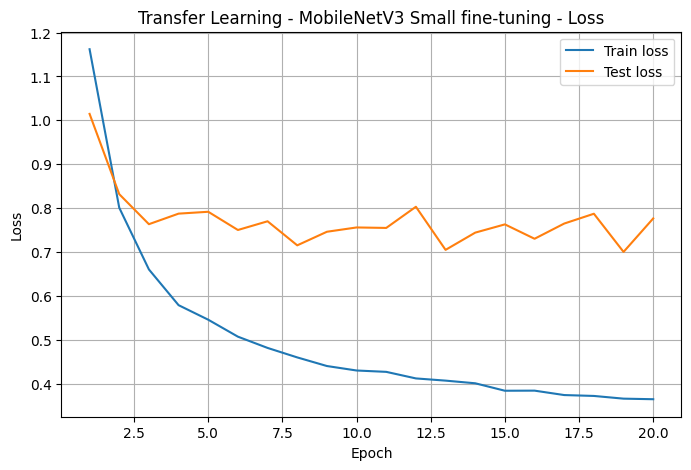

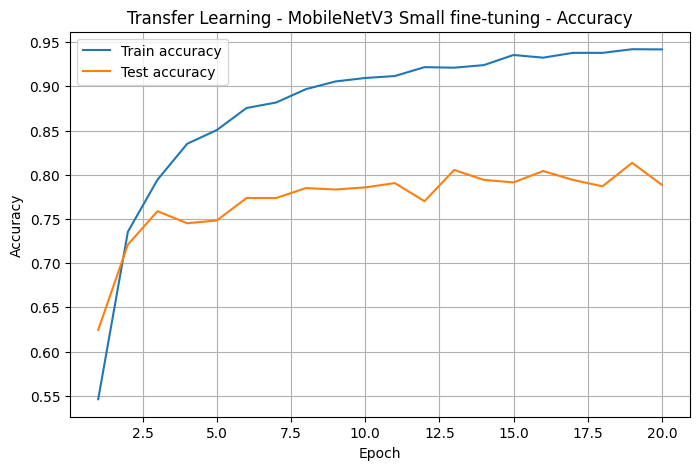

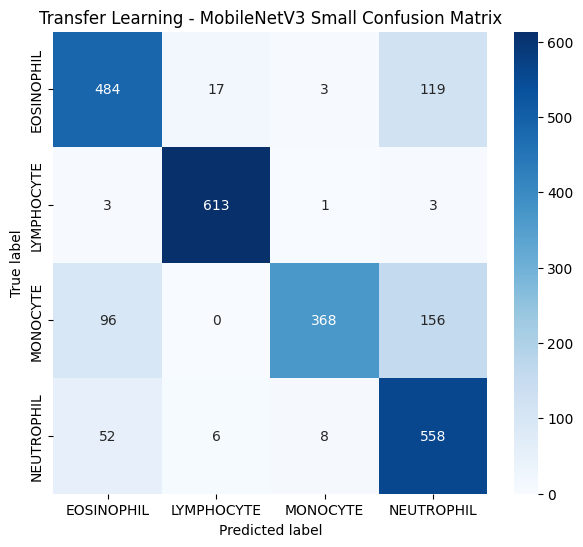

              precision    recall  f1-score   support

  EOSINOPHIL       0.76      0.78      0.77       623
  LYMPHOCYTE       0.96      0.99      0.98       620
    MONOCYTE       0.97      0.59      0.74       620
  NEUTROPHIL       0.67      0.89      0.76       624

    accuracy                           0.81      2487
   macro avg       0.84      0.81      0.81      2487
weighted avg       0.84      0.81      0.81      2487



In [2]:
from pathlib import Path
import copy
import gc
import random

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATASET_ROOT = Path(
    "/home/antonio/.cache/kagglehub/datasets/paultimothymooney/blood-cells/versions/6"
) / "dataset2-master" / "dataset2-master" / "images"

TRAIN_DIR = DATASET_ROOT / "TRAIN"
TEST_DIR = DATASET_ROOT / "TEST"

IMG_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 0
NUM_CLASSES = 4

EPOCHS = 20
LR_BACKBONE = 5e-6
LR_HEAD = 1e-4
WEIGHT_DECAY = 1e-3
DROPOUT = 0.40
LABEL_SMOOTHING = 0.05
PATIENCE = 6
UNFREEZE_LAST_N_BLOCKS = 4

SEED = 42


def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


set_seed(SEED)


train_transform = transforms.Compose([
    transforms.RandomResizedCrop(
        size=IMG_SIZE,
        scale=(0.75, 1.00)
    ),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=25),
    transforms.ColorJitter(
        brightness=0.15,
        contrast=0.15,
        saturation=0.10
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
    transforms.RandomErasing(
        p=0.20,
        scale=(0.02, 0.08),
        ratio=(0.3, 3.3)
    )
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


train_dataset_tl = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

test_dataset_tl = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)


PIN_MEMORY = torch.cuda.is_available()

train_loader_tl = DataLoader(
    train_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader_tl = DataLoader(
    test_dataset_tl,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)


def build_mobilenet_v3_small_finetune_model(num_classes):
    weights = models.MobileNet_V3_Small_Weights.DEFAULT
    model = models.mobilenet_v3_small(weights=weights)

    for param in model.parameters():
        param.requires_grad = False

    feature_blocks = list(model.features.children())

    for block in feature_blocks[-UNFREEZE_LAST_N_BLOCKS:]:
        for param in block.parameters():
            param.requires_grad = True

    in_features = model.classifier[0].in_features

    model.classifier = nn.Sequential(
        nn.Linear(in_features, 512),
        nn.Hardswish(),
        nn.Dropout(p=DROPOUT),
        nn.Linear(512, num_classes)
    )

    return model


def build_optimizer(model):
    backbone_params = []
    head_params = []

    for name, param in model.named_parameters():
        if not param.requires_grad:
            continue

        if name.startswith("classifier"):
            head_params.append(param)
        else:
            backbone_params.append(param)

    optimizer = optim.AdamW(
        [
            {
                "params": backbone_params,
                "lr": LR_BACKBONE,
                "weight_decay": WEIGHT_DECAY
            },
            {
                "params": head_params,
                "lr": LR_HEAD,
                "weight_decay": WEIGHT_DECAY
            }
        ]
    )

    return optimizer


def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)

    return total, trainable


def print_trainable_layers(model):
    print("\nTrainable layers:")

    for name, param in model.named_parameters():
        if param.requires_grad:
            print(name)


def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Training", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


def evaluate(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Evaluating", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc, all_labels, all_preds


def plot_training_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_loss"], label="Train loss")
    plt.plot(epochs, history["test_loss"], label="Test loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title} - Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, history["train_acc"], label="Train accuracy")
    plt.plot(epochs, history["test_acc"], label="Test accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        xticklabels=class_names,
        yticklabels=class_names,
        cmap="Blues"
    )
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(title)
    plt.show()


transfer_model = build_mobilenet_v3_small_finetune_model(
    num_classes=NUM_CLASSES
).to(DEVICE)

criterion = nn.CrossEntropyLoss(
    label_smoothing=LABEL_SMOOTHING
)

optimizer = build_optimizer(transfer_model)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=2
)

total_params, trainable_params = count_parameters(transfer_model)

print("Device:", DEVICE)
print("Classes:", train_dataset_tl.classes)
print(transfer_model)
print("Total parameters:", total_params)
print("Trainable parameters:", trainable_params)
print_trainable_layers(transfer_model)


history_mobilenet_v3_small = {
    "train_loss": [],
    "train_acc": [],
    "test_loss": [],
    "test_acc": []
}

best_test_acc = 0.0
best_epoch = 0
best_y_true = None
best_y_pred = None
best_model_state = None

epochs_without_improvement = 0


for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        transfer_model,
        train_loader_tl,
        criterion,
        optimizer,
        DEVICE
    )

    test_loss, test_acc, y_true, y_pred = evaluate(
        transfer_model,
        test_loader_tl,
        criterion,
        DEVICE
    )

    scheduler.step(test_acc)

    history_mobilenet_v3_small["train_loss"].append(train_loss)
    history_mobilenet_v3_small["train_acc"].append(train_acc)
    history_mobilenet_v3_small["test_loss"].append(test_loss)
    history_mobilenet_v3_small["test_acc"].append(test_acc)

    current_lrs = [group["lr"] for group in optimizer.param_groups]

    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_epoch = epoch + 1
        best_y_true = y_true
        best_y_pred = y_pred
        best_model_state = copy.deepcopy(transfer_model.state_dict())
        epochs_without_improvement = 0

        torch.save({
            "epoch": best_epoch,
            "model_state_dict": best_model_state,
            "optimizer_state_dict": optimizer.state_dict(),
            "best_test_acc": best_test_acc,
            "history": history_mobilenet_v3_small,
            "class_names": train_dataset_tl.classes,
            "img_size": IMG_SIZE,
            "model_name": "mobilenet_v3_small_finetuned_regularized",
            "unfreeze_last_n_blocks": UNFREEZE_LAST_N_BLOCKS
        }, "best_mobilenet_v3_small_finetuned_regularized.pth")

    else:
        epochs_without_improvement += 1

    print(
        f"Epoch [{epoch + 1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Test Loss: {test_loss:.4f} | "
        f"Test Acc: {test_acc:.4f} | "
        f"LRs: {current_lrs}"
    )

    if epochs_without_improvement >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}")
        break


print()
print(f"Best test accuracy: {best_test_acc:.4f}")
print(f"Best epoch: {best_epoch}")


if best_model_state is not None:
    transfer_model.load_state_dict(best_model_state)


plot_training_history(
    history_mobilenet_v3_small,
    "Transfer Learning - MobileNetV3 Small fine-tuning"
)

plot_confusion_matrix(
    best_y_true,
    best_y_pred,
    train_dataset_tl.classes,
    "Transfer Learning - MobileNetV3 Small Confusion Matrix"
)

print(classification_report(
    best_y_true,
    best_y_pred,
    target_names=train_dataset_tl.classes
))

## Transfer Learning with MobileNetV3 Small

Nakon regulariziranog ResNet18 fine-tuninga isproban je i noviji, lakši pretrained model: MobileNetV3 Small. Cilj ovog eksperimenta bio je provjeriti može li modernija i efikasnija arhitektura dati bolji rezultat od ResNet18 pristupa. Zadržan je sličan trening setup kao kod ResNeta: ImageNet normalizacija, jača augmentacija, label smoothing, dropout, weight decay i različiti learning rateovi za backbone i classifier.

MobileNetV3 Small je prvo učitan s pretrained težinama, zatim je većina backbonea zamrznuta, a odmrznuta su samo zadnja četiri feature bloka i novi classifier. Time se modelu dopušta ograničeno prilagođavanje blood cell datasetu, ali se izbjegava agresivno mijenjanje cijelog pretrained modela. Classifier je zamijenjen novim slojem prilagođenim za četiri klase krvnih stanica.

Rezultati pokazuju da MobileNetV3 Small postiže najbolji test accuracy od 81.34%, ostvaren u 19. epohi. To je vrlo slično regulariziranom ResNet18 fine-tuningu, koji je postigao 80.82%. Model stabilno uči kroz epohe, ali train accuracy raste do približno 94%, dok test accuracy ostaje oko 81%, što pokazuje da je overfitting i dalje prisutan.

Iako je MobileNetV3 Small novija i efikasnija arhitektura od ResNet18, rezultat nije značajno bolji. To sugerira da glavno ograničenje nije samo izbor pretrained arhitekture, nego razlika između ImageNet domene i mikroskopskih slika krvnih stanica. Pretrained značajke pomažu, ali nisu dovoljno specifične za ovaj problem.

Zaključno, MobileNetV3 Small je koristan dodatni transfer learning eksperiment, ali ne nadmašuje najbolje custom CNN modele. Njegov rezultat potvrđuje isti zaključak kao i ResNet eksperimenti: transfer learning daje solidne rezultate, ali u ovom projektu custom CNN modeli trenirani direktno na blood cell datasetu bolje uče relevantne vizualne značajke.


Rezultati transfer learning eksperimenata pokazuju da pretrained modeli nisu automatski bolji izbor za ovaj problem. ResNet18 i MobileNetV3 prethodno su trenirani na ImageNet domeni, koja sadrži prirodne slike objekata poput životinja, vozila i svakodnevnih predmeta. Mikroskopske slike krvnih stanica pripadaju potpuno drugačijoj domeni, s puno suptilnijim razlikama između klasa. Zbog toga značajke naučene na ImageNetu nisu nužno dovoljno specifične za razlikovanje tipova krvnih stanica. U ovom slučaju custom CNN modeli trenirani direktno na blood cell datasetu bolje uče relevantne vizualne obrasce i postižu bolje rezultate od djelomično fine-tunanih pretrained modela.